# Initialize Notebook

In [675]:
import numpy as np
import pandas as pd
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
import math
import seaborn as sns
import plotly.express as px
import plotly.figure_factory as ff
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from IPython.display import display, Markdown
import ipywidgets as widgets
from datetime import datetime, timedelta
import re
import json
from nltk.tokenize import sent_tokenize
import statsmodels.formula.api as smf
import statsmodels.api as sm
from statsmodels.formula.api import ols
from statsmodels.stats.multitest import multipletests
from statsmodels.stats.power import FTestPower
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.multivariate.manova import MANOVA
from statsmodels.stats.power import FTestAnovaPower
from linearmodels.system import SUR
import statsmodels.stats.power as smp
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.utils import resample
import networkx as nx
from graphlib import TopologicalSorter
from scipy.cluster.hierarchy import linkage, dendrogram
from scipy import stats
from scipy.stats import zscore, pearsonr
from scipy.spatial.distance import cosine
from scipy.stats import chi2_contingency, f_oneway, ttest_ind
from scipy.stats import shapiro, levene, kruskal
from scipy.stats import ttest_rel
import os
import ast
import warnings
import pingouin as pg
from pingouin import cronbach_alpha
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit
from factor_analyzer import FactorAnalyzer
from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity, calculate_kmo
from textblob import TextBlob
from transformers import MarianMTModel, MarianTokenizer
from sklearn.feature_extraction.text import TfidfVectorizer

# Data Preprocessing

## Load Data

In [442]:
# Load the CSV file from experiment survey 
df_raw = pd.read_csv('./data/experiment_raw_data.csv')

In [443]:
# Load the CSV file from evaluation survey
df_eval_raw = pd.read_csv('./data/evaluator_raw_data.csv', delimiter='\t', quoting=0, encoding='utf-16')

## Data Wrangling

### Renaming

In [444]:
# Function to read the column mappings from text file
def read_column_mappings(file_path):
    column_mappings = {}
    with open(file_path, 'r') as file:
        for line in file:
            if '=' in line:
                old_name, new_name = line.strip().split('=')
                column_mappings[old_name] = new_name
    return column_mappings

# Read column mappings from the text file
column_mappings = read_column_mappings('./data/column_names.txt')

# Rename columns in df
df = df_raw.rename(columns=column_mappings)

# Drop information row
df = df.drop(index=0)

In [445]:
# Rename df of evaluation survey
column_mappings_eval = read_column_mappings('./data/column_names_eval.txt')
df_eval = df_eval_raw.rename(columns=column_mappings_eval)

# Drop information row
df_eval = df_eval.drop(index=0)

### Data Cleaning

In [446]:
# Drop unnecessary columns
df = df.drop(columns=['SERIAL','P117_01', 'P133', 'REF', 'QUESTNNR', 'MODE', 'A501', 'A504_CP', 'MAILSENT', 'LASTPAGE', 'MISSING', 'MISSREL', 'P107_23', 'P107_24', 'P203', 'P203_01', 'P203_02', 'P203_03'])

# Drop unnecessary columns evaluation survey
df_eval = df_eval.drop(columns=['SERIAL', 'REF', 'QUESTNNR', 'MODE', 'LANGUAGE', 'MAILSENT', 'LASTPAGE', 'MISSING', 'MISSREL', 'Q_VIEWER', 'MAXPAGE', 'P206_07', 'P206_09', 'P206_11', 'P206_13'])

# Check if cases unique
df['CASE'].is_unique

True

#### Error Handling

In [447]:
# Drop ratings with failed display of story
df.loc[df['CORRECT_STORY1'].isna(), [col for col in df.columns if col.startswith('EVAL1')]] = np.nan
df.loc[df['CORRECT_STORY2'].isna(), [col for col in df.columns if col.startswith('EVAL2')]] = np.nan

#### Standardization

In [448]:
# Convert group category to strings
df['GROUP'] = df['GROUP'].astype(str)

In [449]:
# Convert likert scale to floats
preq_cols = [col for col in df.columns if col.startswith('PreQ')]
for col in preq_cols:
    df[col] = df[col].astype(float)
post_cols = [col for col in df.columns if col.startswith('PostQ')]
for col in post_cols:
    df[col] = df[col].astype(float)

In [450]:
# Convert STARTED to datetime with UTC timezone
df['STARTED'] = pd.to_datetime(df['STARTED']).dt.tz_localize('UTC')
df['LASTDATA'] = pd.to_datetime(df['LASTDATA']).dt.tz_localize('UTC')

In [451]:
# Convert time variables to datetime
df['STARTED'] = pd.to_datetime(df['STARTED'])
df['FIRST_NOTES_TIME'] = pd.to_datetime(df['FIRST_NOTES_TIME'])
df['FIRST_QUERY_TIME'] = pd.to_datetime(df['FIRST_QUERY_TIME'])
df['FIRST_STORY_INPUT_TIME'] = pd.to_datetime(df['FIRST_STORY_INPUT_TIME'])
df['LASTDATA'] = pd.to_datetime(df['LASTDATA'])
df['REV_FIRST_NOTES_TIME'] = pd.to_datetime(df['REV_FIRST_NOTES_TIME'])
df['REV_FIRST_STORY_INPUT_TIME'] = pd.to_datetime(df['REV_FIRST_STORY_INPUT_TIME'])
df['CLICK_CREATIVITY_TIME'] = pd.to_datetime(df['CLICK_CREATIVITY_TIME'])
df['CLICK_WRITING_TIME'] = pd.to_datetime(df['CLICK_WRITING_TIME'])

Correcting for different timezones of recorded times:

In [452]:
# Function to adjust variables in local time to be in the same timezone as STARTED
time_diffs = []
def adjust_local_time(started, local_time):
    if pd.notna(local_time):
        # Calculate the absolute difference in seconds
        time_diff = abs((started - local_time).total_seconds())
        time_diffs.append(time_diff)
        # Handle time differences in 30-minute increments
        for i in range(0, int(time_diff // 1800) * 30 + 30, 30):
            if time_diff < (i + 30) * 60:
                return local_time + pd.Timedelta(minutes=i + 30)
    return local_time

# Apply the function to adjust all time variables and check maximum time difference to UTC time (STARTED)
df['FIRST_NOTES_TIME_UTC'] = df.apply(lambda row: adjust_local_time(row['STARTED'], row['FIRST_NOTES_TIME']), axis=1)
print("Maximum time difference first notes:", max(time_diffs))
df['FIRST_STORY_INPUT_TIME_UTC'] = df.apply(lambda row: adjust_local_time(row['STARTED'], row['FIRST_STORY_INPUT_TIME']), axis=1)
print("Maximum time difference story input:", max(time_diffs))
df['FIRST_QUERY_TIME_UTC'] = df.apply(lambda row: adjust_local_time(row['STARTED'], row['FIRST_QUERY_TIME']), axis=1)
print("Maximum time difference query time:", max(time_diffs))
df['REV_FIRST_NOTES_TIME_UTC'] = df.apply(lambda row: adjust_local_time(row['STARTED'], row['REV_FIRST_NOTES_TIME']), axis=1)
print("Maximum time difference REV_FIRST_NOTES_TIME:", max(time_diffs))
df['REV_FIRST_STORY_INPUT_TIME_UTC'] = df.apply(lambda row: adjust_local_time(row['STARTED'], row['REV_FIRST_STORY_INPUT_TIME']), axis=1)
print("Maximum time difference REV_FIRST_STORY_INPUT_TIME:", max(time_diffs))
df['CLICK_CREATIVITY_TIME_UTC'] = df.apply(lambda row: adjust_local_time(row['STARTED'], row['CLICK_CREATIVITY_TIME']), axis=1)
print("Maximum time difference CLICK_CREATIVITY_TIME:", max(time_diffs))
df['CLICK_WRITING_TIME_UTC'] = df.apply(lambda row: adjust_local_time(row['STARTED'], row['CLICK_WRITING_TIME']), axis=1)
print("Maximum time difference CLICK_WRITING_TIME:", max(time_diffs))

Maximum time difference first notes: 6990.899
Maximum time difference story input: 167226.326
Maximum time difference query time: 167226.326
Maximum time difference REV_FIRST_NOTES_TIME: 168088.877
Maximum time difference REV_FIRST_STORY_INPUT_TIME: 168088.877
Maximum time difference CLICK_CREATIVITY_TIME: 168088.877
Maximum time difference CLICK_WRITING_TIME: 168088.877


In [453]:
# Create numerical columns of demographics
df['Gender'] = df['GENDER'].astype(int)
df['Education'] = df['EDUCATION'].astype(int)
df['Education'] = df['Education'].replace({6: 5, 7: 6, 8: 7}) # Adjust for missing number 5
df['Age'] = df['AGE'].astype(int)

In [454]:
# Standardize
scaler = StandardScaler()
df['Age_standardized'] = scaler.fit_transform(df[['Age']])
df['Education_standardized'] = scaler.fit_transform(df[['Education']])
df['AITrust_standardized'] = scaler.fit_transform(df[['PreQGPT_AITrust']])
df['Gender_standardized'] = scaler.fit_transform(df[['Gender']])

#### Restructuring

##### Combine 'Own Evaluation' Variables

In [455]:
## Make sure each participant got only one set of the own evaluation questionnaire dependend on case ##
# List of cases of own evaluation questionnaire
cases = ['P109', 'P123', 'P122', 'P113', 'P124', 'P125', 'P126', 'P127']

# Function to check if a row contains data for only one case
def check_single_case(row):
    non_null_counts = {case: row.filter(like=case).notnull().sum() for case in cases}
    return sum(count > 0 for count in non_null_counts.values()) == 1

# Apply the function to each row and check for any false data
single_case_rows = df.apply(check_single_case, axis=1)
for row in single_case_rows:
    if row is False:
        print("False")


In [456]:
# Combine overlapping questions into a single column in the df
for case in cases:
    case_columns = df.filter(like=case).columns
    for col in case_columns:
        question = col.split('_')[1]
        combined_col_name = f'OwnEvaluation_{question}'
        if combined_col_name not in df.columns:
            df[combined_col_name] = df[col]
        else:
            df[combined_col_name] = df[combined_col_name].combine_first(df[col])

# Drop the original, now redundand columns
df_not_combined = df
df = df_not_combined.drop(columns=[col for case in cases for col in df.filter(like=case).columns])

In [457]:
# Function to read the column mappings from a text file
def read_column_mappings(file_path):
    column_mappings = {}
    with open(file_path, 'r') as file:
        for line in file:
            if '=' in line:
                old_name, new_name = line.strip().split('=')
                column_mappings[old_name] = new_name
    return column_mappings

# Read column mappings from the text file
column_mappings = read_column_mappings('./data/column_names.txt')

# Rename columns in the DataFrame
df= df.rename(columns=column_mappings)

In [458]:
# Rename variables, and fill NaN GPT questions (Group 1) with 0
df.rename(columns={'PreQGPT_AIEngaged': 'AIExperience'}, inplace=True)
df.rename(columns={'PreQ_CreativeJob': 'CreativePractice'}, inplace=True)
df.rename(columns={'PreQ_CWSkill': 'CW_SelfConcept'}, inplace=True)
df.rename(columns={'OE01_GPT_Affected': 'GPT_Affected'}, inplace=True)
df['GPT_Affected'] = df['GPT_Affected'].fillna(0)
df.rename(columns={'OE02_GPT_Helped': 'GPT_Helped'}, inplace=True)
df['GPT_Helped'] = df['GPT_Helped'].fillna(0)
df.rename(columns={'OE03_GPT_Feedback': 'GPT_Feedback'}, inplace=True)
df['GPT_Feedback'] = df['GPT_Feedback'].fillna(0)
df['Time_On_Task'] = df['TIME012']

##### Map Evaluations

In [459]:
## Filter out the evaluators that did not pay attention ##
# See who gets filtered out
print(len(df_eval))
print((df_eval['EVAL3_AttentionCheck'] != 1).sum())
print((df_eval['EVAL6_AttentionCheck'] != 7).sum())
print(df_eval.loc[df_eval['EVAL3_AttentionCheck'] != 1, 'CASE'])
print(df_eval.loc[df_eval['EVAL6_AttentionCheck'] != 7, 'CASE'])

# Apply filter
df_eval = df_eval.loc[(df_eval['EVAL3_AttentionCheck'] == 1) & (df_eval['EVAL6_AttentionCheck'] == 7)]
print(len(df_eval))

146
1
5
40    1146
Name: CASE, dtype: int64
40     1146
59     1168
97     1214
136    1261
141    1267
Name: CASE, dtype: int64
141


In [460]:
## Map evaluations to participants by taking the average in each score ##
# Ensure that key columns are numeric from ratings in experiment and evaluator survey
df['REVIEWED_STORY1_KEY'] = pd.to_numeric(df['REVIEWED_STORY1_KEY'], errors='coerce')
df['REVIEWED_STORY2_KEY'] = pd.to_numeric(df['REVIEWED_STORY2_KEY'], errors='coerce')
df_eval['Story1'] = pd.to_numeric(df_eval['Story1'], errors='coerce')
df_eval['Story2'] = pd.to_numeric(df_eval['Story2'], errors='coerce')
df_eval['Story3'] = pd.to_numeric(df_eval['Story3'], errors='coerce')
df_eval['Story4'] = pd.to_numeric(df_eval['Story4'], errors='coerce')


# Convert evaluation columns to numeric in both survey dfs
for col in df.columns:
    if col.startswith('EVAL'):
        df[col] = pd.to_numeric(df[col], errors='coerce')

for col in df_eval.columns:
    if col.startswith('EVAL'):
        df_eval[col] = pd.to_numeric(df_eval[col], errors='coerce')

# Create separate dfs for KEY1 with EVAL1 values and KEY2 with EVAL2 values
key1_df = df[['CASE', 'REVIEWED_STORY1_KEY'] + [col for col in df.columns if col.startswith('EVAL1')]].rename(columns={'REVIEWED_STORY1_KEY': 'KEY'})
key2_df = df[['CASE', 'REVIEWED_STORY2_KEY'] + [col for col in df.columns if col.startswith('EVAL2')]].rename(columns={'REVIEWED_STORY2_KEY': 'KEY'})
key3_df = df_eval[['CASE', 'Story1'] + [col for col in df_eval.columns if col.startswith('EVAL3')]].rename(columns={'Story1': 'KEY'})
key4_df = df_eval[['CASE', 'Story2'] + [col for col in df_eval.columns if col.startswith('EVAL4')]].rename(columns={'Story2': 'KEY'})
key5_df = df_eval[['CASE', 'Story3'] + [col for col in df_eval.columns if col.startswith('EVAL5')]].rename(columns={'Story3': 'KEY'})
key6_df = df_eval[['CASE', 'Story4'] + [col for col in df_eval.columns if col.startswith('EVAL6')]].rename(columns={'Story4': 'KEY'})


# Melt the dfs to long format
melted_df1 = pd.melt(key1_df, id_vars=['CASE', 'KEY'], var_name='EVAL', value_name='VALUE')
melted_df2 = pd.melt(key2_df, id_vars=['CASE', 'KEY'], var_name='EVAL', value_name='VALUE')
melted_df3 = pd.melt(key3_df, id_vars=['CASE', 'KEY'], var_name='EVAL', value_name='VALUE')
melted_df4 = pd.melt(key4_df, id_vars=['CASE', 'KEY'], var_name='EVAL', value_name='VALUE')
melted_df5 = pd.melt(key5_df, id_vars=['CASE', 'KEY'], var_name='EVAL', value_name='VALUE')
melted_df6 = pd.melt(key6_df, id_vars=['CASE', 'KEY'], var_name='EVAL', value_name='VALUE')

# Combine the melted dfs
combined_df = pd.concat([melted_df1, melted_df2, melted_df3, melted_df4, melted_df5, melted_df6])

# Group by key and evaluation column, then calculate the mean
avg_values_df = combined_df.groupby(['KEY', 'EVAL'])['VALUE'].mean().unstack().reset_index()

# Aggregate the case numbers (evaluators) for each key
evaluators_df = combined_df.groupby('KEY')['CASE'].apply(lambda x: ', '.join(map(str, x.unique()))).reset_index()
evaluators_df = evaluators_df.rename(columns={'CASE': 'evaluators'})

# Merge the averaged values with the evaluators
df_eval_merge= pd.merge(avg_values_df, evaluators_df, on='KEY')

# Extract relevant columns
eval1_cols = [col for col in df.columns if col.startswith('EVAL1')]
eval2_cols = [col for col in df.columns if col.startswith('EVAL2')]
eval3_cols = [col for col in df_eval.columns if col.startswith('EVAL3')]
eval4_cols = [col for col in df_eval.columns if col.startswith('EVAL4')]
eval5_cols = [col for col in df_eval.columns if col.startswith('EVAL5')]
eval6_cols = [col for col in df_eval.columns if col.startswith('EVAL6')]

# Ensure eval1 and eval2 columns have matching suffixes
suffixes = set(col[len('EVAL1'):] for col in eval1_cols)

# Combine the evaluation columns for averaging
for suffix in suffixes:
    eval1_col = f'EVAL1{suffix}'
    eval2_col = f'EVAL2{suffix}'
    eval3_col = f'EVAL3{suffix}'
    eval4_col = f'EVAL4{suffix}'
    eval5_col = f'EVAL5{suffix}'
    eval6_col = f'EVAL6{suffix}'
    
    df_eval_merge[f'AVG{suffix}'] = (
        df_eval_merge[[eval1_col, eval2_col, eval3_col, eval4_col, eval5_col, eval6_col]]
        .mean(axis=1, skipna=True)
    )
# Filter columns in df eval that start with the prefix
filtered_columns_eval = [col for col in df_eval_merge.columns if col.startswith('AVG')]

# Select the filtered columns plus a key column for merging
df_eval_for_merge = df_eval_merge[filtered_columns_eval + ['KEY', 'evaluators']]

df_eval_for_merge['KEY'] = df_eval_for_merge['KEY'].astype(str)
df_eval_for_merge['KEY'] = df_eval_for_merge['KEY'].str.replace('.0', '').astype(int)
df['CASE'] = df['CASE'].astype(int)

# Merge the average evaluations back into df based on the keys
df = pd.merge(df, df_eval_for_merge, left_on='CASE', right_on='KEY', how='left')

# Rename columns to remove the prefix 'Avg_'
new_column_names = {col: col.replace('AVG_', '') for col in df.columns if col.startswith('AVG_')}
df = df.rename(columns=new_column_names)


### Add DAT scores

In [461]:
# Load from DAT file
dat_df = pd.read_csv('.\data\dat_scores.csv')
dat_df = dat_df[['CASE', 'translated_words', 'DAT']]
dat_df.reset_index(drop=True, inplace=True)

In [462]:
# Ensure the CASE columns are of the same type
df['CASE'] = df['CASE'].astype(str)
dat_df['CASE'] = dat_df['CASE'].astype(str)

# Merge the dataframes on the CASE column
df = pd.merge(df, dat_df, on='CASE', how='left')

In [463]:
# Standardize DAT scores
scaler = StandardScaler()
df['DAT_standardized'] = scaler.fit_transform(df[['DAT']])

### Translate English Stories

In [464]:
# Select the final story
df['STORY'] = df['REV_STORY_FINAL'].fillna(df['STORY_FINAL'])

In [465]:
print(df.loc[df['LANGUAGE'] == 'eng', ['CASE', 'STORY']])

    CASE                                              STORY
13   574  Hatouma était une jeune exploratrice courageus...
34   658  A sense of calm and peace can be experienced a...
44   689  I was sitting peacefully at the school cafeter...
46   694  We started at the bottom of the mountain, look...
48   706  As I stepped through the portal, I found mysel...
57   737  The noise was deafening: A cacophony of sounds...
65   766  The protagonist discover that he is in a stran...
71   777  “You should have been destroyed! Why are you s...
72   779  As the group of friends descended into the dep...
88   812  A boy of 16-24 years old once bet that he woul...
89   814  Lena and her friends, Alex and Maya, discovere...
90   815  In the dense heart of the Amazon, Ken and his ...
91   817  As I am approaching the age of 40 years old I ...
95   824  On one hot day of July, my friend and I were s...
99   829  John always believed that he is living in the ...
107  855  Once there was a lion the king

In [466]:
# Update stories from json file with translations
def update_stories_from_json(df, json_file_path):
    with open(json_file_path, 'r', encoding='utf-8') as file:
        translations = json.load(file)
    
    # Iterate df and update story based on case
    for index, row in df.iterrows():
        case_number = str(row['CASE'])
        if case_number in translations:
            df.at[index, 'STORY'] = translations[case_number]

    return df

df = update_stories_from_json(df, './data/translated_stories.json')

## Feature Engineering

### AI Usage

Prepare df to easier evaluate the AI usage type:

In [467]:
## Get similarity of conversation with ChatGPT and story ##
# Function to compare sentences between query conv and story
def compare_sentences(query_conv, story):
    # Tokenize into sentences
    query_sentences = sent_tokenize(query_conv)
    story_sentences = sent_tokenize(story)
    
    # Compare sentences and count the matches
    matching_sentences = [sentence for sentence in query_sentences if sentence in story_sentences]
    
    return len(matching_sentences), matching_sentences

# Apply comparison function
df['Matching_Sentences_Count'], df['Matching_Sentences'] = zip(
    *df.apply(
        lambda row: compare_sentences(
            str(row['QUERY_CONV']) if pd.notna(row['QUERY_CONV']) else str(row['REV_QUERY_CONV']),
            str(row['STORY'])
        ), axis=1
    )
)

In [468]:
# Get if story was revised or not
df['Matching_Sentences_Count_REV'], df['Matching_Sentences_REV'] = zip(
    *df.apply(lambda row: compare_sentences(row['STORY'], row['STORY_FINAL']), axis=1)
)

Add json with AI usage type classifications:

In [469]:
# Load json and convert to df
with open('./ai_usage_types.json', 'r') as f:
    json_data = json.load(f)

json_df = pd.DataFrame(json_data)

# Create single 'Ghostwriter' type
json_df['Role_of_AI'] = json_df['Role_of_AI'].replace({'Ghostwriter Engineer': 'Ghostwriter', 'Ghostwriter Copyist': 'Ghostwriter'})

# Merge
df = pd.merge(df, json_df, on='CASE', how='left')

In [470]:
# Change NaN in Group 1 to "None" and rename column
df['Role_of_AI'] = df['Role_of_AI'].replace({np.nan: "None"})
df.rename(columns={'Role_of_AI': 'AIUsage'}, inplace=True)

In [471]:
# Adjust naming
df['AIUsage'] = df['AIUsage'].replace('Sounding Board', 'SoundingBoard')
df['AIUsage'] = df['AIUsage'].replace('Tutor/Guide', 'Tutor')
df['AIUsage'] = df['AIUsage'].replace('Editor/Proofreader', 'Editor')

# Create AI Usage dummy variables
usage_dummies = pd.get_dummies(df['AIUsage'], prefix='AIUsage', drop_first=False)
df = pd.concat([df, usage_dummies], axis=1)

# Create Group dummies
group_dummies = pd.get_dummies(df['GROUP'], prefix='GROUP', drop_first=False)
df = pd.concat([df, group_dummies], axis=1)

In [472]:
df['AIUsage_Editor'] =  df['AIUsage_Editor'].astype(int)
df['AIUsage_SoundingBoard'] =  df['AIUsage_SoundingBoard'].astype(int)
df['AIUsage_Tutor'] =  df['AIUsage_Tutor'].astype(int)
df['AIUsage_Ghostwriter'] =  df['AIUsage_Ghostwriter'].astype(int)
df['AIUsage_None'] =  df['AIUsage_None'].astype(int)

### Language

In [473]:
# Convert to int and change to more intuitive order
df['Eng_Level'] = df['ENG_LEVEL'].astype(int)
df['Eng_Level'] = 8 - df['Eng_Level']
df['Ger_Level'] = df['GER_LEVEL'].astype(int)
df['Ger_Level'] = 8 - df['Ger_Level']

In [474]:
# Create language level variable in the survey language
df['Lang_Level'] = df.apply(lambda row: row['Eng_Level'] if row['LANGUAGE'] == 'eng' else row['Ger_Level'], axis=1)
# Standardize:
df['Lang_Level_standardized'] = scaler.fit_transform(df[['Lang_Level']])

### Story Notes

In [475]:
# Boolean Variable for Story Notes
df['TOOK_NOTES'] = df['STORY_NOTES'].apply(lambda x: isinstance(x, str) and bool(x.strip()))

# Letters used in Notes input field
df['Notes_Letters'] = df['STORY_NOTES'].apply(lambda x: len(x) if isinstance(x, str) and bool(x.strip()) else 0)

# Function to count words
def count_words(text):
    if isinstance(text, str):  # Check if the value is a string
        return len(text.split())
    else:
        return 0  # Return 0 for non-string

# Apply to story notes
df['Notes_Words'] = df['STORY_NOTES'].apply(count_words)

### Saved Count

In [476]:
# Function to count '"timestamp":' as indicator of the times one saved the story
def count_timestamps(cell):
    if pd.isna(cell):
        return 0
    else:
        cell_str = str(cell)
        return cell_str.count('"timestamp":')

# Apply to both columns and sum the counts
df['Saved_Count'] = df.apply(
    lambda row: count_timestamps(row['STORY_ARRAY']) + count_timestamps(row['REV_STORY_ARRAY']), axis=1
)

### Learning Material

In [477]:
# Boolean variables when clicked on material
df['CLICKED_CREATIVITY'] = df['CLICK_CREATIVITY_TIME'].apply(lambda x: pd.notnull(x))
df['CLICKED_WRITING'] = df['CLICK_WRITING_TIME'].apply(lambda x: pd.notnull(x))

### Low / High Skilled

In [478]:
# Create 'High_Skilled' based on threshold of DAT mean
df['High_Skilled'] = df['DAT'] >= 81.13

### Sentences, Words, Letters

In [479]:
# Function to count sentences
def count_sentences(text):
    return len(re.split(r'[.!?]+', text)) - 1

# Function to count words
def count_words(text):
    return len(text.split())

# Function to count letters
def count_letters(text):
    return len(re.findall(r'[A-Za-zäöüÄÖÜß]', text))

# Apply functions
df['sentence_count'] = df['STORY'].apply(count_sentences)
df['Story_Words'] = df['STORY'].apply(count_words)
df['letter_count'] = df['STORY'].apply(count_letters)

In [480]:
# Print the ones with length not 8
print(df.loc[df['sentence_count'] != 8, ['CASE', 'sentence_count', 'STORY']])

     CASE  sentence_count                                              STORY
0     533              10  Am 5.7.2024 machen sich die Freunde Fabi und P...
2     540               9  Karin, Peter und Georg waren seit der Schulzei...
8     562              10  Unsere Geschichte beginnt auf guten 2.500 Mete...
9     564              10  Lisa saß ratlos vor dem Thema ihrer Hausarbeit...
13    574              13  Hatouma était une jeune exploratrice courageus...
15    580               9  Es war an einem sonnigen Samstagmorgen, als Fi...
26    612              10  Das Taucherteam rund um Vincenzo und Aurelia b...
39    669               9  Als Robb sich in der eisumgebenen Umgebung wie...
42    685               9  Als Mirko am Morgen seinen Schulweg begann, en...
46    694               9  Wir starteten am Fuße des Berges und schauten ...
47    696               9  Tina Tiger war einsam und traurig, da alle Tie...
48    706               7  Als ich durch das Portal trat, fand ich mich z...

In [481]:
# Change sentence length accordingly after checking manually
indices_wr_sentence = [0, 2, 8, 9, 15, 26, 39, 42, 46, 47, 48, 65, 66, 71, 90, 99, 107, 112, 114, 118, 123, 138, 142, 163, 166, 171, 179, 181, 194]
for ind in indices_wr_sentence:
    df.loc[ind, 'sentence_count'] = 8

In [482]:
# Generate Story Output for evaluation survey
#df_secondsurvey = df[['CASE', 'LANGUAGE', 'STORY']].reset_index(drop=True)
#df_secondsurvey.to_csv('G:/Meine Ablage/Uni BAE/Master Thesis/Analysis/Data/df_for_evalsurvey.csv', index=False)

### Time Before First Action

In [483]:
# Time (local) of first action on page 12 (writing task)
df['FIRST_PROCESS_TIME'] = df[['FIRST_NOTES_TIME_UTC', 'FIRST_QUERY_TIME_UTC', 'FIRST_STORY_INPUT_TIME_UTC', 'CLICK_WRITING_TIME', 'CLICK_CREATIVITY_TIME']].min(axis=1)

# Time spent until page 12
df[['TIME001', 'TIME002', 'TIME003', 'TIME005', 'TIME006', 'TIME007', 
    'TIME008', 'TIME009', 'TIME010', 'TIME011']] = df[['TIME001', 'TIME002', 'TIME003', 'TIME005', 'TIME006', 'TIME007', 
                                                       'TIME008', 'TIME009', 'TIME010', 'TIME011']].fillna(0).astype(int)
df['TIME_TO_PAGE12'] = (
    df['TIME001'] + df['TIME002'] + df['TIME003'] + 
    df['TIME005'] + df['TIME006'] + df['TIME007'] + 
    df['TIME008'] + df['TIME009'] + df['TIME010'] + df['TIME011']
)

## Calculate first process time in UTC to compare to STARTED (UTC) ##
## Workaround because local timezone is not known ##
def calculate_click_time_utc(row):
    start_time = row['STARTED']
    total_duration_to_page_12_seconds = row['TIME_TO_PAGE12']
    click_time_local = row['FIRST_PROCESS_TIME']

    # Arrival time at page 12
    arrival_time_page_12 = start_time + timedelta(seconds=total_duration_to_page_12_seconds)

    # Extract hours and minutes from the local click time
    click_time_local_hours = click_time_local.hour
    click_time_local_minutes = click_time_local.minute

    # Calculate UTC click time by keeping the minutes the same and adjusting the hours
    for hour_offset in range(-12, 13):  # Time zones range from -12 to +12
        click_time_utc_candidate = click_time_local.replace(
            hour=(click_time_local_hours - hour_offset) % 24,
            minute=click_time_local_minutes
        )
        
        # Check if the click time is within 15 minutes of the actual time spent on the survey
        time_difference = abs((click_time_utc_candidate - start_time).total_seconds())
        if time_difference <= 25 * 60:  # 15 minutes in seconds
            return click_time_utc_candidate

    return None  # In case no valid time is found

df['FIRST_PROCESS_TIME_UTC'] = df.apply(calculate_click_time_utc, axis=1)
# Calculate the time spent on page 12 before clicking
df['First_Action_Seconds'] = (df['FIRST_PROCESS_TIME_UTC'] - df['STARTED']).dt.total_seconds() - df['TIME_TO_PAGE12']

### Date of Participation

In [484]:
# Assuming your datetime data is in a column called 'participation_time'
df['STARTED'] = pd.to_datetime(df['STARTED'])

# Extract components of the date
df['date'] = df['STARTED'].dt.date  # Just the date
df['day_of_week'] = df['STARTED'].dt.dayofweek  # Monday=0, Sunday=6
df['month'] = df['STARTED'].dt.month  # Month as a number
df['time_of_day'] = df['STARTED'].dt.hour  # Hour of participation
df['days_since_start'] = (df['STARTED'] - df['STARTED'].min()).dt.days  # Days since the first participation

### Amount of Queries

In [485]:
# Function to count queries
def count_queries(json_string):
    if pd.isna(json_string):
        return 0  # Zero if NaN
    try:
        # Create list out of json file
        query_list = json.loads(json_string)
        return len(query_list)  # Return length of list (number of queries)
    except (ValueError, TypeError):  # Handle possible errors
        return 0

# Apply function
df['Query_Count'] = df.apply(lambda row: count_queries(row['QUERY_ARRAY']) + count_queries(row['REV_QUERY_ARRAY']), axis=1)

### Own Evaluation Scores

In [486]:
# Convert to numeric
df[['OE_Rare', 'OE_Original', 'OE_Novel', 'OE_Feasible', 'OE_Appropriate']] = df[['OE_Rare', 'OE_Original', 'OE_Novel', 'OE_Feasible', 'OE_Appropriate']].apply(pd.to_numeric, errors='coerce')

In [487]:
df['OE_Novelty'] = df[['OE_Rare', 'OE_Original', 'OE_Novel']].mean(axis=1)

In [488]:
df['OE_Usefulness'] = df[['OE_Feasible', 'OE_Appropriate']].mean(axis=1)

In [489]:
# Scores to numeric
df[['OE_Funny', 'OE_WellWritten', 'OE_Twist', 'OE_Enjoyed', 'OE_Boring']] = df[['OE_Funny', 'OE_WellWritten', 'OE_Twist', 'OE_Enjoyed', 'OE_Boring']].apply(pd.to_numeric, errors='coerce')

In [490]:
# Emotional characteristics with boring inverted
df['OE_Emotions'] = df.apply(lambda row: (row['OE_Funny'] + row['OE_WellWritten'] + row['OE_Twist'] + row['OE_Enjoyed'] + (7 - row['OE_Boring'])) / 5, axis=1)

In [491]:
# Overall Self-Evaluation Score
df['OE_Score'] = df[['OE_Novelty', 'OE_Usefulness', 'OE_Emotions']].mean(axis=1)

### Indices: Novelty, Usefulness, Ownership, Creativity ...

In [492]:
df['NoveltyIndex'] = df[['Rare', 'Original', 'Novel']].mean(axis=1)
df['UsefulnessIndex'] = df[['Feasible', 'Appropriate']].mean(axis=1)
df['CreativityScore'] = df[['NoveltyIndex', 'UsefulnessIndex']].mean(axis=1)

# Ownership with inverted ByAI
df['OwnershipIndex'] = df.apply(lambda row: (row['AuthorsIdea'] + (7 - row['ByAI'])) / 2, axis=1)

In [696]:
df['Pre_Motivation_Index'] = df[['PreQ_CWFun', 'PreQ_WSValue', 'PreQ_WSGoal', 'PreQ_WSEffort']].mean(axis=1)
df['Post_Motivation_Index'] = df[['PostQ_CWFun', 'PostQ_WSValue', 'PostQ_WSGoal', 'PostQ_WSEffort']].mean(axis=1)
df['Motivation_Change'] = df.apply(lambda row: (row['Post_Motivation_Index'] - row['Pre_Motivation_Index']), axis=1)
df['MotivationIndex'] = df[['Pre_Motivation_Index', 'Post_Motivation_Index']].mean(axis=1)

In [697]:
df['Pre_SelfEfficacy_Index'] = df[['PreQ_NovelIdeas', 'PreQ_ConfidentCreative', 'PreQ_ThinkOutsideBox']].mean(axis=1)
df['Post_SelfEfficacy_Index'] = df[['PostQ_NovelIdeas', 'PostQ_ConfidentCreative', 'PostQ_ThinkOutsideBox']].mean(axis=1)
df['SelfEfficacy_Change'] = df.apply(lambda row: (row['Post_SelfEfficacy_Index'] - row['Pre_SelfEfficacy_Index']), axis=1)
df['SelfEfficacyIndex'] = df[['Pre_SelfEfficacy_Index', 'Post_SelfEfficacy_Index']].mean(axis=1)

In [495]:
df['Pre_AIAttitude_Index'] = df[['PreQGPT_AITrust', 'PreQGPT_EthicsIdea', 'PreQGPT_EthicsPublish']].mean(axis=1)
df['Post_AIAttitude_Index'] = df[['PostQGPT_AITrust', 'PostQGPT_EthicsIdea', 'PostQGPT_EthicsPublish']].mean(axis=1)
df['AIAttitude_Change'] = df.apply(lambda row: (row['Post_AIAttitude_Index'] - row['Pre_AIAttitude_Index']), axis=1)
df['AIAttitudeIndex'] = df[['Pre_AIAttitude_Index', 'Post_AIAttitude_Index']].mean(axis=1)

In [496]:
df['TechComfort'] = df[['PreQ_TechComfort', 'PostQ_TechComfort']].mean(axis=1)
df['TechComfortEffort'] = df[['PreQ_TechComfortEffort', 'PostQ_TechComfortEffort']].mean(axis=1)

In [497]:
# Emotional Characteristics with Boring inverted
df['EmotionsIndex'] = df.apply(lambda row: (row['Funny'] + row['WellWritten'] + row['Twist'] + row['Enjoyed'] + (7 - row['Boring'])) / 5, axis=1)

In [498]:
# Standardizing
df['Motivation_Index_standardized'] = scaler.fit_transform(df[['Pre_Motivation_Index']])
df['SelfEfficacy_Index_standardized'] = scaler.fit_transform(df[['Pre_SelfEfficacy_Index']])
df['AIAttitude_Index_standardized'] = scaler.fit_transform(df[['Pre_AIAttitude_Index']])
df['TechComfort_standardized'] = scaler.fit_transform(df[['TechComfort']])

#### Behavioural Indices - Feature Analysis

In [499]:
df['Time_On_Task'] = df['Time_On_Task'].astype(int)

In [500]:
df['Behaviour_Motivation'] = df.apply(lambda row: (row['Time_On_Task'] + 0.5 * row['First_Action_Seconds']), axis=1)

KMO: 0.5495354260143878
Bartlett’s Test chi-square: 60.26301766017713
Bartlett’s Test p-value: 3.2317693105714514e-09


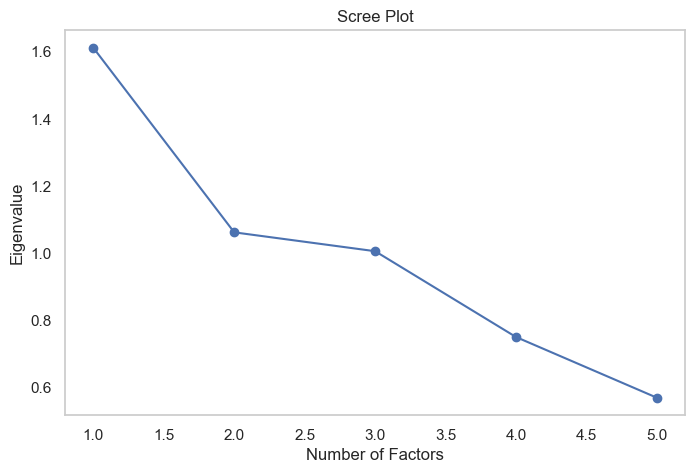

In [501]:
## Factor Analysis ##

# Reverse 'First_Action_Seconds' so that higher values indicate quicker engagement
df['First_Action_Seconds_Reversed'] = df['First_Action_Seconds'].max() + 1 - df['First_Action_Seconds']

# Standardize continuous variables
continuous_vars = ['Time_On_Task', 'First_Action_Seconds_Reversed', 'Story_Words', 'Notes_Words', 'Saved_Count']

scaler = StandardScaler()
df_standardized = pd.DataFrame(scaler.fit_transform(df[continuous_vars]), columns=continuous_vars)

# Handle missing values
df_standardized.dropna(subset=continuous_vars, inplace=True)

# Kaiser-Meyer-Olkin (KMO) measure of sampling adequacy
kmo_all, kmo_model = calculate_kmo(df_standardized)
print('KMO:', kmo_model)

# Bartlett's Test of Sphericity
chi_square_value, p_value = calculate_bartlett_sphericity(df_standardized)
print('Bartlett’s Test chi-square:', chi_square_value)
print('Bartlett’s Test p-value:', p_value)

# Determine the number of factors to extract
fa = FactorAnalyzer(n_factors=5, rotation=None)
fa.fit(df_standardized)

# Get eigenvalues and plot the scree plot
eigenvalues, vectors = fa.get_eigenvalues()

plt.figure(figsize=(8, 5))
plt.scatter(range(1, df_standardized.shape[1] + 1), eigenvalues)
plt.plot(range(1, df_standardized.shape[1] + 1), eigenvalues)
plt.title('Scree Plot')
plt.xlabel('Number of Factors')
plt.ylabel('Eigenvalue')
plt.grid()
plt.show()

A factor explaining around 33% (about 1.65/5) of the variance is modest, therefore we continue with 1 factor. However, it also suggests that the remaining variance is spread across other factors. 

In [502]:
# Factor analysis with 1 factor
fa = FactorAnalyzer(n_factors=1, rotation=None)
fa.fit(df_standardized)

# Get factor loadings
loadings = pd.DataFrame(fa.loadings_, index=continuous_vars, columns=['Factor 1'])
print('Factor Loadings:')
print(loadings)

Factor Loadings:
                               Factor 1
Time_On_Task                  -0.820828
First_Action_Seconds_Reversed -0.364006
Story_Words                   -0.400246
Notes_Words                   -0.211278
Saved_Count                   -0.111544


In [503]:
# Normalize factor loadings
factor_loadings = loadings['Factor 1']
weights = factor_loadings / factor_loadings.sum()

# Calculate composite score
df['Composite_Score'] = df_standardized.mul(weights, axis=1).sum(axis=1)

In [504]:
# Standardize the Composite_Score
scaler = StandardScaler()
df['Composite_Score_standardized'] = scaler.fit_transform(df[['Composite_Score']])

In [505]:
# Check Cronbach's alpha to evaluate factor
alpha, _ = cronbach_alpha(data=df_standardized)
print('Cronbach’s Alpha:', alpha)

Cronbach’s Alpha: 0.42294038613535156


For further analysis, compute 3 factors (explaining more of the variance):

In [506]:
# Factor analysis with 3 factors
fa = FactorAnalyzer(n_factors=3, rotation='varimax')  # Applying Varimax rotation for clearer interpretation
fa.fit(df_standardized)

# Get factor loadings
loadings = pd.DataFrame(fa.loadings_, index=continuous_vars, columns=['Factor1', 'Factor2', 'Factor3'])
print('Factor Loadings:')
print(loadings)

# Check variance explained by each factor
variance_explained = pd.DataFrame(fa.get_factor_variance(), index=['Variance', 'Proportional Var', 'Cumulative Var'])
print("\nVariance Explained by Each Factor:")
print(variance_explained)

Factor Loadings:
                                Factor1   Factor2   Factor3
Time_On_Task                   0.622657  0.318005  0.104099
First_Action_Seconds_Reversed  0.538323  0.024276 -0.003521
Story_Words                    0.123841  0.619178  0.384126
Notes_Words                    0.071977  0.332296 -0.069376
Saved_Count                    0.020718  0.000539  0.432129

Variance Explained by Each Factor:
                         0         1         2
Variance          0.698440  0.595518  0.349951
Proportional Var  0.139688  0.119104  0.069990
Cumulative Var    0.139688  0.258792  0.328782


In [507]:
# Print the factor loadings
print(loadings)

# Normalize
normalized_loadings = loadings.div(loadings.abs().sum(axis=0), axis=1)

# Print normalized loadings to verify
print(normalized_loadings)

                                Factor1   Factor2   Factor3
Time_On_Task                   0.622657  0.318005  0.104099
First_Action_Seconds_Reversed  0.538323  0.024276 -0.003521
Story_Words                    0.123841  0.619178  0.384126
Notes_Words                    0.071977  0.332296 -0.069376
Saved_Count                    0.020718  0.000539  0.432129
                                Factor1   Factor2   Factor3
Time_On_Task                   0.452014  0.245697  0.104806
First_Action_Seconds_Reversed  0.390793  0.018756 -0.003545
Story_Words                    0.089902  0.478390  0.386736
Notes_Words                    0.052251  0.256739 -0.069848
Saved_Count                    0.015040  0.000417  0.435065


In [508]:
# Calculate composite scores for each factor
for factor in ['Factor1', 'Factor2', 'Factor3']:
    weights = normalized_loadings[factor]  # Get normalized loadings (weights) for this factor
    df[f'Composite_Score_{factor}'] = df_standardized.mul(weights, axis=1).sum(axis=1)
    
print(df[['Composite_Score_Factor1', 'Composite_Score_Factor2', 'Composite_Score_Factor3']].head())

   Composite_Score_Factor1  Composite_Score_Factor2  Composite_Score_Factor3
0                 0.089532                 0.506769                 1.387457
1                -0.327482                -0.191938                -0.036799
2                 0.063987                 0.339626                 0.328539
3                 0.198752                -0.102168                -0.080208
4                -0.344347                -0.345683                -0.163501


Add the "training material" variables to final composite score:

In [509]:
df.rename(columns={'CLICKED_WRITING': 'Click_WritingM'}, inplace=True)
df.rename(columns={'CLICKED_CREATIVITY': 'Click_CreativityM'}, inplace=True)

In [510]:
# Fill NaN values with 0 and convert to integer
df['Click_WritingM'] = df['Click_WritingM'].fillna(0).astype(int)
df['Click_CreativityM'] = df['Click_CreativityM'].fillna(0).astype(int)

In [511]:
# Create final composite score with weights
w_composite = 0.8
w_click_writing = 0.1
w_click_creativity = 0.1

df['BehaviourMotivation_Score'] = (
    w_composite * df['Composite_Score_standardized'] +
    w_click_writing * df['Click_WritingM'] +
    w_click_creativity * df['Click_CreativityM']
)

Analyse correlation for first indication between behaviour factors and self-indicated motivation:

In [512]:
correlation_composite = df[['BehaviourMotivation_Score', 'Motivation_Index_standardized']].corr()
print(correlation_composite)

                               BehaviourMotivation_Score  \
BehaviourMotivation_Score                       1.000000   
Motivation_Index_standardized                   0.035904   

                               Motivation_Index_standardized  
BehaviourMotivation_Score                           0.035904  
Motivation_Index_standardized                       1.000000  


### Standardize Engineered Features

In [513]:
# Save not standardized
df['AIExperience_OG'] = df['AIExperience']
df['CW_SelfConcept_OG'] = df['CW_SelfConcept']
df['AIAttitudeIndex_OG'] = df['AIAttitudeIndex']
df['CreativePractice_OG'] = df['CreativePractice']
df['TechComfort_OG'] = df['TechComfort']
df['TechComfortEffort_OG'] = df['TechComfortEffort']

# List of variables to standardize
moderators = ['AIExperience', 'CW_SelfConcept', 'AIAttitudeIndex', 'CreativePractice', 'TechComfort', 'TechComfortEffort']

# Standardize
df[moderators] = scaler.fit_transform(df[moderators])

### Evaluator Study Features

In [514]:
# Rating categories
categories = ['Rare', 'Original', 'Novel', 'Feasible', 'Appropriate', 
              'AuthorsIdea', 'ByAI', 'Funny', 'WellWritten', 'Twist', 'Enjoyed', 'Boring']

# Calculate the average for each category across EVAL3 to EVAL6
for category in categories:
    df_eval[f'Avg_{category}'] = df_eval[[f'EVAL3_{category}', f'EVAL4_{category}', f'EVAL5_{category}', f'EVAL6_{category}']].mean(axis=1)

# NoveltyIndex average per Rater
df_eval['Avg_NoveltyIndex'] = df_eval[['Avg_Rare', 'Avg_Original', 'Avg_Novel']].mean(axis=1)

# UsefulnessIndex avg. per Rater
df_eval['Avg_UsefulnessIndex'] = df_eval[['Avg_Feasible', 'Avg_Appropriate']].mean(axis=1)

# OwnershipIndex avg. per Rater
df_eval['Avg_OwnershipIndex'] = df_eval.apply(lambda row: (row['Avg_AuthorsIdea'] + (7 - row['Avg_ByAI'])) / 2, axis=1)

# EmotionsIndex avg. per Rater
df_eval['Avg_EmotionsIndex'] = df_eval.apply(lambda row: (row['Avg_Funny'] + row['Avg_WellWritten'] + row['Avg_Twist'] + row['Avg_Enjoyed'] + (7 - row['Avg_Boring'])) / 5, axis=1)

In [515]:
# Evaluators Count
df['evaluator_count'] = df['evaluators'].apply(lambda x: len(str(x).split(',')))

## Data Mapping

In [516]:
# Define mappings
mappings = {
    'GENDER': {
        1: 'Female',
        2: 'Male',
        3: 'Non-binary',
        4: 'Prefer Not to Say',
        -9: 'Not answered'
    },
    'AGE': {
        1: '0-15',
        2: '15-19',
        3: '20-24',
        4: '25-29',
        5: '30-34',
        6: '35-39',
        7: '40-44',
        8: '45-49',
        9: '50-54',
        10: '55-59',
        11: '60-64',
        12: '>65',
        -9: 'Not answered'
    },
    'EDUCATION': {
        1: 'No Degree',
        2: 'Still in School',
        3: 'A-Levels',
        4: 'Vocational Training',
        6: 'Undergraduate',
        7: 'Postgraduate',
        8: 'Doctorate',
        -9: 'Not answered'
    },
    'OCCUPATION': {
        1: 'Student',
        2: 'Employed',
        3: 'Self-Employed',
        4: 'Unemployed',
        5: 'Retired',
        6: 'Other',
        -9: 'Not answered'
    },
    'DEVICE': {
        1: 'Smartphone',
        2: 'Tablet',
        3: 'Laptop / Computer',
        4: 'Other',
        -9: 'Not answered'
    },
    'ENG_LEVEL': {
        1: 'Mother Tongue',
        2: 'C2',
        3: 'C1',
        4: 'B2',
        5: 'B1',
        6: 'A2',
        7: 'A1',
        -9: 'Not answered'
    },
    'GER_LEVEL': {
        1: 'Mother Tongue',
        2: 'C2',
        3: 'C1',
        4: 'B2',
        5: 'B1',
        6: 'A2',
        7: 'A1',
        -9: 'Not answered'
    }
}

In [517]:
# change to float
df['GENDER'] = df['GENDER'].astype(float)
df['AGE'] = df['AGE'].astype(float)
df['EDUCATION'] = df['EDUCATION'].astype(float)
df['OCCUPATION'] = df['OCCUPATION'].astype(float)
df['DEVICE'] = df['DEVICE'].astype(float)
df['GER_LEVEL'] = df['GER_LEVEL'].astype(float)
df['ENG_LEVEL'] = df['ENG_LEVEL'].astype(float)

In [518]:
# Function to check if column is already mapped
def is_mapped(column):
    return df[column].dtype == 'object'

# Map
for column, mapping in mappings.items():
    if not is_mapped(column):
        df[column] = df[column].map(mapping)

## Filter

In [519]:
# Save unfiltered version
df_unflitered = df

In [520]:
# Filter participants that did not make it to page 20
df = df.dropna(subset=['TIME020'])

In [521]:
# Sample before filtering
print(len(df))
print(len(df[df['LANGUAGE'] == 'ger']))
print(len(df[df['LANGUAGE'] == 'eng']))

205
187
18


Cheater:

In [522]:
# See how many cheated
print((df['Cheat_NoneOutsideSurvey'] == '1').sum())
print((df['Cheat_NoneOutsideSurvey'] != '1').sum())

6
199


In [523]:
# Check group of cheaters
print(df.loc[df['Cheat_NoneOutsideSurvey'] == '1', ['GROUP', 'Cheat_ChatGPT', 'Cheat_MetaLlama', 
                                                    'Cheat_GoogleGeminiBard', 'Cheat_MicrosoftCopilotBingChat',
                                                    'Cheat_Jasper', 'Cheat_Grammarly', 'Cheat_GoogleSearch',
                                                    'Cheat_DeepL', 'Cheat_SpellCheckingSoftware',
                                                    'Cheat_BlogOrForum', 'Cheat_BookOrMagazine', 'Cheat_Other']])

    GROUP Cheat_ChatGPT Cheat_MetaLlama Cheat_GoogleGeminiBard  \
13      2             2               1                      1   
55      3             2               1                      1   
89      1             2               1                      1   
145     1             1               1                      1   
157     2             2               1                      1   
161     2             2               1                      1   

    Cheat_MicrosoftCopilotBingChat Cheat_Jasper Cheat_Grammarly  \
13                               1            1               1   
55                               1            1               1   
89                               1            1               1   
145                              1            1               1   
157                              1            1               1   
161                              1            1               1   

    Cheat_GoogleSearch Cheat_DeepL Cheat_SpellCheckingSoftware  \
1

In [524]:
# Filter out cheaters (but include chatgpt cheaters that were in group 2)
df = df.loc[(df['Cheat_NoneOutsideSurvey'] != '1') | (df['GROUP'] == '2')]

In [525]:
# Check sample
print(len(df))
print(len(df[df['LANGUAGE'] == 'ger']))
print(len(df[df['LANGUAGE'] == 'eng']))

202
185
17


Not 8 sentences:

In [526]:
# See who gets filtered out
print((df['sentence_count'] != 8).sum())
print(df.loc[df['sentence_count'] != 8, ['GROUP', 'sentence_count']])

5
    GROUP  sentence_count
13      2              13
74      1               0
92      3              11
157     2              16
199     2              19


In [527]:
# Filter not 8 sentences
df = df.loc[df['sentence_count'] == 8]

In [528]:
# Check sample
print(len(df))
print(len(df[df['LANGUAGE'] == 'ger']))
print(len(df[df['LANGUAGE'] == 'eng']))

197
181
16


Age:

In [529]:
# Age below 19
print((df['AGE'] == '0-15').sum())
print((df['AGE'] == '15-19').sum())
print(df.loc[df['AGE'] == '15-19', ['GROUP', 'OCCUPATION']])

0
5
    GROUP OCCUPATION
46      1    Student
129     1    Student
165     3   Employed
170     2    Student
192     3      Other


In [530]:
# Filter out age below 19 that is not student or employed
df = df.loc[~((df['AGE'] == '15-19') & (~df['OCCUPATION'].isin(['Student', 'Employed'])))]

In [531]:
# Check sample
print(len(df))
print(len(df[df['LANGUAGE'] == 'ger']))
print(len(df[df['LANGUAGE'] == 'eng']))

196
180
16


Language level

In [532]:
# Correct for known mistake (reported by participant) of wrong language level
df.loc[3, 'GER_LEVEL'] = 'Mother Tongue'

In [533]:
# Check if language level of participation is insufficient
# English
print(df[(df['LANGUAGE'] == 'eng') & (df['ENG_LEVEL'].isin(['B1', 'A2', 'A1']))])
# German
print(df[(df['LANGUAGE'] == 'ger') & (df['GER_LEVEL'].isin(['B1', 'A2', 'A1']))])

Empty DataFrame
Columns: [CASE, LANGUAGE, STARTED, DAT_1, DAT_2, DAT_3, DAT_4, DAT_5, DAT_6, DAT_7, DAT_8, DAT_9, DAT_10, QUERY_CONV, STORY_ARRAY, STORY_FINAL, QUERY_ARRAY, STORY_NOTES, FIRST_QUERY_TIME, FIRST_NOTES_TIME, FIRST_STORY_INPUT_TIME, CLICK_CREATIVITY_TIME, CLICK_WRITING_TIME, CORRECT_OWNSTORY, A515_07, CORRECT_STORY1, ERROR_STORY1, REVIEWED_STORY1_KEY, REVIEWED_STORY1, REVIEWED_STORY2_KEY, REVIEWED_STORY2, CORRECT_STORY2, ERROR_STORY2, REV_QUERY_CONV, REV_STORY_ARRAY, REV_STORY_FINAL, REV_QUERY_ARRAY, REV_FIRST_STORY_INPUT_TIME, REV_FIRST_NOTES_TIME, CORRECT_OWN_REV, A516_06, GROUP, EVAL1_Funny, EVAL1_Boring, EVAL1_WellWritten, EVAL1_Enjoyed, EVAL1_Twist, EVAL1_Novel, EVAL1_Original, EVAL1_Rare, EVAL1_Feasible, EVAL1_Appropriate, EVAL1_AuthorsIdea, EVAL1_ByAI, EVAL2_Funny, EVAL2_Boring, EVAL2_WellWritten, EVAL2_Enjoyed, EVAL2_Twist, EVAL2_Novel, EVAL2_Original, EVAL2_Rare, EVAL2_Feasible, EVAL2_Appropriate, EVAL2_AuthorsIdea, EVAL2_ByAI, PreQ_NovelIdeas, PreQ_ConfidentCreat

Drop unnecessary columns of df:

In [534]:
df = df.drop(columns=['DAT_1', 'DAT_2', 'DAT_3', 'DAT_4', 'DAT_5', 'DAT_6', 'DAT_7', 'DAT_8', 'DAT_9', 'DAT_10', 
                      'FIRST_QUERY_TIME', 'FIRST_NOTES_TIME', 'FIRST_STORY_INPUT_TIME', 'CLICK_CREATIVITY_TIME', 
                      'CLICK_WRITING_TIME', 'CORRECT_OWNSTORY', 'A515_07', 'CORRECT_STORY1', 'ERROR_STORY1', 
                      'REVIEWED_STORY1', 'REVIEWED_STORY2', 'CORRECT_STORY2', 'ERROR_STORY2', 'REV_FIRST_STORY_INPUT_TIME', 
                      'REV_FIRST_NOTES_TIME', 'CORRECT_OWN_REV', 'A516_06', 'FINISHED', 'Q_VIEWER', 'MAXPAGE', 
                      'FIRST_QUERY_TIME_UTC', 'FIRST_NOTES_TIME_UTC', 'FIRST_STORY_INPUT_TIME_UTC', 
                      'CLICK_CREATIVITY_TIME_UTC', 'CLICK_WRITING_TIME_UTC', 'REV_FIRST_STORY_INPUT_TIME_UTC', 
                      'REV_FIRST_NOTES_TIME_UTC', 'translated_words', 'FIRST_PROCESS_TIME'])
# Drop all columns that start with "CHEAT"
df.drop(columns=[col for col in df.columns if col.startswith('Cheat')], inplace=True)
# Drop all columns that start with "TIME0" except "TIME012"
df.drop(columns=[col for col in df.columns if col.startswith('TIME0') and col != 'TIME012' and col != 'TIME014'], inplace=True)

In [535]:
# Sample after filtering
print(len(df))
print(len(df[df['LANGUAGE'] == 'ger']))
print(len(df[df['LANGUAGE'] == 'eng']))

196
180
16


# Randomization and Manipulation Checks

## Randomization

Categorical and ordinal variables checked using Chi-Squared tests to examine if the distribution across the 3 groups is statistically similar. Continuous variables via ANOVA.

In [536]:
# Function to calculate Cramér's V for the Chi-squared test
def cramers_v(chi2, n, k1, k2):
    return np.sqrt(chi2 / (n * (min(k1, k2) - 1)))

# Function to calculate Eta Squared for ANOVA
def eta_squared_anova(aov_table):
    eta_sq = aov_table['sum_sq'].iloc[0] / aov_table['sum_sq'].sum()  # Use .iloc for position-based indexing
    return eta_sq

# List of covariates with their types (continuous, categorical, or ordinal)
covariates = {
    'Age': 'ordinal',
    'Gender': 'categorical',
    'Education': 'ordinal',
    'OCCUPATION': 'categorical',
    'DEVICE': 'categorical',
    'LANGUAGE': 'categorical',
    'Ger_Level': 'continuous',
    'Lang_Level': 'continuous',
    'DAT': 'continuous',
    'AIExperience': 'continuous',
    'TechComfort': 'continuous',
    'AIAttitudeIndex': 'continuous',
    'CW_SelfConcept': 'continuous',
    'CreativePractice': 'continuous',
    'Pre_SelfEfficacy_Index': 'continuous',
    'Pre_Motivation_Index': 'continuous'
}

# Collect p-values, effect sizes, and tests used
p_values = []
effect_sizes = []
tests_used = []

for covariate, cov_type in covariates.items():
    if cov_type == 'continuous' or cov_type == 'ordinal':
        # Perform one-way ANOVA (treat ordinal variables as continuous)
        model = ols(f'{covariate} ~ C(GROUP)', data=df).fit()
        anova_table = sm.stats.anova_lm(model, typ=2)
        p_val = anova_table['PR(>F)'].iloc[0] 
        eta_sq = eta_squared_anova(anova_table)
        effect_sizes.append(eta_sq)
        p_values.append(p_val)
        test_used = "ANOVA"

    elif cov_type == 'categorical':
        # Perform Chi-squared test
        contingency_table = pd.crosstab(df[covariate], df['GROUP'])
        chi2, p_val, dof, ex = chi2_contingency(contingency_table)
        n = contingency_table.sum().sum()  # Total sample size
        k1, k2 = contingency_table.shape  # Number of categories and groups

        # Calculate Cramér's V
        cramers_v_val = cramers_v(chi2, n, k1, k2)
        effect_sizes.append(cramers_v_val)
        p_values.append(p_val)
        test_used = "Chi-squared"

    tests_used.append(test_used)
    print(f"{covariate}: p-value = {p_val:.4f}, Effect Size = {effect_sizes[-1]:.4f}, Test Used: {test_used}")

Age: p-value = 0.8118, Effect Size = 0.0022, Test Used: ANOVA
Gender: p-value = 0.1113, Effect Size = 0.1497, Test Used: Chi-squared
Education: p-value = 0.0791, Effect Size = 0.0259, Test Used: ANOVA
OCCUPATION: p-value = 0.6824, Effect Size = 0.1379, Test Used: Chi-squared
DEVICE: p-value = 0.3999, Effect Size = 0.1016, Test Used: Chi-squared
LANGUAGE: p-value = 0.5657, Effect Size = 0.0762, Test Used: Chi-squared
Ger_Level: p-value = 0.9360, Effect Size = 0.0007, Test Used: ANOVA
Lang_Level: p-value = 0.8417, Effect Size = 0.0018, Test Used: ANOVA
DAT: p-value = 0.8074, Effect Size = 0.0022, Test Used: ANOVA
AIExperience: p-value = 0.9744, Effect Size = 0.0003, Test Used: ANOVA
TechComfort: p-value = 0.3292, Effect Size = 0.0114, Test Used: ANOVA
AIAttitudeIndex: p-value = 0.0232, Effect Size = 0.0382, Test Used: ANOVA
CW_SelfConcept: p-value = 0.9405, Effect Size = 0.0006, Test Used: ANOVA
CreativePractice: p-value = 0.7693, Effect Size = 0.0027, Test Used: ANOVA
Pre_SelfEfficacy_I

## Manipulation

In [537]:
## Welch's t-test to confirm differences between Group 2 and 3 in manipulation check questions ##
# Convert to numeric
df['GPT_Affected'] = pd.to_numeric(df['GPT_Affected'], errors='coerce')
df['GPT_Helped'] = pd.to_numeric(df['GPT_Helped'], errors='coerce')
df['GPT_Feedback'] = pd.to_numeric(df['GPT_Feedback'], errors='coerce')

# Explicitly drop any rows with NaNs in these columns
df_cleaned = df.dropna(subset=['GPT_Affected', 'GPT_Helped', 'GPT_Feedback'])

# Q1: GPT_Affected
group_2_q1 = df_cleaned[df_cleaned['GROUP'] == '2']['GPT_Affected']
group_3_q1 = df_cleaned[df_cleaned['GROUP'] == '3']['GPT_Affected']

q1_2_vs_3 = ttest_ind(group_2_q1, group_3_q1, equal_var=False)

print("Q1 GPT_Affected:")
print(f"Mean Group '2': {group_2_q1.mean()}")
print(f"Mean Group '3': {group_3_q1.mean()}")
print("Group '2' vs Group '3':", q1_2_vs_3)

# Q2: GPT_Helped
group_2_q2 = df_cleaned[df_cleaned['GROUP'] == '2']['GPT_Helped']
group_3_q2 = df_cleaned[df_cleaned['GROUP'] == '3']['GPT_Helped']

q2_2_vs_3 = ttest_ind(group_2_q2, group_3_q2, equal_var=False)

print("\nQ2 GPT_Helped")
print(f"Mean for Group '2': {group_2_q2.mean()}")
print(f"Mean for Group '3': {group_3_q2.mean()}")
print("Group '2' vs Group '3':", q2_2_vs_3)

# Q3: GPT_Feedback
group_2_q3 = df_cleaned[df_cleaned['GROUP'] == '2']['GPT_Feedback']
group_3_q3 = df_cleaned[df_cleaned['GROUP'] == '3']['GPT_Feedback']

q3_2_vs_3 = ttest_ind(group_2_q3, group_3_q3, equal_var=False)

print("\nQ3 GPT_Feedback")
print(f"Mean for Group '2': {group_2_q3.mean()}")
print(f"Mean for Group '3': {group_3_q3.mean()}")
print("Group '2' vs Group '3':", q3_2_vs_3)

Q1 GPT_Affected:
Mean Group '2': 4.265625
Mean Group '3': 2.234375
Group '2' vs Group '3': TtestResult(statistic=4.9682536472887, pvalue=2.36192050926641e-06, df=115.51981297588458)

Q2 GPT_Helped
Mean for Group '2': 4.5625
Mean for Group '3': 1.984375
Group '2' vs Group '3': TtestResult(statistic=6.397814744579139, pvalue=3.865444220005194e-09, df=110.99116185843677)

Q3 GPT_Feedback
Mean for Group '2': 2.15625
Mean for Group '3': 2.171875
Group '2' vs Group '3': TtestResult(statistic=-0.04890695607691109, pvalue=0.9610708977734175, df=125.97888418002127)


# EDA

## Overview

In [538]:
# Check sample
print(len(df))
print(len(df[df['LANGUAGE'] == 'ger']))
print(len(df[df['LANGUAGE'] == 'eng']))

196
180
16


In [539]:
# Group Distribution
print(len(df[df['GROUP'] == '1']))
print(len(df[df['GROUP'] == '2']))
print(len(df[df['GROUP'] == '3']))

68
64
64


In [540]:
# Mean DAT score
print(df[['DAT']].mean())

DAT    81.127829
dtype: float64


## Demographics Distribution

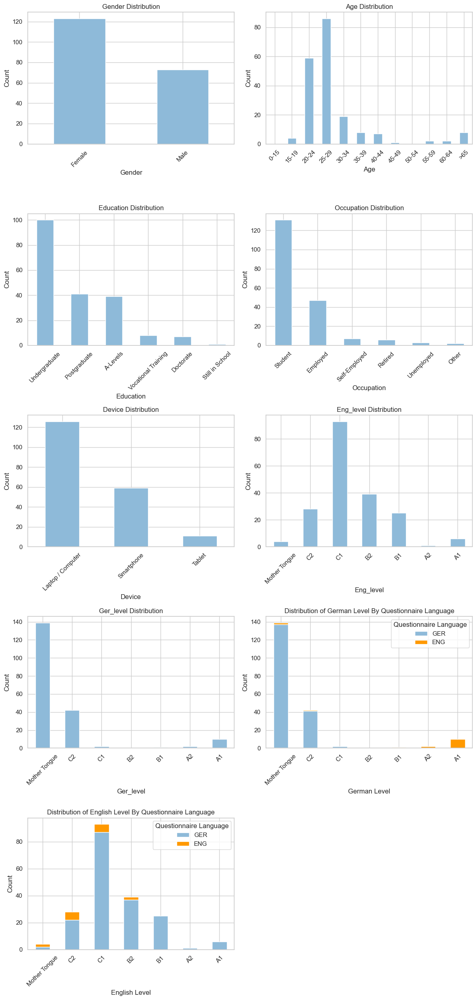

In [541]:
# Order for age categories
age_order = [
    '0-15', '15-19', '20-24', '25-29', '30-34', '35-39', '40-44',
    '45-49', '50-54', '55-59', '60-64', '>65'
]

language_order = [
    'Mother Tongue', 'C2', 'C1', 'B2',
    'B1', 'A2', 'A1'
]

# Collect columns to plot
columns_to_plot = []
for column in mappings.keys():
    if column in df.columns:
        columns_to_plot.append(column)

number_of_plots = len(columns_to_plot) + 2 

ncols = 2
nrows = math.ceil(number_of_plots / ncols)

# Adjusted figsize
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(12, nrows * 5))
axes = axes.flatten()

plot_index = 0 

for column in columns_to_plot:
    distribution = df[column].value_counts()
    #print(f"\n{column} Distribution:")
    #print(distribution)
    
    # Plot the distribution
    if column == 'AGE':
        distribution = distribution.reindex(age_order)
    elif column in ['ENG_LEVEL', 'GER_LEVEL']:
        distribution = distribution.reindex(language_order)
    title = column.capitalize() + ' Distribution'
    xlabel = column.capitalize()
    distribution.plot(kind='bar', title=title, color='#8EBAD9', ax=axes[plot_index])
    axes[plot_index].set_xlabel(xlabel)
    axes[plot_index].set_ylabel('Count')
    axes[plot_index].set_xticklabels(distribution.index, rotation=45)
    plot_index += 1

### By LANGUAGE of Questionnaire: ###
## German Level: ##
ger_ger_distribution = df[df['LANGUAGE'] == 'ger']['GER_LEVEL'].value_counts().reindex(language_order, fill_value=0)
eng_ger_distribution = df[df['LANGUAGE'] == 'eng']['GER_LEVEL'].value_counts().reindex(language_order, fill_value=0)

# Combine the distributions into a DataFrame
distribution_ger_df = pd.DataFrame({
    'GER': ger_ger_distribution,
    'ENG': eng_ger_distribution
})

# Plot the stacked bar chart
distribution_ger_df.plot(kind='bar', stacked=True, color=['#8EBAD9', '#FF9900'], ax=axes[plot_index])
axes[plot_index].set_title('Distribution of German Level By Questionnaire Language')
axes[plot_index].set_xlabel('German Level')
axes[plot_index].set_ylabel('Count')
axes[plot_index].set_xticklabels(distribution_ger_df.index, rotation=45)
axes[plot_index].legend(title='Questionnaire Language')
plot_index += 1

## English Level: ##
ger_eng_distribution = df[df['LANGUAGE'] == 'ger']['ENG_LEVEL'].value_counts().reindex(language_order, fill_value=0)
eng_eng_distribution = df[df['LANGUAGE'] == 'eng']['ENG_LEVEL'].value_counts().reindex(language_order, fill_value=0)

# Combine the distributions into a DataFrame
distribution_eng_df = pd.DataFrame({
    'GER': ger_eng_distribution,
    'ENG': eng_eng_distribution
})

# Plot the stacked bar chart
distribution_eng_df.plot(kind='bar', stacked=True, color=['#8EBAD9', '#FF9900'], ax=axes[plot_index])
axes[plot_index].set_title('Distribution of English Level By Questionnaire Language')
axes[plot_index].set_xlabel('English Level')
axes[plot_index].set_ylabel('Count')
axes[plot_index].set_xticklabels(distribution_eng_df.index, rotation=45)
axes[plot_index].legend(title='Questionnaire Language')
plot_index += 1

# Hide unused subplots
for ax in axes[plot_index:]:
    ax.axis('off')

plt.tight_layout()
plt.show()


In [542]:
# Midpoints for age ranges
age_midpoints = {
    '0-15': 7, '15-19': 17, '20-24': 22, '25-29': 27, '30-34': 32, '35-39': 37, '40-44': 42,
    '45-49': 47, '50-54': 52, '55-59': 57, '60-64': 62, '>65': 70
}

df['Age_Midpoint'] = df['AGE'].map(age_midpoints)

# Function for mean age using midpoints
def compute_mean_age(group):
    return sum(group['AGE'].map(age_midpoints)) / len(group)

# Function for SD for age
def compute_age_std(group):
    mean_age = compute_mean_age(group)
    variance = sum((group['AGE'].map(age_midpoints) - mean_age) ** 2) / len(group)
    return variance ** 0.5

In [543]:
## Summary Statistics Table ##

# Most occuring category
def compute_overall_percentage(column):
    return df[column].value_counts(normalize=True).max()

# Split into groups
control_group = df[df['GROUP'] == '1']
AIsupport_group = df[df['GROUP'] == '2']
AIfeedback_group = df[df['GROUP'] == '3']

# Compute overall percentages for most occuring
overall_gender_percentage = compute_overall_percentage('GENDER')
overall_education_percentage = compute_overall_percentage('EDUCATION')
overall_occupation_percentage = compute_overall_percentage('OCCUPATION')
overall_device_percentage = compute_overall_percentage('DEVICE')
overall_lang_percentage = compute_overall_percentage('LANGUAGE')
overall_eng_percentage = compute_overall_percentage('ENG_LEVEL')
overall_ger_percentage = compute_overall_percentage('GER_LEVEL')

# Percentage for each group
def compute_group_percentage(group, column, overall_value):
    return group[column].value_counts(normalize=True).get(overall_value, 0)

# Values with percentages for the table
table_data_overall = {
    "Total": {
        "Gender (Female)": overall_gender_percentage,
        "Age Mean": compute_mean_age(df),
        "Age SD": compute_age_std(df),
        "Education (Undergraduate)": overall_education_percentage,
        "Occupation (Student)": overall_occupation_percentage,
        "Device (Computer)": overall_device_percentage,
        "Language (ger)": overall_lang_percentage,
        "Eng Level (C1)": overall_eng_percentage,
        "Ger Level (Mother Tongue)": overall_ger_percentage,
        "DAT Mean": df['DAT'].mean(),
        "DAT SD": df['DAT'].std()

    },
    "Control": {
        "Gender (Female)": compute_group_percentage(control_group, 'GENDER', 'Female'),
        "Age Mean": compute_mean_age(control_group),
        "Age SD": compute_age_std(control_group),
        "Education (Undergraduate)": compute_group_percentage(control_group, 'EDUCATION', 'Undergraduate'),
        "Occupation (Student)": compute_group_percentage(control_group, 'OCCUPATION', 'Student'),
        "Device (Computer)": compute_group_percentage(control_group, 'DEVICE', 'Laptop / Computer'),
        "Language (ger)": compute_group_percentage(control_group, 'LANGUAGE', 'ger'),
        "Eng Level (C1)": compute_group_percentage(control_group, 'ENG_LEVEL', 'C1'),
        "Ger Level (Mother Tongue)": compute_group_percentage(control_group, 'GER_LEVEL', 'Mother Tongue'),
        "DAT Mean": df[df['GROUP'] == '1']['DAT'].mean(),
        "DAT SD": df[df['GROUP'] == '1']['DAT'].std()
    },
    "AI-Support": {
        "Gender (Female)": compute_group_percentage(AIsupport_group, 'GENDER', 'Female'),
        "Age Mean": compute_mean_age(AIsupport_group),
        "Age SD": compute_age_std(AIsupport_group),
        "Education (Undergraduate)": compute_group_percentage(AIsupport_group, 'EDUCATION', 'Undergraduate'),
        "Occupation (Student)": compute_group_percentage(AIsupport_group, 'OCCUPATION', 'Student'),
        "Device (Computer)": compute_group_percentage(AIsupport_group, 'DEVICE', 'Laptop / Computer'),
        "Language (ger)": compute_group_percentage(AIsupport_group, 'LANGUAGE', 'ger'),
        "Eng Level (C1)": compute_group_percentage(AIsupport_group, 'ENG_LEVEL', 'C1'),
        "Ger Level (Mother Tongue)": compute_group_percentage(AIsupport_group, 'GER_LEVEL', 'Mother Tongue'),
        "DAT Mean": df[df['GROUP'] == '2']['DAT'].mean(),
        "DAT SD": df[df['GROUP'] == '2']['DAT'].std()
    },
    "AI-Feedback": {
        "Gender (Female)": compute_group_percentage(AIfeedback_group, 'GENDER', 'Female'),
        "Age Mean": compute_mean_age(AIfeedback_group),
        "Age SD": compute_age_std(AIfeedback_group),
        "Education (Undergraduate)": compute_group_percentage(AIfeedback_group, 'EDUCATION', 'Undergraduate'),
        "Occupation (Student)": compute_group_percentage(AIfeedback_group, 'OCCUPATION', 'Student'),
        "Device (Computer)": compute_group_percentage(AIfeedback_group, 'DEVICE', 'Laptop / Computer'),
        "Language (ger)": compute_group_percentage(AIfeedback_group, 'LANGUAGE', 'ger'),
        "Eng Level (C1)": compute_group_percentage(AIfeedback_group, 'ENG_LEVEL', 'C1'),
        "Ger Level (Mother Tongue)": compute_group_percentage(AIfeedback_group, 'GER_LEVEL', 'Mother Tongue'),
        "DAT Mean": df[df['GROUP'] == '3']['DAT'].mean(),
        "DAT SD": df[df['GROUP'] == '3']['DAT'].std()
    }
}

summary_table_overall = pd.DataFrame(table_data_overall).transpose()
summary_table_overall

,Gender (Female),Age Mean,Age SD,Education (Undergraduate),Occupation (Student),Device (Computer),Language (ger),Eng Level (C1),Ger Level (Mother Tongue),DAT Mean,DAT SD
Total,0.627551,29.239796,10.875860,0.510204,0.668367,0.642857,0.918367,0.474490,0.709184,81.127829,6.891944
Control,0.720588,28.852941,10.083861,0.455882,0.735294,0.588235,0.941176,0.455882,0.720588,81.521821,5.905678
AI-Support,0.609375,29.953125,10.708393,0.531250,0.593750,0.640625,0.890625,0.468750,0.718750,81.102716,7.471834
AI-Feedback,0.546875,28.937500,11.780380,0.546875,0.671875,0.703125,0.921875,0.500000,0.687500,80.734324,7.333153


## Continous Distributions

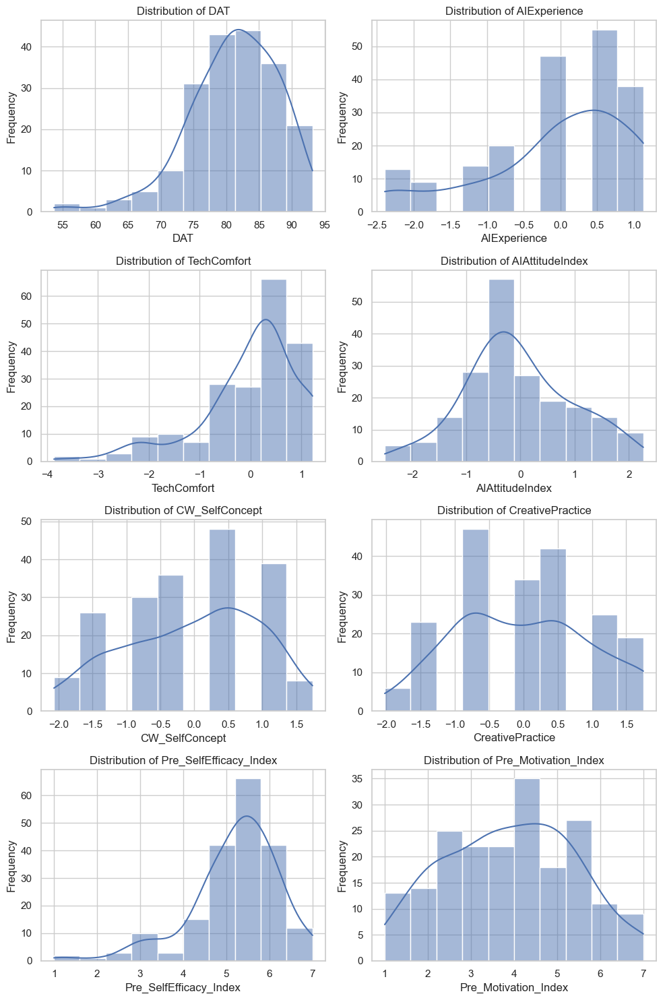

In [544]:
# Categorize columns into continuous and categorical
continuous_cols = ['DAT', 'AIExperience', 'TechComfort', 'AIAttitudeIndex', 
                   'CW_SelfConcept', 'CreativePractice', 'Pre_SelfEfficacy_Index', 'Pre_Motivation_Index']

df_cleaned = df
df_cleaned = df.replace([np.inf, -np.inf], np.nan)
warnings.filterwarnings("ignore", category=FutureWarning, module='seaborn')

# Plotting
plt.figure(figsize=(10, 15))
for i, col in enumerate(continuous_cols, 1):
    plt.subplot(4, 2, i)
    sns.histplot(df_cleaned[col], kde=True, bins=10)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')

plt.tight_layout()
plt.show()

## Groupwise Distributions

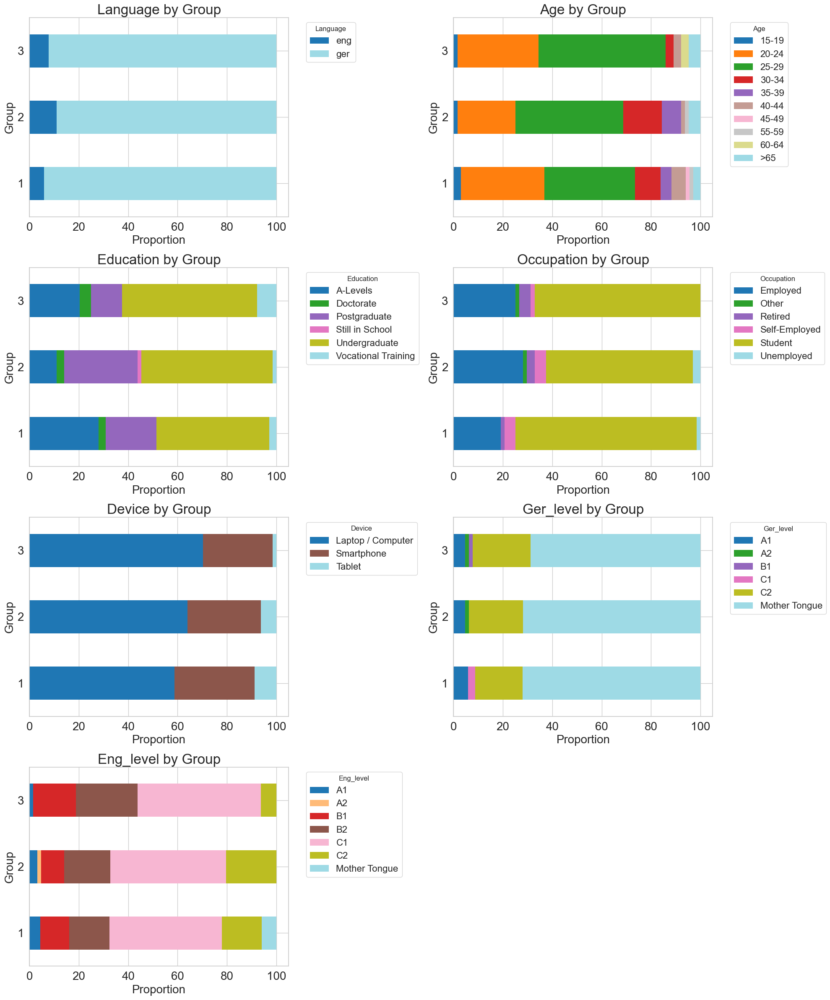

In [545]:
## Groupwise Distribution Plots ##
def percentage_dist(ax, df, group, value):
    # Calculate counts and percentages
    percentage_df = (
        df.groupby([group, value])
        .size()
        .reset_index(name='Count')
        .merge(
            df.groupby(group).size().reset_index(name='Total'),
            on=group
        )
        .assign(Percentage=lambda x: (x['Count'] / x['Total']) * 100)
    )

    pivot_df = percentage_df.pivot(index=group, columns=value, values='Percentage').fillna(0)

    # Plot
    pivot_df.plot(
        kind='barh',
        stacked=True,
        colormap='tab20',
        ax=ax,
        edgecolor='none'
    )
    
    ax.set_title(f'{value.capitalize()} by {group.capitalize()}', fontsize=24)
    ax.set_xlabel('Proportion', fontsize=20)
    ax.set_ylabel(group.capitalize(), fontsize=20)
    ax.legend(title=value.capitalize(), bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=16, title_fontsize=12)
    
    ax.tick_params(axis='both', which='major', labelsize=20)

# List of variables
value_vars = ['LANGUAGE', 'AGE', 'EDUCATION', 'OCCUPATION', 'DEVICE', 'GER_LEVEL', 'ENG_LEVEL']

# Number of columns and rows neeeded
num_cols = 2
num_plots = len(value_vars)
num_rows = (num_plots + num_cols - 1) // num_cols 

# Create subplots
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, num_rows * 6))
axes = axes.flatten()  # Flatten in case of multiple rows

# Iterate through each value variable and plot
for i, value in enumerate(value_vars):
    percentage_dist(axes[i], df, 'GROUP', value)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()

#plt.suptitle('Groupwise Distribution Plots', fontsize=16, y=1.02)

# Display the plots
plt.show()

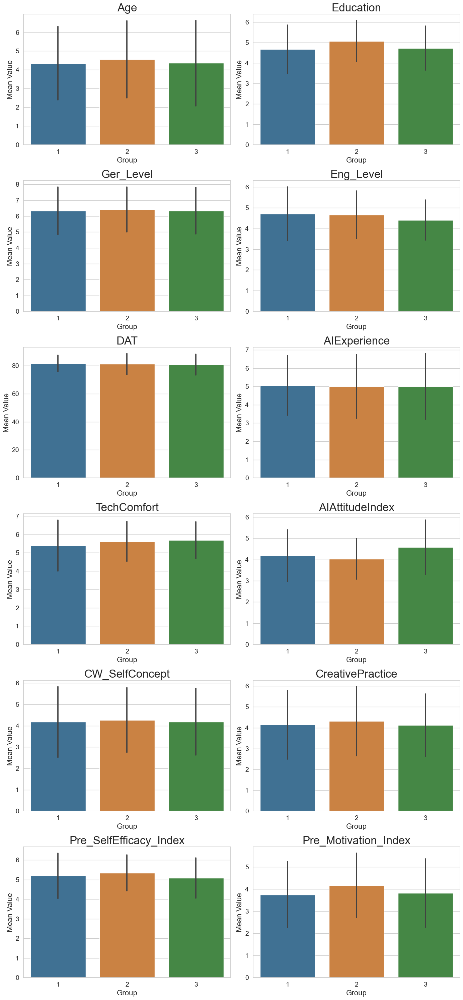

In [546]:
continuous_cols = [
    'Age', 'Education', 'Ger_Level', 'Eng_Level', 'DAT', 'AIExperience_OG', 'TechComfort_OG', 'AIAttitudeIndex_OG', 
    'CW_SelfConcept_OG', 'CreativePractice_OG', 
    'Pre_SelfEfficacy_Index', 'Pre_Motivation_Index'
]

# Change group to categorical
df['GROUP'] = pd.Categorical(df['GROUP'], categories=['1', '2', '3'], ordered=True)

# Determine the number of rows needed
num_plots = len(continuous_cols)
cols = 2
rows = (num_plots + cols - 1) // cols

sns.set(style="whitegrid")

# Create subplots
fig, axes = plt.subplots(rows, cols, figsize=(14, rows * 5))
axes = axes.flatten() 

palette = {'1': '#3274A1', '2': '#E1812C', '3': '#3A923A'}

for i, col in enumerate(continuous_cols):
    sns.barplot(
        x='GROUP', 
        y=col, 
        data=df, 
        ax=axes[i], 
        errorbar='sd',
        palette=palette
    )
    col = col.replace('_OG','')
    axes[i].set_title(f'{col}', fontsize=24)
    axes[i].set_xlabel('Group', fontsize=16)
    axes[i].set_ylabel('Mean Value', fontsize=16)
    axes[i].tick_params(labelsize=14)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


## High / Low Skilled

In [547]:
df.groupby('High_Skilled').describe()

REVIEWED_STORY1_KEY                                         \
                           count        mean         std    min     25%   
High_Skilled                                                              
False                       92.0  824.554348  145.655122  538.0  716.75   
True                        97.0  809.051546  154.472717  411.0  676.00   

                                   REVIEWED_STORY2_KEY              ...  \
                50%    75%     max               count        mean  ...   
High_Skilled                                                        ...   
False         826.5  950.5  1026.0                94.0  820.627660  ...   
True          841.0  922.0  1025.0                98.0  810.377551  ...   

             evaluator_count      Age_Midpoint                              \
                         75%  max        count       mean        std   min   
High_Skilled                                                                 
False                    5.0  6.0         95.0  28.747368   9.789235  17.0   
True                     5.0  7.0        101.0  29.702970  11.887426  17.0   

                                      
               25%   50%   75%   max  
High_Skilled                          
False         22.0  27.0  27.0  70.0  
True          22.0  27.0  27.0  70.0  

[2 rows x 1272 columns]

## AI Usage

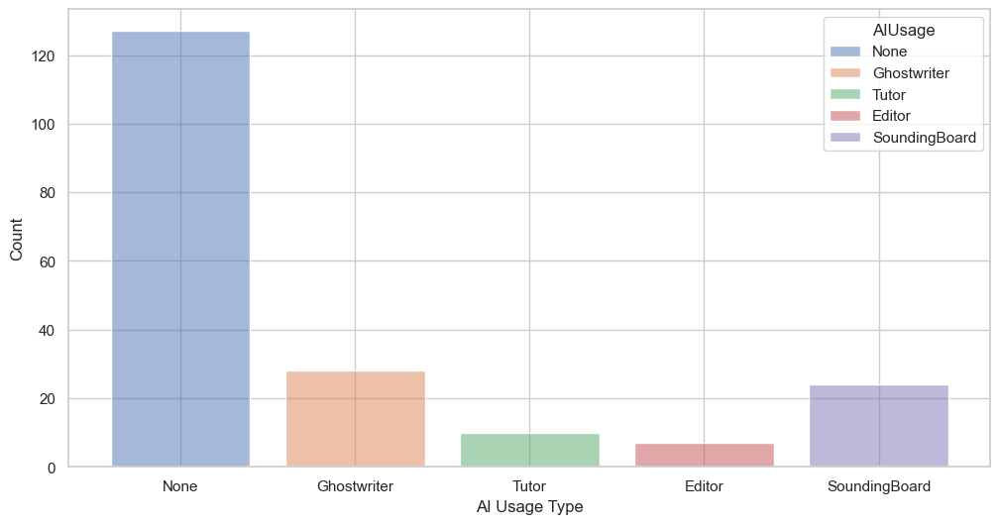

In [548]:
df_filtered = df[df['GROUP'] != 1]

custom_palette = sns.color_palette("tab10", n_colors=6, desat=1)
# Plot the countplot with stacked bars
plt.figure(figsize=(12, 6))
sns.histplot(data=df_filtered, x='AIUsage', hue='AIUsage', shrink=0.8)
#plt.title('AI Usage')
sns.set_palette(custom_palette)
plt.xlabel('AI Usage Type')
plt.ylabel('Count')
plt.show()

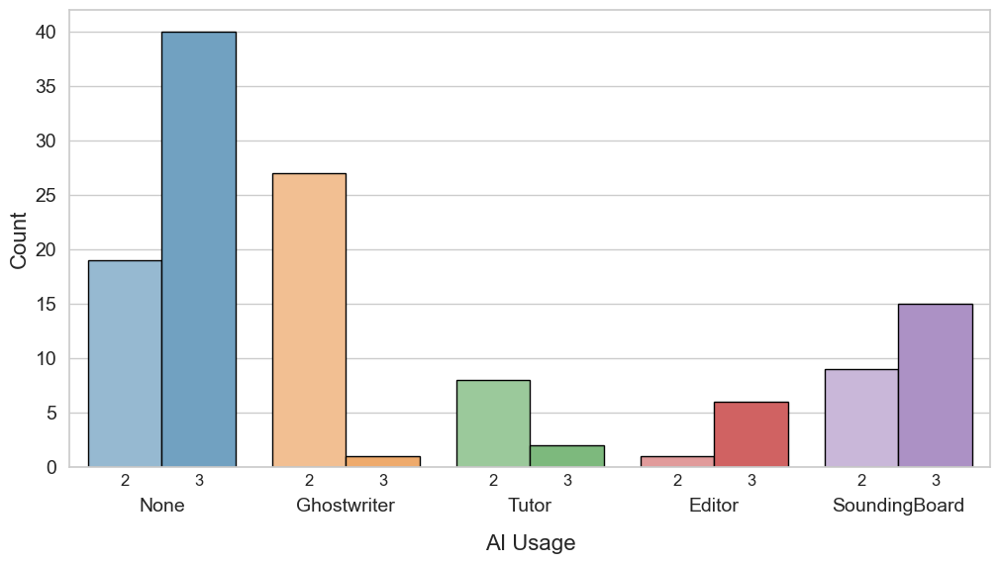

In [549]:
df_filtered = df[df['GROUP'] != '1'].copy()

# If Group categorical, remove unused categories
if isinstance(df_filtered['GROUP'].dtype, pd.CategoricalDtype):
    df_filtered['GROUP'] = df_filtered['GROUP'].cat.remove_unused_categories()

# Plot for 'AIUsage'
plt.figure(figsize=(12, 6))
bars = sns.countplot(data=df_filtered, x='AIUsage', hue='GROUP', dodge=True, 
                     edgecolor='black', linewidth=1)

# Color palette
manual_colors = [
    "#96B9D1", "#F2BF92",  
    "#9BC99B", "#E19B9B", 
    "#C9B7D9", "#71A1C1", 
    "#EEAA6C", "#7DB97D", 
    "#D06262", "#AC91C5" 
]

for i, bar in enumerate(bars.patches):
    bar.set_facecolor(manual_colors[i])

# Remove default legend
bars.legend_.remove()

# Add text for the "legend"
#plt.text(x=4.1, y=39, s="Group", fontsize=12, ha='center') 
#plt.text(x=4.1, y=36, s="Light: 2", fontsize=12, ha='center') 
#plt.text(x=4.1, y=33, s="Dark: 3", fontsize=12, ha='center')

# Annotate each bar
for i, bar in enumerate(bars.patches):
    height = -2 # bar height
    x_position = bar.get_x() + bar.get_width() / 2
    
    group_label = '2' if i <= 4 else '3'
    
    bars.text(x_position, height, group_label, ha='center', va='bottom', fontsize=12)

# Set titles and labels
#plt.title('AI Usage by Treatment Group')
plt.gca().tick_params(axis='x', which='both', pad=16, labelsize=14)
plt.gca().tick_params(axis='y', which='both', labelsize=14)
plt.xlabel('AI Usage', labelpad=14, fontsize=16)
plt.ylabel('Count', fontsize=16)
plt.show()

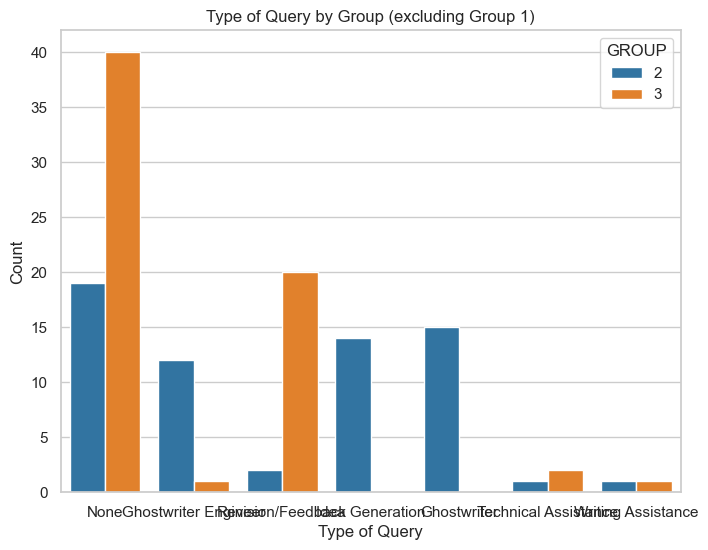

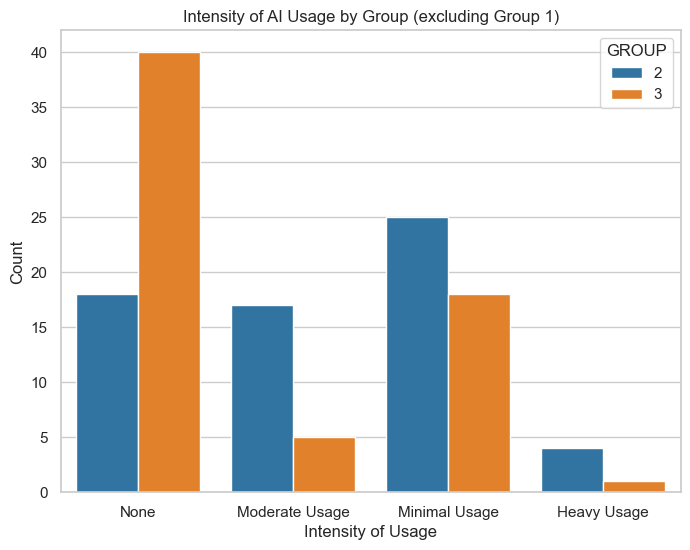

In [550]:
df_filtered = df[df['GROUP'] != '1'].copy()

# If 'GROUP' is categorical, remove unused categories
if isinstance(df_filtered['GROUP'].dtype, pd.CategoricalDtype):
    df_filtered['GROUP'] = df_filtered['GROUP'].cat.remove_unused_categories()

# Plot Type_of_Query
plt.figure(figsize=(8, 6))
sns.countplot(data=df_filtered, x='Type_of_Query', hue='GROUP')
plt.title('Type of Query by Group (excluding Group 1)')
plt.xlabel('Type of Query')
plt.ylabel('Count')
plt.show()

# Plot Intensity_of_Usage
plt.figure(figsize=(8, 6))
sns.countplot(data=df_filtered, x='Intensity_of_Usage', hue='GROUP')
plt.title('Intensity of AI Usage by Group (excluding Group 1)')
plt.xlabel('Intensity of Usage')
plt.ylabel('Count')
plt.show()

## Correlation

                         NoveltyIndex  UsefulnessIndex  EmotionsIndex  \
NoveltyIndex                 1.000000         0.148643       0.598596   
UsefulnessIndex              0.148643         1.000000       0.551274   
EmotionsIndex                0.598596         0.551274       1.000000   
Motivation_Change            0.112369        -0.053468       0.142925   
SelfEfficacy_Change          0.043557         0.153202       0.148073   
Age                         -0.172758        -0.191463      -0.292942   
Gender                       0.068842        -0.027219      -0.013041   
Education                   -0.010838        -0.031799      -0.041731   
Lang_Level                  -0.003951        -0.117464       0.005955   
OwnershipIndex               0.195151         0.388103       0.370724   
High_Skilled                 0.132647        -0.008141       0.023140   
CW_SelfConcept               0.135411         0.124734       0.113368   
Pre_Motivation_Index        -0.019037         0.124

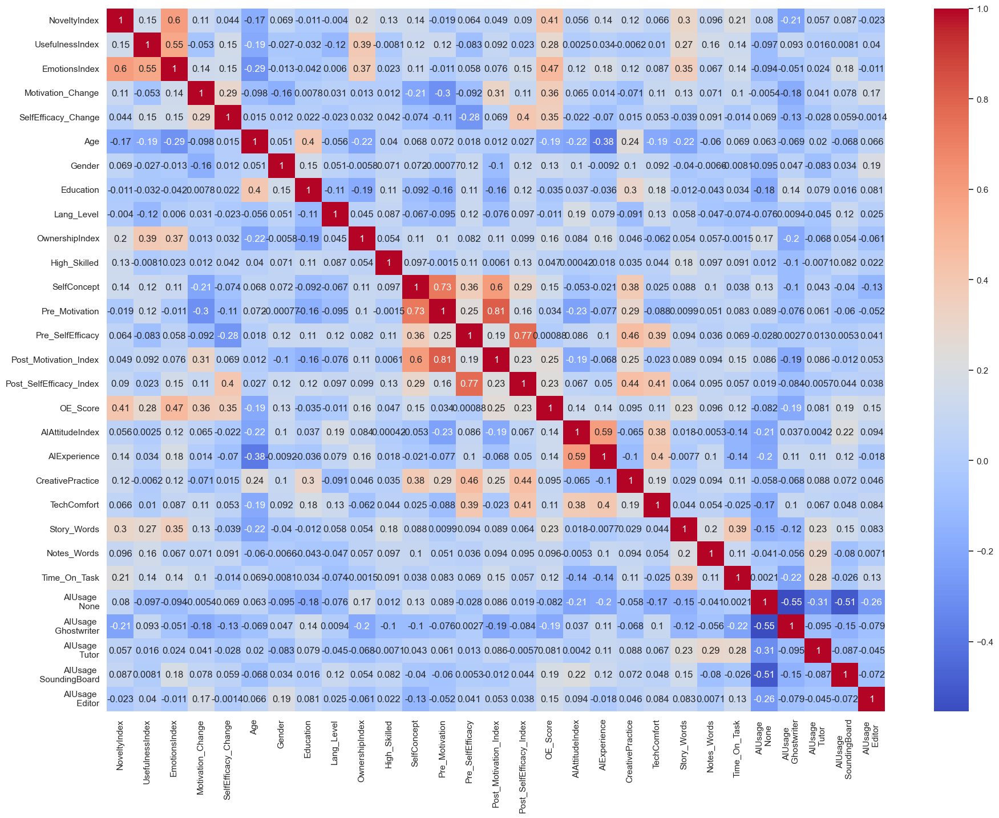

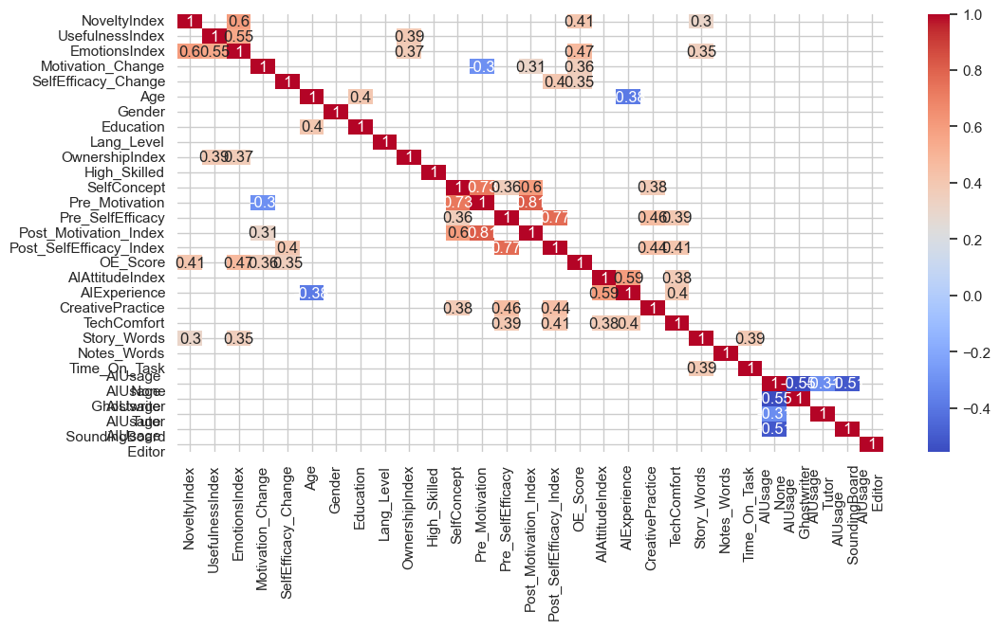

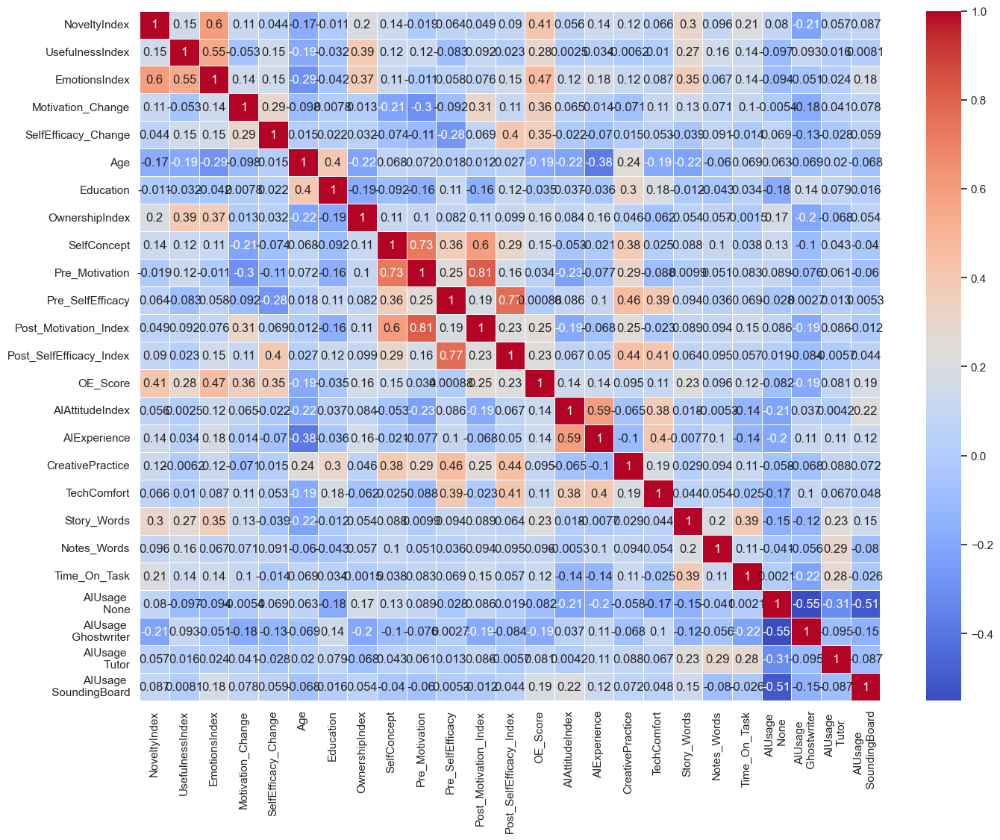

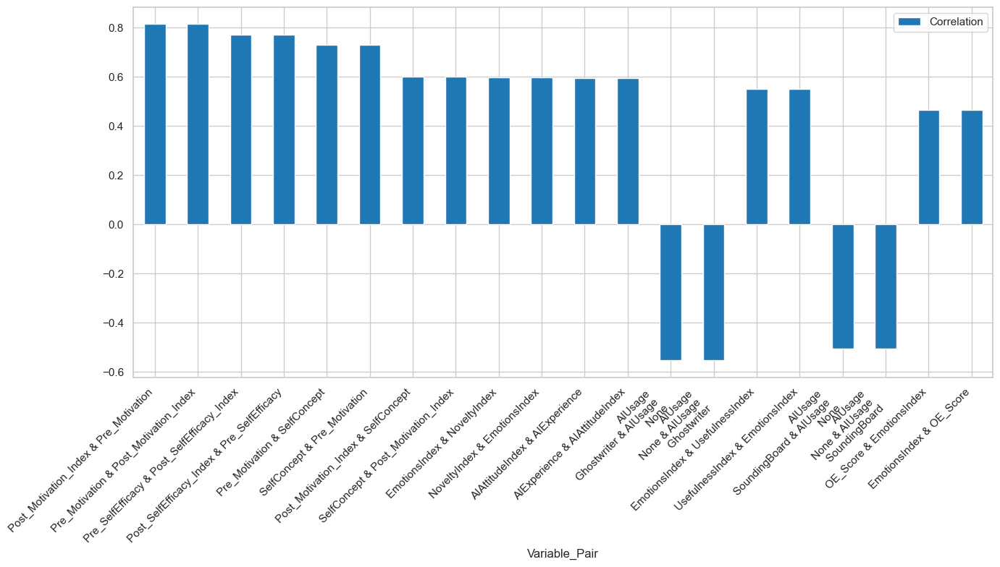

In [551]:
## Correlation Matrix ##
# Define different variables for different matrices
columns_of_interestOE = ['NoveltyIndex', 'UsefulnessIndex', 'EmotionsIndex', 'Motivation_Change', 
                       'SelfEfficacy_Change', 'OE_Score', 'OE_Novelty', 'OE_Usefulness', 'OE_Emotions',
                        'OE_Feasible', 'Feasible', 'OE_Appropriate', 'Appropriate',
                       'OE_Novel', 'Novel', 'OE_Original', 'Original', 'OE_Rare', 'Rare']
columns_of_interest = ['NoveltyIndex', 'UsefulnessIndex', 'EmotionsIndex', 'Motivation_Change', 
                       'SelfEfficacy_Change', 'Age', 'Gender', 'Education', 'Lang_Level', 'OwnershipIndex', 
                       'High_Skilled', 'CW_SelfConcept', 'Pre_Motivation_Index', 
                       'Pre_SelfEfficacy_Index', 'Post_Motivation_Index','Post_SelfEfficacy_Index', 'OE_Score',
                        'AIAttitudeIndex', 'AIExperience', 'CreativePractice',
                       'TechComfort', 'Story_Words', 'Notes_Words', 'Time_On_Task',
                       'AIUsage_None', 'AIUsage_Ghostwriter', 'AIUsage_Tutor', 'AIUsage_SoundingBoard', 'AIUsage_Editor']
columns_of_interest_filtered = ['NoveltyIndex', 'UsefulnessIndex', 'EmotionsIndex', 'Motivation_Change', 
                       'SelfEfficacy_Change', 'Age', 'OwnershipIndex', 
                       'CW_SelfConcept', 'Pre_Motivation_Index', 
                       'Pre_SelfEfficacy_Index', 'OE_Score', 'Pre_AIAttitude_Index', 'AIExperience',
                       'Story_Words',
                        'AIUsage_None', 'AIUsage_Ghostwriter', 'DAT']
correlation_matrix = df[columns_of_interest].corr()
print(correlation_matrix)

# Define a mapping for the desired labels
label_mapping = {
    'CW_SelfConcept': 'SelfConcept',
    'Pre_Motivation_Index': 'Pre_Motivation',
    'Pre_SelfEfficacy_Index': 'Pre_SelfEfficacy',
    'Pre_AIAttitude_Index': 'AIAttitude',
    'AIUsage_None': 'AIUsage \n None',
    'AIUsage_Ghostwriter': 'AIUsage \n Ghostwriter',
    'AIUsage_SoundingBoard': 'AIUsage \n SoundingBoard',
    'AIUsage_Tutor': 'AIUsage \n Tutor',
    'AIUsage_Editor': 'AIUsage \n Editor',
    'First_Action_Seconds': 'First Action \n Seconds',
}

# Rename columns and index of the correlation matrix using the mapping
correlation_matrix = correlation_matrix.rename(columns=label_mapping, index=label_mapping)

'''
correlation_matrix.rename(columns={'NoveltyIndex': 'Novelty \n Index'}, inplace=True)
correlation_matrix.rename(columns={'UsefulnessIndex': 'Usefulness \n Index'}, inplace=True)
correlation_matrix.rename(columns={'EmotionsIndex': 'Emotions \n Index'}, inplace=True)
correlation_matrix.rename(columns={'Motivation_Change': 'Motivation \n Change'}, inplace=True)
correlation_matrix.rename(columns={'SelfEfficacy_Change': 'Self-Efficacy \n Change'}, inplace=True)
correlation_matrix.rename(columns={'OwnershipIndex': 'Ownership \n Index'}, inplace=True)
correlation_matrix.rename(columns={'MotivationIndex': 'Motivation \n Index'}, inplace=True)
correlation_matrix.rename(columns={'SelfEfficacyIndex': 'SelfEfficacy \n Index'}, inplace=True)
correlation_matrix.rename(columns={'First_Action_Seconds': 'First_Action_ \n Seconds'}, inplace=True)
correlation_matrix.rename(columns={'AIUsage_None': 'AIUsage \n None'}, inplace=True)
correlation_matrix.rename(columns={'AIUsage_Ghostwriter': 'AIUsage \n Ghostwriter'}, inplace=True)
correlation_matrix.rename(columns={'AIUsage_Tutor': 'AIUsage \n Tutor'}, inplace=True)
correlation_matrix.rename(columns={'AIUsage_SoundingBoard': 'AIUsage \n SoundingBoard'}, inplace=True)
correlation_matrix.rename(columns={'AIUsage_Editor': 'AIUsage \n Editor'}, inplace=True)

correlation_matrix.rename(index={'NoveltyIndex': 'Novelty \n Index'}, inplace=True)
correlation_matrix.rename(index={'UsefulnessIndex': 'Usefulness \n Index'}, inplace=True)
correlation_matrix.rename(index={'EmotionsIndex': 'Emotions \n Index'}, inplace=True)
correlation_matrix.rename(index={'Motivation_Change': 'Motivation \n Change'}, inplace=True)
correlation_matrix.rename(index={'SelfEfficacy_Change': 'Self-Efficacy \n Change'}, inplace=True)
correlation_matrix.rename(index={'OwnershipIndex': 'Ownership \n Index'}, inplace=True)
correlation_matrix.rename(index={'MotivationIndex': 'Motivation \n Index'}, inplace=True)
correlation_matrix.rename(index={'SelfEfficacyIndex': 'SelfEfficacy \n Index'}, inplace=True)
correlation_matrix.rename(index={'First_Action_Seconds': 'First_Action_ \n Seconds'}, inplace=True)
correlation_matrix.rename(index={'AIUsage_None': 'AIUsage \n None'}, inplace=True)
correlation_matrix.rename(index={'AIUsage_Ghostwriter': 'AIUsage \n Ghostwriter'}, inplace=True)
correlation_matrix.rename(index={'AIUsage_Tutor': 'AIUsage \n Tutor'}, inplace=True)
correlation_matrix.rename(index={'AIUsage_SoundingBoard': 'AIUsage \n SoundingBoard'}, inplace=True)
correlation_matrix.rename(index={'AIUsage_Editor': 'AIUsage \n Editor'}, inplace=True)
'''

# Heatmap
plt.figure(figsize=(22, 16))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm')
#plt.title('Correlation Matrix for Selected Columns')
plt.show()

# Filter correlations
high_corr = correlation_matrix[(correlation_matrix > 0.3) | (correlation_matrix < -0.3)]

plt.figure(figsize=(12, 6))
sns.heatmap(high_corr, annot=True, cmap='coolwarm')
#plt.title('Correlation Matrix for Selected Columns')
plt.show()

# Define correlation threshold
threshold = 0.29

# Matrix without diagonal
correlation_matrix_no_diag = correlation_matrix.copy()

for i in range(len(correlation_matrix_no_diag)):
    correlation_matrix_no_diag.iloc[i, i] = 0

# Correlations above the threshold
high_corr_vars = correlation_matrix_no_diag.columns[(correlation_matrix_no_diag.abs() > threshold).any()].tolist()

# Filter
filtered_corr_matrix = correlation_matrix.loc[high_corr_vars, high_corr_vars]

# Plot filtered corr matrix
plt.figure(figsize=(16, 12))
sns.heatmap(filtered_corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5, vmin=-0.55, vmax=1)
#plt.title(f'Correlation Matrix (Filtered by Correlation > {threshold})')
plt.show()

# Pairwise plot
#sns.pairplot(df[columns_of_interest], diag_kind='kde', plot_kws={'alpha':0.5}, height=2.5)
#plt.show()

# Remove self-correlations
#corr_matrix = correlation_matrix[correlation_matrix['Variable_1'] != correlation_matrix['Variable_2']]

corr_matrix = correlation_matrix.unstack().reset_index()

# Rename columns
corr_matrix.columns = ['Variable_1', 'Variable_2', 'Correlation']

# Remove self-correlations
corr_matrix = corr_matrix[corr_matrix['Variable_1'] != corr_matrix['Variable_2']]

# Sort by absolute correlation value
corr_matrix['abs_correlation'] = corr_matrix['Correlation'].abs()
sorted_corr = corr_matrix.sort_values(by='abs_correlation', ascending=False)

# Combine into a single label for the x-axis
sorted_corr['Variable_Pair'] = sorted_corr['Variable_1'] + " & " + sorted_corr['Variable_2']

# Plot top 20 correlations
sorted_corr.head(20).plot(kind='bar', x='Variable_Pair', y='Correlation', figsize=(14, 8))

plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

## Chronbach’s alpha

In [552]:
df['BoringReversed'] = df.apply(lambda row: (7 - row['Boring']), axis=1)
df['ByAIReversed'] = df.apply(lambda row: (7 - row['ByAI']), axis=1)

indices_items = {
    'NoveltyIndex': ['Rare', 'Original', 'Novel'],
    'UsefulnessIndex': ['Feasible', 'Appropriate'],
    'EmotionsIndex': ['Funny', 'WellWritten', 'Twist', 'Enjoyed', 'BoringReversed'],
    'Pre_MotivationIndex': ['PreQ_CWFun', 'PreQ_WSValue', 'PreQ_WSGoal', 'PreQ_WSEffort'],
    'Pre_SelfEfficacyIndex': ['PreQ_NovelIdeas', 'PreQ_ConfidentCreative', 'PreQ_ThinkOutsideBox'],
    'Pre_AIAttidudeIndex': ['PreQGPT_AITrust', 'PreQGPT_EthicsIdea', 'PreQGPT_EthicsPublish'],
    'OwnershipIndex': ['AuthorsIdea', 'ByAIReversed'],
    'OE_Score': ['OE_Novelty','OE_Usefulness', 'OE_Emotions']
}

# Compute Cronbach's alpha for each index
for index, items in indices_items.items():
    df_index = df[items]
    alpha, ci = pg.cronbach_alpha(df_index)
    
    # Print the results
    print(f'Cronbach\'s Alpha for {index}: {alpha:.4f}, Confidence Interval: {ci}')

Cronbach's Alpha for NoveltyIndex: 0.9229, Confidence Interval: [0.902 0.94 ]
Cronbach's Alpha for UsefulnessIndex: 0.7378, Confidence Interval: [0.653 0.802]
Cronbach's Alpha for EmotionsIndex: 0.6951, Confidence Interval: [0.622 0.758]
Cronbach's Alpha for Pre_MotivationIndex: 0.9082, Confidence Interval: [0.885 0.928]
Cronbach's Alpha for Pre_SelfEfficacyIndex: 0.8484, Confidence Interval: [0.808 0.882]
Cronbach's Alpha for Pre_AIAttidudeIndex: 0.5934, Confidence Interval: [0.484 0.683]
Cronbach's Alpha for OwnershipIndex: 0.4316, Confidence Interval: [0.247 0.571]
Cronbach's Alpha for OE_Score: 0.4348, Confidence Interval: [0.283 0.559]


# Assumption Checks

## Linearity, Homoscedasticity


---- Testing Linearity for 'NoveltyIndex' with Nominal Predictor 'GROUP' ----
All predictors are numeric.
Outcome variable is numeric.


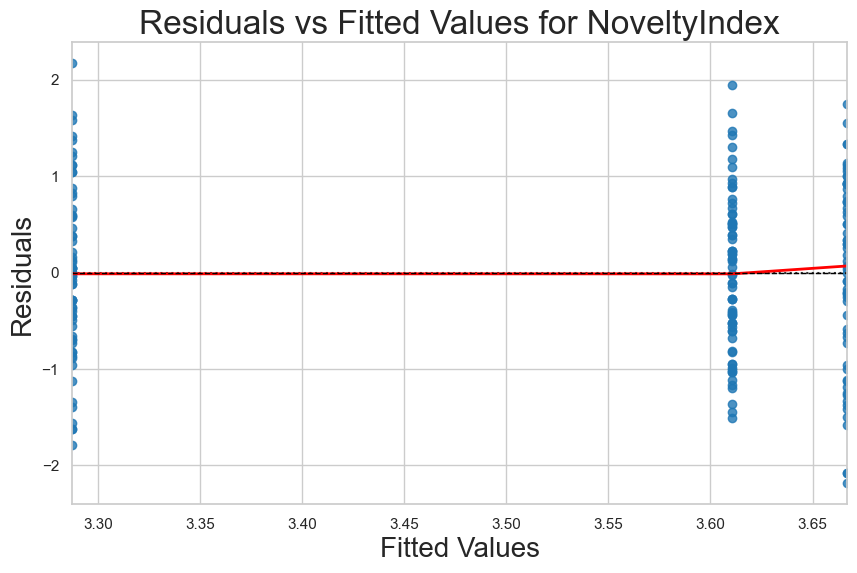

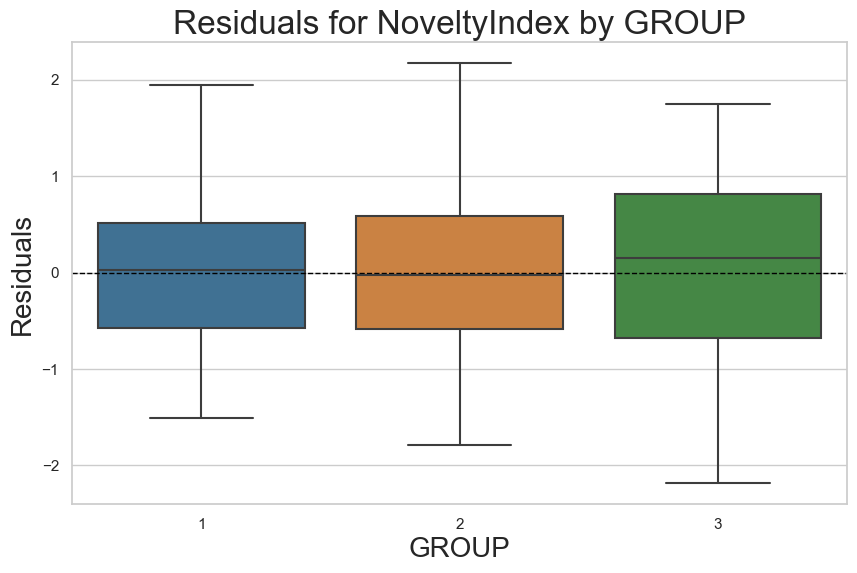


---- Testing Linearity for 'UsefulnessIndex' with Nominal Predictor 'GROUP' ----
'GROUP' is already a categorical variable.
All predictors are numeric.
Outcome variable is numeric.


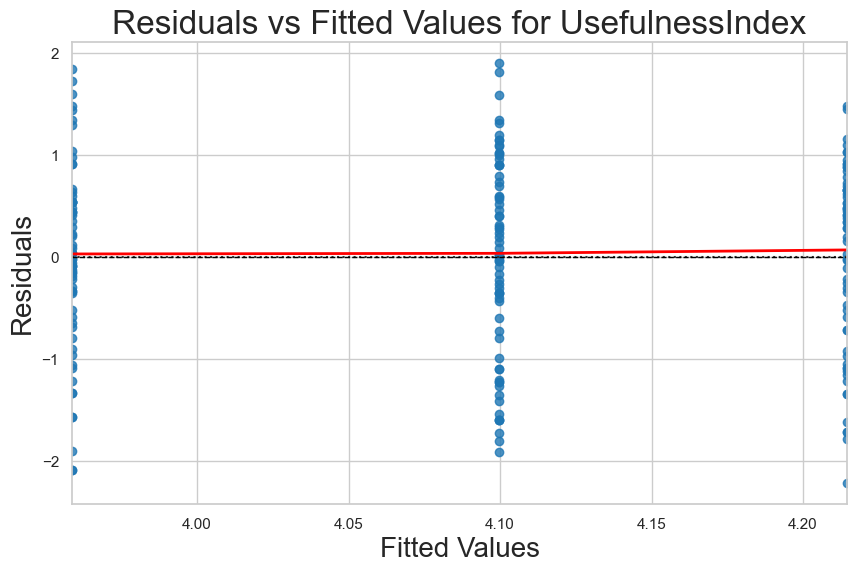

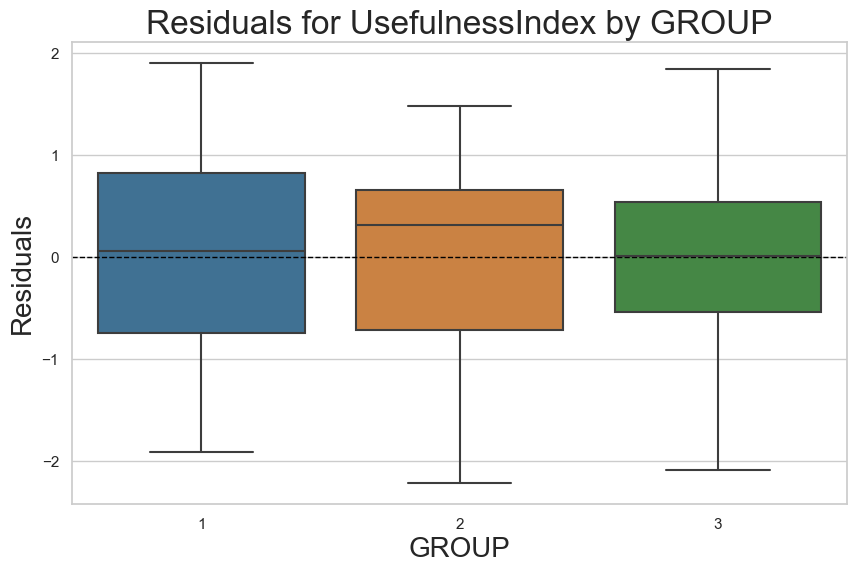


---- Testing Linearity for 'EmotionsIndex' with Nominal Predictor 'GROUP' ----
'GROUP' is already a categorical variable.
All predictors are numeric.
Outcome variable is numeric.


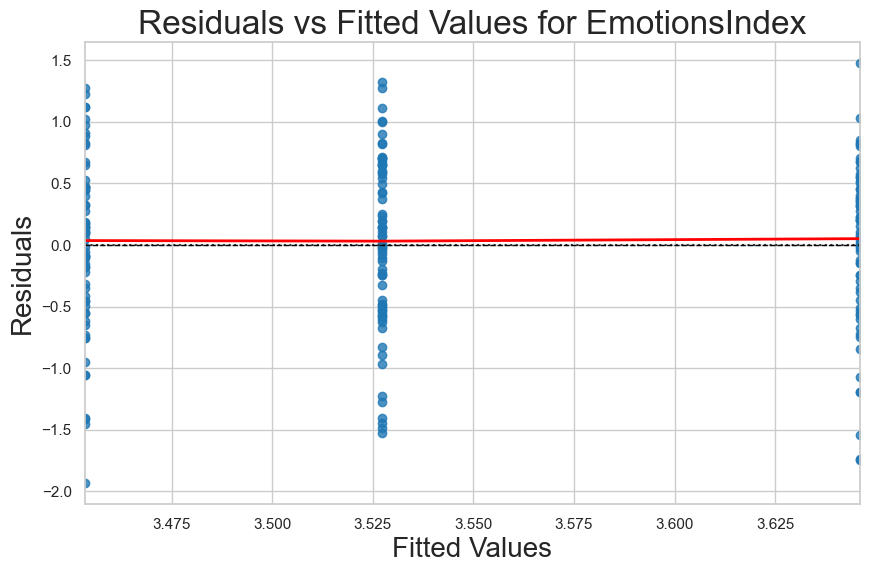

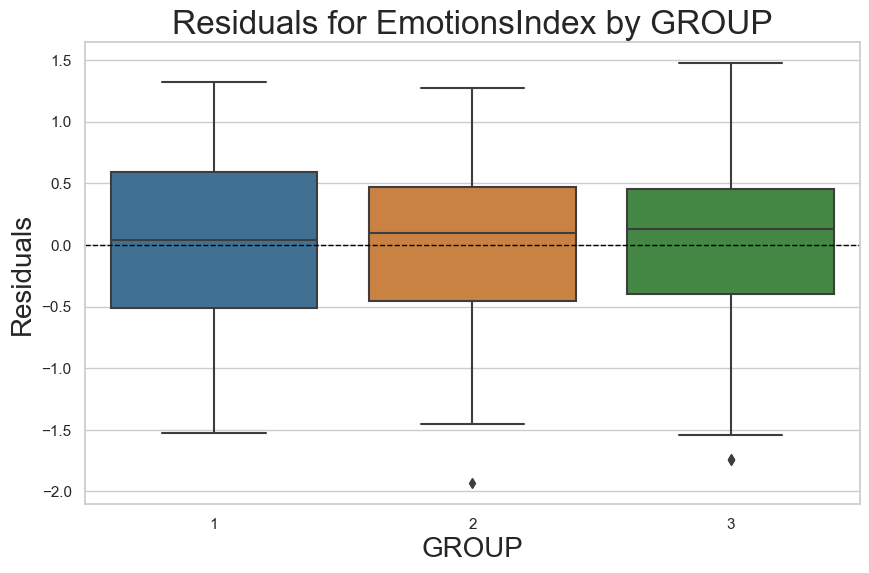

In [553]:
## For Novelty, Usefulness, Emotions ##
df['GROUP'] = pd.to_numeric(df['GROUP'], errors='coerce')
palette = {'1': '#3274A1', '2': '#E1812C', '3': '#3A923A'}
group_order = ['1', '2', '3']

def check_linearity_nominal(df, outcome_var, predictor):
    print(f"\n---- Testing Linearity for '{outcome_var}' with Nominal Predictor '{predictor}' ----")

    if not isinstance(df[predictor].dtype, pd.CategoricalDtype):
        df[predictor] = df[predictor].astype('category')
    else:
        print(f"'{predictor}' is already a categorical variable.")
    
    # Create dummy variables
    X = pd.get_dummies(df[predictor], drop_first=True).astype(int)
    
    # Ensure outcome variable is numeric
    df[outcome_var] = pd.to_numeric(df[outcome_var], errors='coerce')
    
    # Combine predictors and outcome, drop missing values
    data = pd.concat([X, df[outcome_var]], axis=1).dropna()
    X = data[X.columns]
    y = data[outcome_var]
    
    # Identify non-numeric columns in predictors
    non_numeric_cols = X.columns[~X.dtypes.apply(pd.api.types.is_numeric_dtype)]
    if not non_numeric_cols.empty:
        print("\nError: Non-numeric columns found in predictors:", non_numeric_cols.tolist())
        return
    else:
        print("All predictors are numeric.")
    
    # Verify outcome variable is numeric
    if not pd.api.types.is_numeric_dtype(y):
        print("Error: Outcome variable is not numeric.")
        return
    else:
        print("Outcome variable is numeric.")
    
    # Add constant for intercept
    X = sm.add_constant(X)
    
    # Fit OLS model
    try:
        model = sm.OLS(y, X).fit()
    except Exception as e:
        print(f"Error fitting model: {e}")
        return
    
    # Residuals vs Fitted Values Plot
    fitted_vals = model.fittedvalues
    residuals = model.resid
    
    plt.figure(figsize=(10, 6))
    sns.residplot(x=fitted_vals, y=residuals, lowess=True, line_kws={'color': 'red', 'lw': 2})
    plt.title(f'Residuals vs Fitted Values for {outcome_var}', fontsize=24)
    plt.xlabel('Fitted Values', fontsize=20)
    plt.ylabel('Residuals', fontsize=20)
    plt.axhline(0, color='black', linestyle='--', linewidth=1)
    plt.show()
    
    # Residuals by Group Boxplot
    plt.figure(figsize=(10, 6))
    residuals_by_group = residuals.copy()
    residuals_by_group.index = data.index
    sns.boxplot(x=df.loc[data.index, predictor].astype(str), y=residuals_by_group, palette=palette, order=group_order)
    plt.title(f'Residuals for {outcome_var} by {predictor}', fontsize=24)
    plt.xlabel(predictor, fontsize=20)
    plt.ylabel('Residuals', fontsize=20)
    plt.axhline(0, color='black', linestyle='--', linewidth=1)
    plt.show()

check_linearity_nominal(df, 'NoveltyIndex', 'GROUP')
check_linearity_nominal(df, 'UsefulnessIndex', 'GROUP')
check_linearity_nominal(df, 'EmotionsIndex', 'GROUP')




---- Testing Linearity for Post_Motivation_Index ----


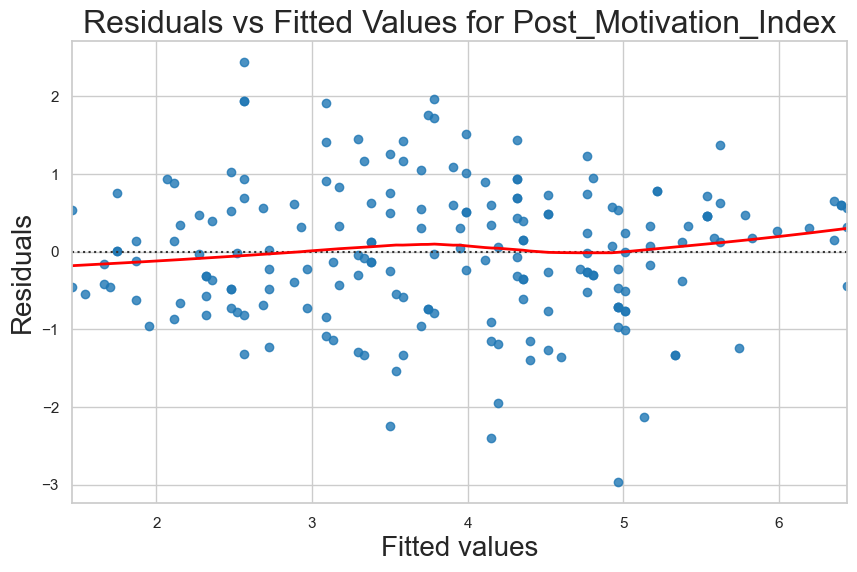



---- Testing Linearity for Post_SelfEfficacy_Index ----


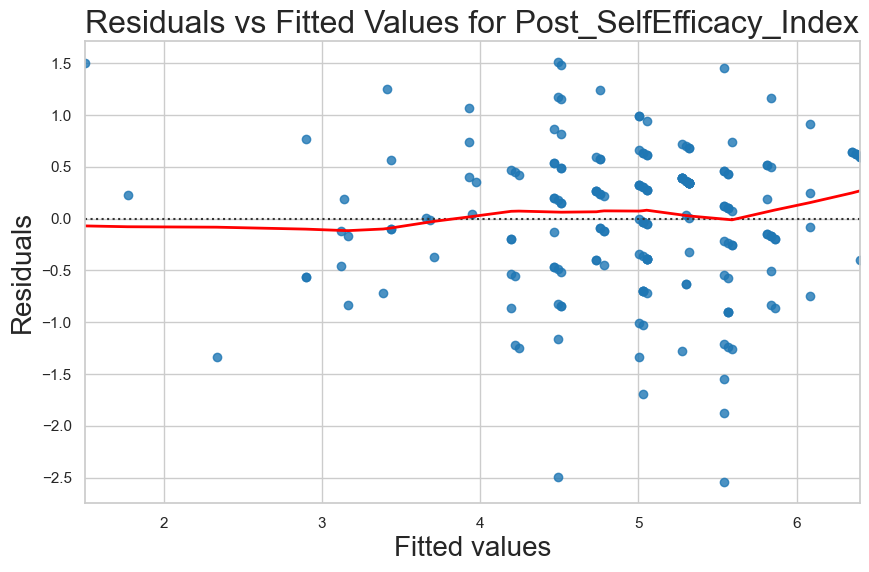

In [554]:
df['GROUP'] = pd.to_numeric(df['GROUP'], errors='coerce')

def check_linearity_with_additional_predictors(df, outcome_vars, predictors):
    for outcome_var in outcome_vars:
        print(f"\n\n---- Testing Linearity for {outcome_var} ----")

        # Create dummy variables for categorical predictors
        X = pd.get_dummies(df[predictors], drop_first=True)
        
        # Ensure all X columns are numeric
        X = X.apply(pd.to_numeric, errors='coerce')
        
        # Ensure outcome variable is numeric and coerce errors (non-numeric values become NaN)
        y = pd.to_numeric(df[outcome_var], errors='coerce')
        
        # Drop rows with missing values in X or y
        non_null_indices = X.dropna().index.intersection(y.dropna().index)
        X = X.loc[non_null_indices]
        y = y.loc[non_null_indices]
        
        # Verify data types
        if not pd.api.types.is_numeric_dtype(y):
            print(f"Outcome variable {outcome_var} is not numeric after conversion.")
            continue
        
        if not all(pd.api.types.is_numeric_dtype(dtype) for dtype in X.dtypes):
            print(f"Predictors for {outcome_var} contain non-numeric data types.")
            print(X.dtypes)
            continue

        # Fit the model with the additional predictors
        try:
            X = sm.add_constant(X)  # Add intercept
            model = sm.OLS(y, X).fit()

            # Residuals vs Fitted values plot
            fitted_vals = model.fittedvalues
            residuals = model.resid
            plt.figure(figsize=(10, 6))
            sns.residplot(x=fitted_vals, y=residuals, lowess=True, line_kws={'color': 'red', 'lw': 2})
            plt.title(f'Residuals vs Fitted Values for {outcome_var}', fontsize=23)
            plt.xlabel('Fitted values', fontsize=20)
            plt.ylabel('Residuals', fontsize=20)
            plt.show()
        except Exception as e:
            print(f"Error fitting model for {outcome_var}: {e}")

check_linearity_with_additional_predictors(
    df, 
    ['Post_Motivation_Index'], 
    ['GROUP','Pre_Motivation_Index']
)
check_linearity_with_additional_predictors(
    df, 
    ['Post_SelfEfficacy_Index'], 
    ['GROUP','Pre_SelfEfficacy_Index']
)

## Multicollinearity

In [555]:
# Function to check multicollinearity using VIF
def check_multicollinearity(df, confounders):
    X = df[confounders]
    X = sm.add_constant(X) 
    vif_data = pd.DataFrame()
    vif_data['Variable'] = X.columns
    vif_data['VIF'] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
    print("\nVariance Inflation Factor (VIF) for Confounders:")
    print(vif_data)

check_multicollinearity(df, ['DAT_standardized', 'Age_standardized', 'CW_SelfConcept', 
                             'Education_standardized', 'Lang_Level_standardized', 'AIExperience', 
                             'AIAttitude_Index_standardized', 'CreativePractice', 'Gender',
                             'Motivation_Index_standardized', 'SelfEfficacy_Index_standardized'])  # Replace with your confounders


Variance Inflation Factor (VIF) for Confounders:
                           Variable       VIF
0                             const  9.515878
1                  DAT_standardized  1.047303
2                  Age_standardized  1.470735
3                    CW_SelfConcept  2.491011
4            Education_standardized  1.474259
5           Lang_Level_standardized  1.118353
6                      AIExperience  1.794563
7     AIAttitude_Index_standardized  1.761723
8                  CreativePractice  1.593898
9                            Gender  1.056551
10    Motivation_Index_standardized  2.444647
11  SelfEfficacy_Index_standardized  1.443276


## Normality of Residuals

In [556]:
# Function to check normality of residuals
def check_normality_of_residuals(df, outcome_vars, group_var):
    for outcome_var in outcome_vars:
        print(f"\n\n---- Testing Normality for {outcome_var} ----")

        # Create dummy variables for the group and ensure they are integers
        X = pd.get_dummies(df[group_var], drop_first=True).astype(int)  # Convert boolean to integer
        y = pd.to_numeric(df[outcome_var], errors='coerce')  # Ensure outcome variable is numeric

        # Remove rows with missing values
        non_null_indices = X.index.intersection(y.dropna().index)
        X = X.loc[non_null_indices]
        y = y.loc[non_null_indices]

        # Add constant for intercept
        X = sm.add_constant(X)

        # Fit the model
        model = sm.OLS(y, X).fit()

        # Residuals
        residuals = model.resid

        # Q-Q plot
        #plt.figure(figsize=(10, 6))
        #sm.qqplot(residuals, line='45', fit=True)
        #plt.title(f'Q-Q Plot for {outcome_var} (Group as Independent Variable)')
        #plt.show()

        # Shapiro-Wilk test
        shapiro_stat, shapiro_p = stats.shapiro(residuals)
        print(f"\nShapiro-Wilk test p-value for {outcome_var}: {shapiro_p}")

# Example usage
check_normality_of_residuals(df, ['NoveltyIndex', 'UsefulnessIndex', 'EmotionsIndex', 'Motivation_Change', 'SelfEfficacy_Change','Post_Motivation_Index', 'Post_SelfEfficacy_Index'], 'GROUP')



---- Testing Normality for NoveltyIndex ----

Shapiro-Wilk test p-value for NoveltyIndex: 0.4640648066997528


---- Testing Normality for UsefulnessIndex ----

Shapiro-Wilk test p-value for UsefulnessIndex: 0.0012680304935202003


---- Testing Normality for EmotionsIndex ----

Shapiro-Wilk test p-value for EmotionsIndex: 0.007857795804738998


---- Testing Normality for Motivation_Change ----

Shapiro-Wilk test p-value for Motivation_Change: 0.07230687141418457


---- Testing Normality for SelfEfficacy_Change ----

Shapiro-Wilk test p-value for SelfEfficacy_Change: 0.0007072637672536075


---- Testing Normality for Post_Motivation_Index ----

Shapiro-Wilk test p-value for Post_Motivation_Index: 0.0038025344256311655


---- Testing Normality for Post_SelfEfficacy_Index ----

Shapiro-Wilk test p-value for Post_SelfEfficacy_Index: 6.066654168535024e-05


## Normality of Outcome Variables

Shapiro-Wilk test p-value for NoveltyIndex in Group 1: 0.5600433349609375
Shapiro-Wilk test p-value for NoveltyIndex in Group 2: 0.7759256362915039
Shapiro-Wilk test p-value for NoveltyIndex in Group 3: 0.026250066235661507


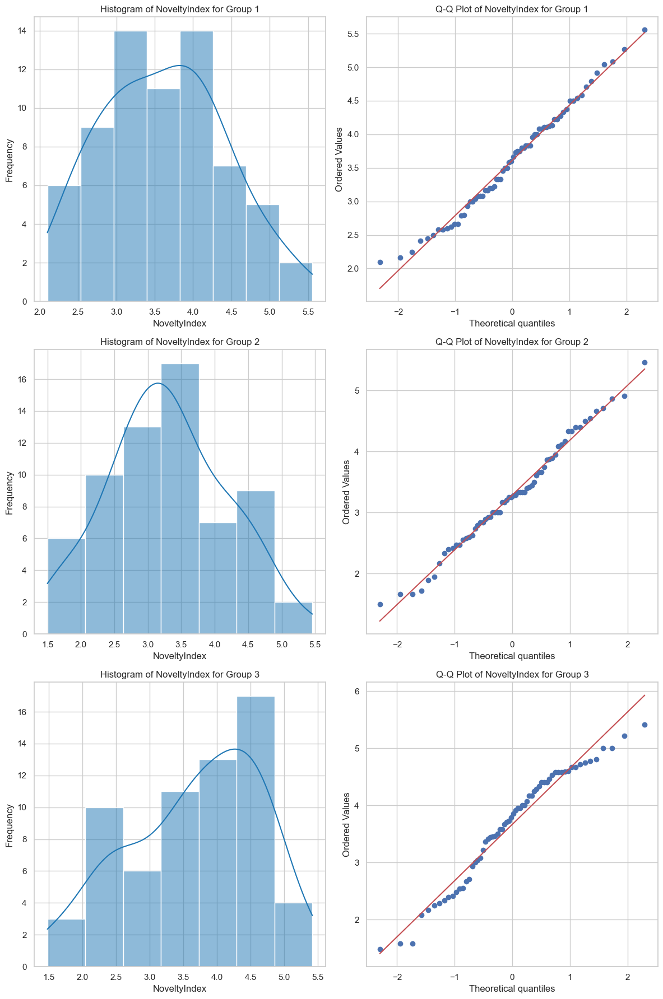

Shapiro-Wilk test p-value for UsefulnessIndex in Group 1: 0.05832555145025253
Shapiro-Wilk test p-value for UsefulnessIndex in Group 2: 0.00310441548936069
Shapiro-Wilk test p-value for UsefulnessIndex in Group 3: 0.3844294250011444


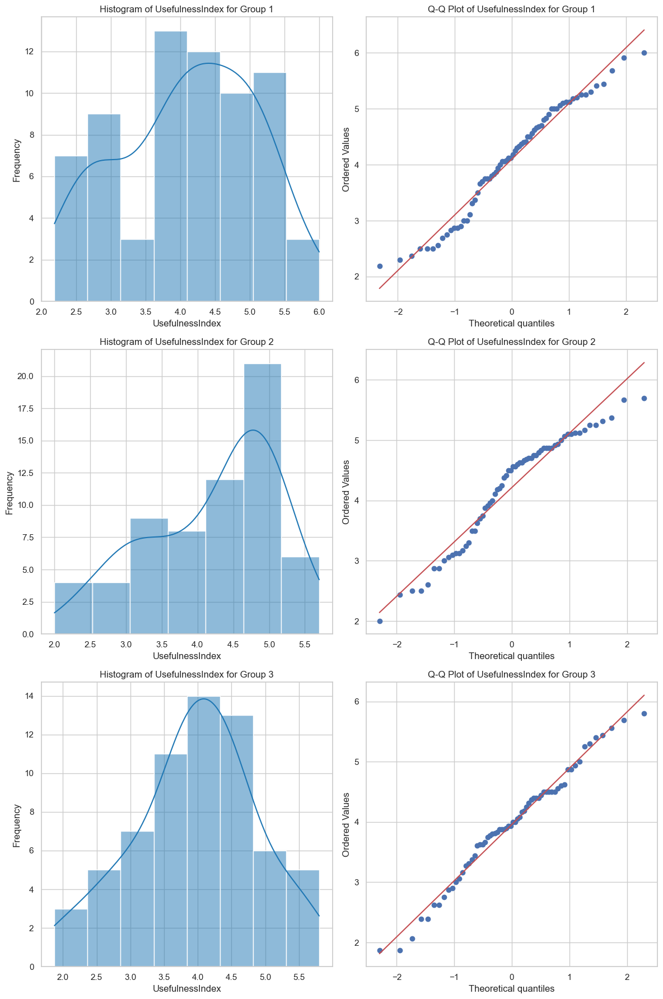

Shapiro-Wilk test p-value for EmotionsIndex in Group 1: 0.1589239537715912
Shapiro-Wilk test p-value for EmotionsIndex in Group 2: 0.3754551410675049
Shapiro-Wilk test p-value for EmotionsIndex in Group 3: 0.036078665405511856


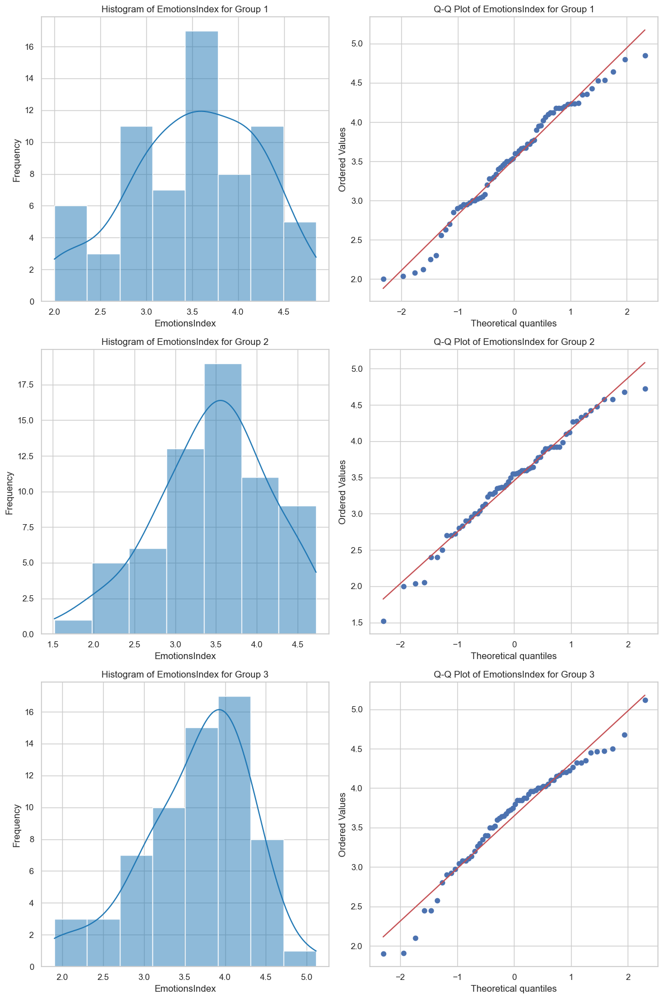

Shapiro-Wilk test p-value for Motivation_Change in Group 1: 0.0409780852496624
Shapiro-Wilk test p-value for Motivation_Change in Group 2: 0.0011566095054149628
Shapiro-Wilk test p-value for Motivation_Change in Group 3: 0.45514246821403503


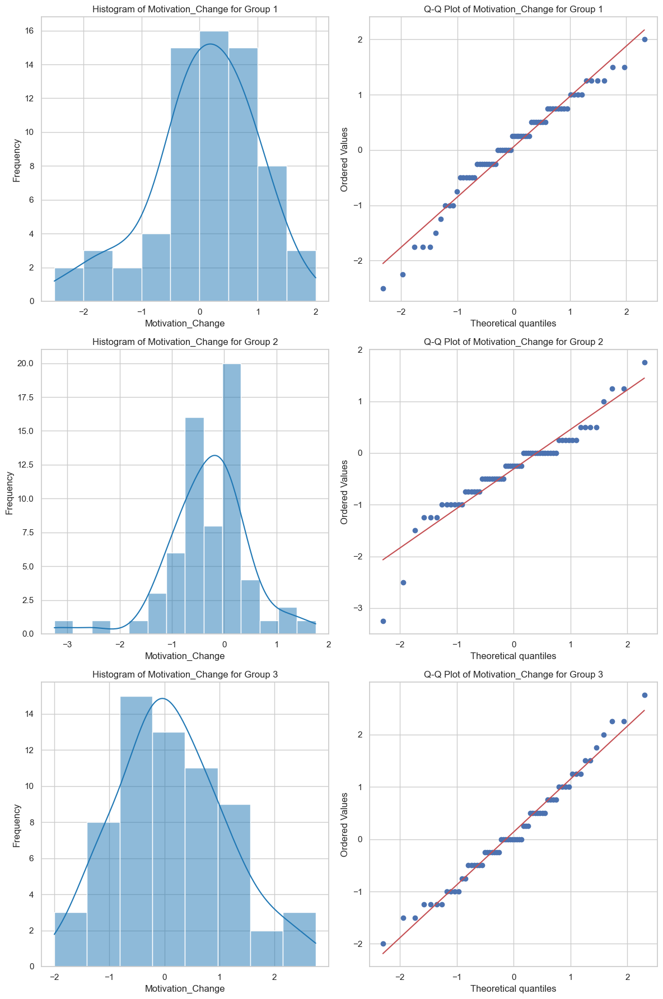

Shapiro-Wilk test p-value for SelfEfficacy_Change in Group 1: 0.0003161790082231164
Shapiro-Wilk test p-value for SelfEfficacy_Change in Group 2: 0.08808393776416779
Shapiro-Wilk test p-value for SelfEfficacy_Change in Group 3: 0.047975827008485794


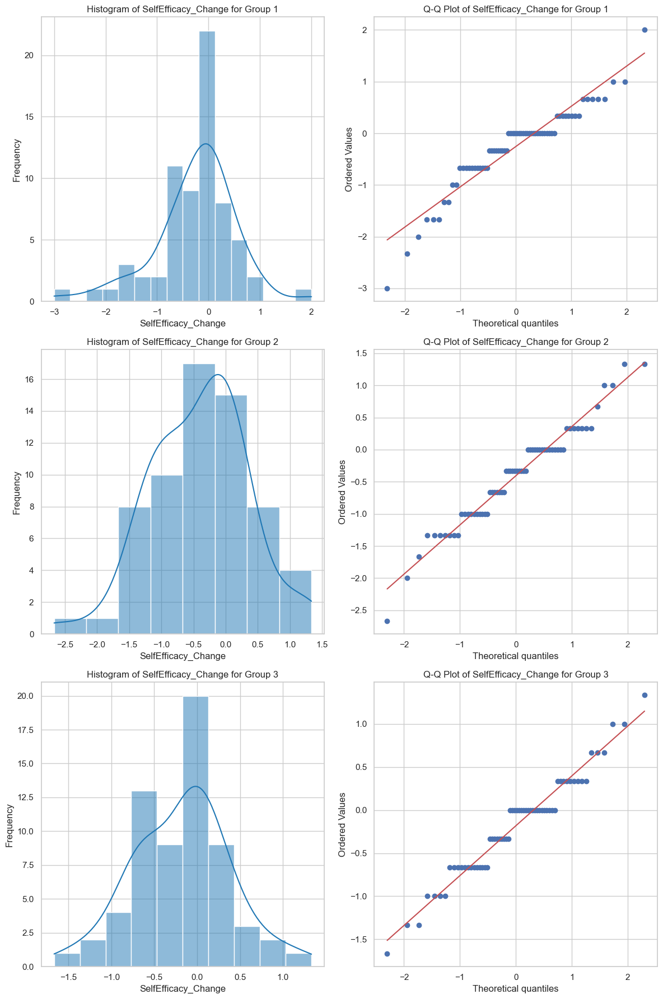

Shapiro-Wilk test p-value for Post_Motivation_Index in Group 1: 0.09425598382949829
Shapiro-Wilk test p-value for Post_Motivation_Index in Group 2: 0.05306641757488251
Shapiro-Wilk test p-value for Post_Motivation_Index in Group 3: 0.36700335144996643


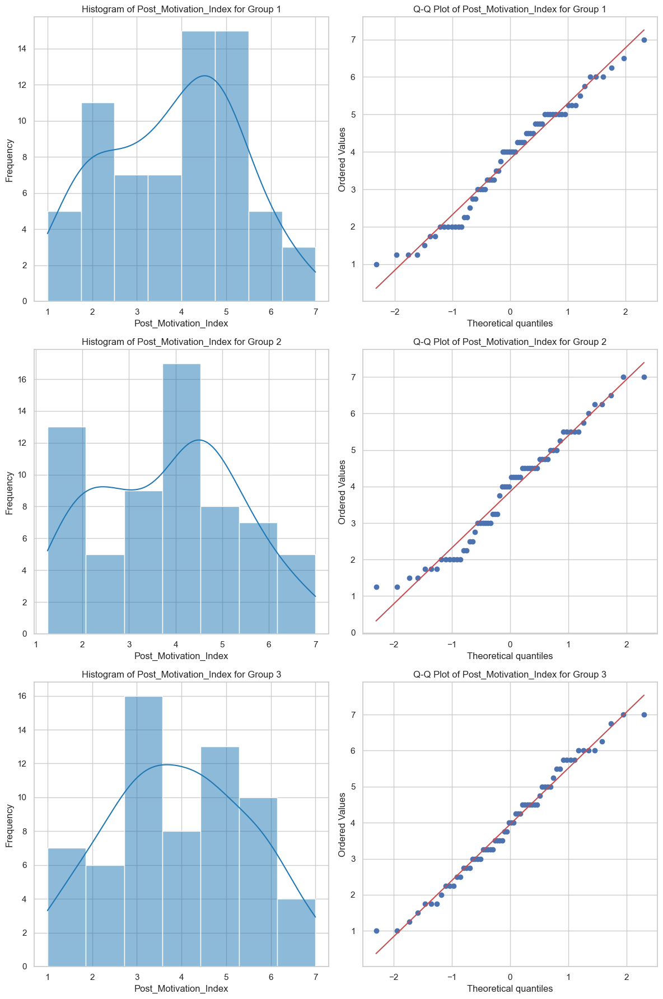

Shapiro-Wilk test p-value for Post_SelfEfficacy_Index in Group 1: 0.11382805556058884
Shapiro-Wilk test p-value for Post_SelfEfficacy_Index in Group 2: 0.005736962426453829
Shapiro-Wilk test p-value for Post_SelfEfficacy_Index in Group 3: 0.002583649242296815


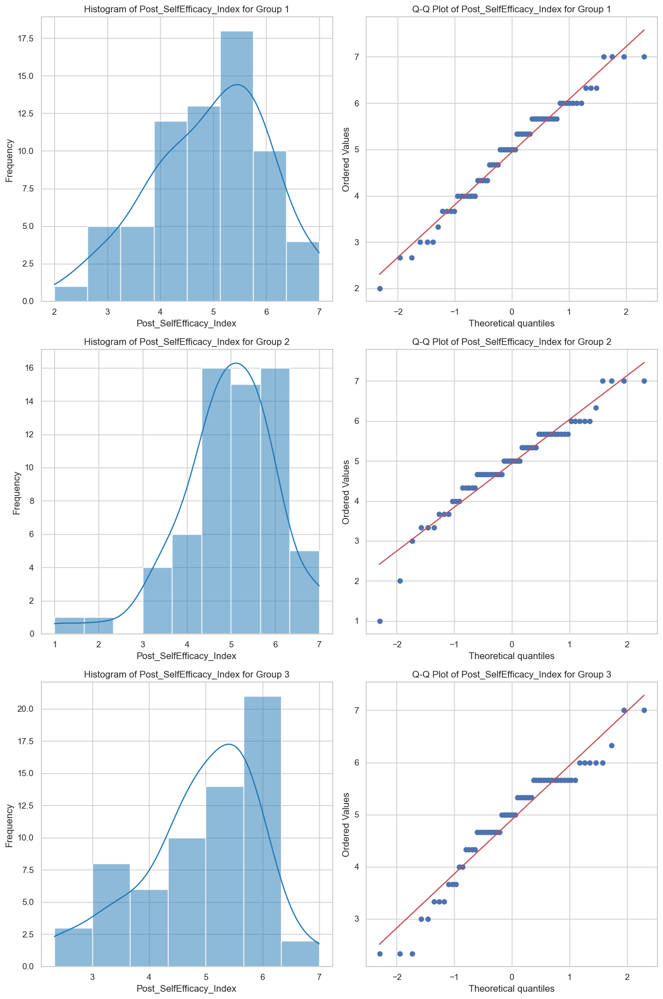

In [557]:
# List of outcome variables
outcome_vars = ['NoveltyIndex', 'UsefulnessIndex', 'EmotionsIndex', 'Motivation_Change', 'SelfEfficacy_Change', 'Post_Motivation_Index', 'Post_SelfEfficacy_Index']

groups = [1, 2, 3]

# Loop through each outcome variable
for outcome_var in outcome_vars:
    plt.figure(figsize=(12, 18)) 

    for i, group in enumerate(groups):
        data = df[df['GROUP'] == group][outcome_var]

        # Shapiro-Wilk test for normality
        shapiro_stat, shapiro_p = stats.shapiro(data)
        print(f'Shapiro-Wilk test p-value for {outcome_var} in Group {group}: {shapiro_p}')

        # Histogram and Q-Q plot for each group
        plt.subplot(len(groups), 2, 2*i + 1)
        sns.histplot(data, kde=True)
        plt.title(f'Histogram of {outcome_var} for Group {group}')
        plt.xlabel(f'{outcome_var}')
        plt.ylabel('Frequency')

        plt.subplot(len(groups), 2, 2*i + 2)
        stats.probplot(data, dist="norm", plot=plt)
        plt.title(f'Q-Q Plot of {outcome_var} for Group {group}')

    # Adjust layout to avoid overlap
    plt.tight_layout()
    plt.show()

## Independence of Residuals

In [558]:
# Function to check independence of residuals
def check_independence_of_residuals(df, outcome_vars, group_var):
    for outcome_var in outcome_vars:
        print(f"\n\n---- Testing Independence for {outcome_var} ----")

        # Create dummy variables for the group and ensure they are integers
        X = pd.get_dummies(df[group_var], drop_first=True).astype(int)  # Convert boolean to integer
        y = pd.to_numeric(df[outcome_var], errors='coerce')  # Ensure outcome variable is numeric

        # Remove missing values
        non_null_indices = X.index.intersection(y.dropna().index)
        X = X.loc[non_null_indices]
        y = y.loc[non_null_indices]

        # Add constant for intercept
        X = sm.add_constant(X)

        # Fit the model
        model = sm.OLS(y, X).fit()

        # Durbin-Watson test for independence of residuals
        residuals = model.resid
        durbin_watson_stat = sm.stats.stattools.durbin_watson(residuals)
        print(f"\nDurbin-Watson statistic for {outcome_var}: {durbin_watson_stat}")

# Example usage
check_independence_of_residuals(df, ['NoveltyIndex', 'UsefulnessIndex', 'EmotionsIndex', 'Motivation_Change', 'SelfEfficacy_Change', 'Post_Motivation_Index', 'Post_SelfEfficacy_Index'], 'GROUP')



---- Testing Independence for NoveltyIndex ----

Durbin-Watson statistic for NoveltyIndex: 2.056464768233356


---- Testing Independence for UsefulnessIndex ----

Durbin-Watson statistic for UsefulnessIndex: 2.058912692432081


---- Testing Independence for EmotionsIndex ----

Durbin-Watson statistic for EmotionsIndex: 1.939379377030485


---- Testing Independence for Motivation_Change ----

Durbin-Watson statistic for Motivation_Change: 2.167656200876008


---- Testing Independence for SelfEfficacy_Change ----

Durbin-Watson statistic for SelfEfficacy_Change: 1.8675041642781522


---- Testing Independence for Post_Motivation_Index ----

Durbin-Watson statistic for Post_Motivation_Index: 2.207841281255438


---- Testing Independence for Post_SelfEfficacy_Index ----

Durbin-Watson statistic for Post_SelfEfficacy_Index: 1.8897084652220923


## Homogeneity of Variances

In [559]:
## Levene's test for each outcome variable across all groups ##

groups = [1, 2, 3]
def levenes_test(df, outcome_vars, groups):
    for outcome_var in outcome_vars:
        group_data = [df[df['GROUP'] == group][outcome_var] for group in groups]

        levene_stat, levene_p = stats.levene(*group_data)

        print(f"Levene’s test for {outcome_var}: p-value = {levene_p}")
        
levenes_test(df, outcome_vars, groups)

Levene’s test for NoveltyIndex: p-value = 0.28246525645881465
Levene’s test for UsefulnessIndex: p-value = 0.566775634588356
Levene’s test for EmotionsIndex: p-value = 0.7717949434172436
Levene’s test for Motivation_Change: p-value = 0.11945803049245807
Levene’s test for SelfEfficacy_Change: p-value = 0.24156050299380818
Levene’s test for Post_Motivation_Index: p-value = 0.9001285829489436
Levene’s test for Post_SelfEfficacy_Index: p-value = 0.6792494173251794


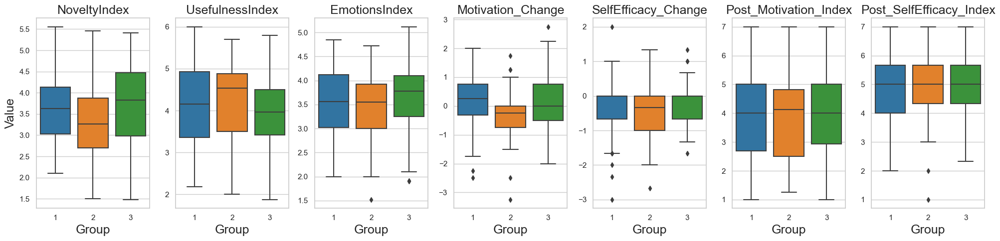

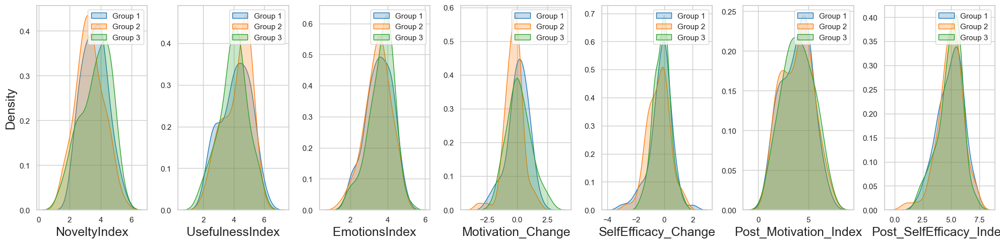

In [560]:
## Box plots and KDE plots for variance visualization ##
def visualize_variance(df, outcome_vars):
    plt.figure(figsize=(20, 5)) 
    for i, outcome_var in enumerate(outcome_vars):
        plt.subplot(1, len(outcome_vars), i + 1)  
        sns.boxplot(x='GROUP', y=outcome_var, data=df)
        plt.title(f'{outcome_var}', fontsize=18)  
        plt.xlabel('Group', fontsize=18)         
        if i == 0:  # Only the first outcome variable gets the y-label
            plt.ylabel('Value', fontsize=18)
        else: 
            plt.ylabel(None)
    plt.tight_layout()
    plt.show()

    # Create KDE plots in another row
    plt.figure(figsize=(20, 5)) 
    for i, outcome_var in enumerate(outcome_vars):
        plt.subplot(1, len(outcome_vars), i + 1) 
        sns.kdeplot(df[df['GROUP'] == 1][outcome_var], label='Group 1', fill=True)
        sns.kdeplot(df[df['GROUP'] == 2][outcome_var], label='Group 2', fill=True)
        sns.kdeplot(df[df['GROUP'] == 3][outcome_var], label='Group 3', fill=True)
        plt.xlabel(outcome_var, fontsize=18)               
        if i == 0:  # Only the first outcome variable gets the y-label
            plt.ylabel('Density', fontsize=18)
        else: 
            plt.ylabel(None)
        plt.legend()
    plt.tight_layout()
    plt.show()


visualize_variance(df, outcome_vars)

# Preliminary Tests

## Mean Comparison

In [561]:
## Group means, standard deviations, and p-values for each outcome variable ##
def compute_group_stats_and_ttest(df, outcome_vars):
    results = {}

    for outcome_var in outcome_vars:
        group_stats = df.groupby('GROUP')[outcome_var].agg(['mean', 'std']).reset_index()

        # Perform a one-sample t-test for each group against 0
        p_values = []
        for group in df['GROUP'].unique():
            group_data = df[df['GROUP'] == group][outcome_var]
            t_stat, p_value = stats.ttest_1samp(group_data, 0)  # Test if mean is significantly different from 0
            p_values.append(p_value)

        group_stats['p-value'] = p_values

        results[outcome_var] = group_stats

    return results

# Results in a formatted way
def display_group_stats(results):
    for outcome_var, stats in results.items():
        print(f"Outcome Variable: {outcome_var}")
        print(stats)
        print("\n")

outcome_vars = ['NoveltyIndex', 'UsefulnessIndex', 'EmotionsIndex', 'Motivation_Change', 'SelfEfficacy_Change']

results = compute_group_stats_and_ttest(df, outcome_vars)
display_group_stats(results)

Outcome Variable: NoveltyIndex
   GROUP      mean       std       p-value
0      1  3.610757  0.809474  6.033675e-39
1      2  3.287413  0.883522  8.123573e-39
2      3  3.666942  0.980560  3.709081e-46


Outcome Variable: UsefulnessIndex
   GROUP      mean       std       p-value
0      1  4.099530  0.988387  1.496786e-42
1      2  4.214562  0.908467  1.573166e-44
2      3  3.958746  0.920541  3.803083e-44


Outcome Variable: EmotionsIndex
   GROUP      mean       std       p-value
0      1  3.527214  0.702031  7.103687e-49
1      2  3.453472  0.700311  3.924757e-46
2      3  3.646059  0.666445  1.781122e-49


Outcome Variable: Motivation_Change
   GROUP      mean       std   p-value
0      1  0.058824  0.908211  0.277249
1      2 -0.308594  0.782677  0.002466
2      3  0.136719  0.997944  0.595043


Outcome Variable: SelfEfficacy_Change
   GROUP      mean       std   p-value
0      1 -0.254902  0.800327  0.014276
1      2 -0.406250  0.763979  0.000071
2      3 -0.182292  0.578661  0.

Two-sample t-test or Mann-Whitney U Test if normality of outcome variable is not met, to see if there is a difference between the outcome means of Group 2/3 vs Group 1

In [562]:
outcome_vars = ['NoveltyIndex', 'UsefulnessIndex', 'EmotionsIndex', 'Motivation_Change', 'SelfEfficacy_Change']

group_pairs = [(1, 2), (1, 3), (2, 3)]

# Function to check normality, variance equality, and select appropriate test
def normality_and_variance_test(df, group_pairs, outcome_vars):
    for outcome_var in outcome_vars:
        print(f"\n---- Testing {outcome_var} ----")
        for group1, group2 in group_pairs:
            data1 = df[df['GROUP'] == group1][outcome_var]
            data2 = df[df['GROUP'] == group2][outcome_var]

            # Shapiro-Wilk test for normality
            shapiro_p1 = stats.shapiro(data1)[1]
            shapiro_p2 = stats.shapiro(data2)[1]
            
            print(f"\nShapiro-Wilk p-value for {outcome_var} in Group {group1}: {shapiro_p1}")
            print(f"Shapiro-Wilk p-value for {outcome_var} in Group {group2}: {shapiro_p2}")
            
            # Levene's test for equality of variances
            levene_stat, levene_p = stats.levene(data1, data2)
            print(f"Levene’s test p-value for {outcome_var} between Group {group1} and Group {group2}: {levene_p}")

            # Determine which test to use based on normality and variance equality
            if shapiro_p1 >= 0.05 and shapiro_p2 >= 0.05:
                # Both groups are normally distributed
                if levene_p >= 0.05:
                    # Variances are equal: standard t-test
                    t_stat, t_p_value = stats.ttest_ind(data1, data2, equal_var=True)
                    print(f"T-test (equal variances) p-value for {outcome_var} between Group {group1} and Group {group2}: {t_p_value}")
                else:
                    # Variances are not equal: Welch's t-test
                    t_stat, t_p_value = stats.ttest_ind(data1, data2, equal_var=False)
                    print(f"T-test (Welch’s) p-value for {outcome_var} between Group {group1} and Group {group2}: {t_p_value}")
            else:
                # At least one group is not normally distributed: Mann-Whitney U test
                u_stat, u_p_value = stats.mannwhitneyu(data1, data2, alternative='two-sided')
                print(f"Mann-Whitney U test p-value for {outcome_var} between Group {group1} and Group {group2}: {u_p_value}")

normality_and_variance_test(df, group_pairs, outcome_vars)


---- Testing NoveltyIndex ----

Shapiro-Wilk p-value for NoveltyIndex in Group 1: 0.5600433349609375
Shapiro-Wilk p-value for NoveltyIndex in Group 2: 0.7759256362915039
Levene’s test p-value for NoveltyIndex between Group 1 and Group 2: 0.7705083306827276
T-test (equal variances) p-value for NoveltyIndex between Group 1 and Group 2: 0.030002040611261462

Shapiro-Wilk p-value for NoveltyIndex in Group 1: 0.5600433349609375
Shapiro-Wilk p-value for NoveltyIndex in Group 3: 0.026250066235661507
Levene’s test p-value for NoveltyIndex between Group 1 and Group 3: 0.12688781488773268
Mann-Whitney U test p-value for NoveltyIndex between Group 1 and Group 3: 0.4690426628402645

Shapiro-Wilk p-value for NoveltyIndex in Group 2: 0.7759256362915039
Shapiro-Wilk p-value for NoveltyIndex in Group 3: 0.026250066235661507
Levene’s test p-value for NoveltyIndex between Group 2 and Group 3: 0.25766788157387427
Mann-Whitney U test p-value for NoveltyIndex between Group 2 and Group 3: 0.014201072057401

## High- Vs. Low-Skilled

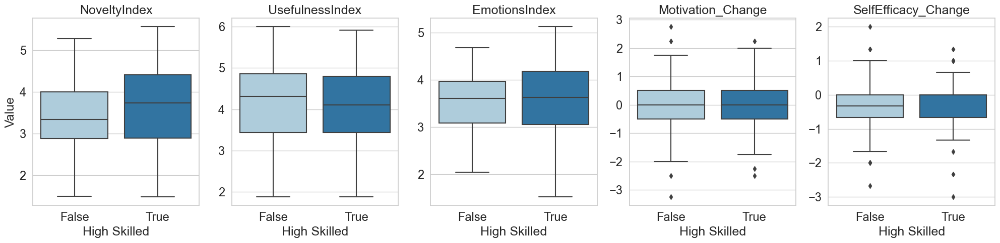

In [563]:
def visualize_skill_variance(df, outcome_vars):
    # Create box plots in one row
    plt.figure(figsize=(20, 5))
    for i, outcome_var in enumerate(outcome_vars):
        plt.subplot(1, len(outcome_vars), i + 1) 
        sns.boxplot(x='High_Skilled', y=outcome_var, data=df, palette='Paired')
        plt.title(f'{outcome_var}', fontsize=18)  
        plt.xlabel('High Skilled', fontsize=18) 
        plt.gca().tick_params(axis='x', which='both', labelsize=17)
        plt.gca().tick_params(axis='y', which='both', labelsize=17)
        if i == 0:  # Only the first outcome variable gets the y-label
            plt.ylabel('Value', fontsize=18)
        else: 
            plt.ylabel(None)
    plt.tight_layout()
    plt.show()

visualize_skill_variance(df, outcome_vars)

In [564]:
## Check normality, variance equality, and select appropriate test for High vs Low skilled participants ##
def test_high_vs_low_skill(df, outcome_vars):
    for outcome_var in outcome_vars:
        print(f"\n---- Testing {outcome_var} ----")
        
        # Split data based on High_Skilled
        high_skill_data = df[df['High_Skilled'] == True][outcome_var]
        low_skill_data = df[df['High_Skilled'] == False][outcome_var]
        
        # Calculate and print means and standard deviations
        high_skill_mean = high_skill_data.mean()
        low_skill_mean = low_skill_data.mean()
        high_skill_std = high_skill_data.std()
        low_skill_std = low_skill_data.std()
        
        print(f"Mean for High Skilled: {high_skill_mean} (Std: {high_skill_std})")
        print(f"Mean for Low Skilled: {low_skill_mean} (Std: {low_skill_std})")
        
        # Shapiro-Wilk test for normality
        shapiro_p_high = stats.shapiro(high_skill_data)[1]
        shapiro_p_low = stats.shapiro(low_skill_data)[1]
        
        print(f"\nShapiro-Wilk p-value for {outcome_var} in High Skilled: {shapiro_p_high}")
        print(f"Shapiro-Wilk p-value for {outcome_var} in Low Skilled: {shapiro_p_low}")
        
        # Levene's test for equality of variances
        levene_stat, levene_p = stats.levene(high_skill_data, low_skill_data)
        print(f"Levene’s test p-value for {outcome_var} between High and Low Skilled: {levene_p}")

        # Determine which test to use based on normality and variance equality
        if shapiro_p_high >= 0.05 and shapiro_p_low >= 0.05:
            # Both groups are normally distributed
            if levene_p >= 0.05:
                # Variances are equal: standard t-test
                t_stat, t_p_value = stats.ttest_ind(high_skill_data, low_skill_data, equal_var=True)
                print(f"T-test (equal variances) p-value for {outcome_var} between High and Low Skilled: {t_p_value}")
            else:
                # Variances are not equal: Welch's t-test
                t_stat, t_p_value = stats.ttest_ind(high_skill_data, low_skill_data, equal_var=False)
                print(f"T-test (Welch’s) p-value for {outcome_var} between High and Low Skilled: {t_p_value}")
        else:
            # At least one group is not normally distributed: Mann-Whitney U test
            u_stat, u_p_value = stats.mannwhitneyu(high_skill_data, low_skill_data, alternative='two-sided')
            print(f"Mann-Whitney U test p-value for {outcome_var} between High and Low Skilled: {u_p_value}")

# Usage
outcome_vars = ['NoveltyIndex', 'UsefulnessIndex', 'EmotionsIndex', 'Motivation_Change', 'SelfEfficacy_Change']
test_high_vs_low_skill(df, outcome_vars)


---- Testing NoveltyIndex ----
Mean for High Skilled: 3.6394114411441145 (Std: 0.9223881805888524)
Mean for Low Skilled: 3.4003118908382057 (Std: 0.8701779502703488)

Shapiro-Wilk p-value for NoveltyIndex in High Skilled: 0.3437618911266327
Shapiro-Wilk p-value for NoveltyIndex in Low Skilled: 0.4752022325992584
Levene’s test p-value for NoveltyIndex between High and Low Skilled: 0.4369291070486042
T-test (equal variances) p-value for NoveltyIndex between High and Low Skilled: 0.06382801987174297

---- Testing UsefulnessIndex ----
Mean for High Skilled: 4.083704620462045 (Std: 0.9641938736815872)
Mean for Low Skilled: 4.099005847953216 (Std: 0.9222810919813577)

Shapiro-Wilk p-value for UsefulnessIndex in High Skilled: 0.0659114271402359
Shapiro-Wilk p-value for UsefulnessIndex in Low Skilled: 0.02651885896921158
Levene’s test p-value for UsefulnessIndex between High and Low Skilled: 0.7837783216784813
Mann-Whitney U test p-value for UsefulnessIndex between High and Low Skilled: 0.909

Groupwise:

In [565]:
# Function to check normality, variance equality, and select appropriate test for High vs Low skilled participants within each group
def test_high_vs_low_skill_by_group(df, outcome_vars):
    groups = [1, 2, 3]  # Define the groups
    for group in groups:
        print(f"\n\n==== Testing within Group {group} ====\n")
        
        group_data = df[df['GROUP'] == group]  # Filter by group
        
        for outcome_var in outcome_vars:
            print(f"\n---- Testing {outcome_var} in Group {group} ----")
            
            # Split data based on High_Skilled boolean within the group
            high_skill_data = group_data[group_data['High_Skilled'] == True][outcome_var]
            low_skill_data = group_data[group_data['High_Skilled'] == False][outcome_var]
            
            # Calculate and print means and standard deviations
            high_skill_mean = high_skill_data.mean()
            low_skill_mean = low_skill_data.mean()
            high_skill_std = high_skill_data.std()
            low_skill_std = low_skill_data.std()
            
            print(f"Mean for High Skilled: {high_skill_mean} (Std: {high_skill_std})")
            print(f"Mean for Low Skilled: {low_skill_mean} (Std: {low_skill_std})")
            
            # Shapiro-Wilk test for normality
            if len(high_skill_data) > 3 and len(low_skill_data) > 3:  # Shapiro-Wilk requires more than 3 data points
                shapiro_p_high = stats.shapiro(high_skill_data)[1]
                shapiro_p_low = stats.shapiro(low_skill_data)[1]
                
                print(f"\nShapiro-Wilk p-value for {outcome_var} in High Skilled: {shapiro_p_high}")
                print(f"Shapiro-Wilk p-value for {outcome_var} in Low Skilled: {shapiro_p_low}")
            else:
                print(f"Not enough data points for Shapiro-Wilk test in Group {group}")
                continue
            
            # Levene's test for equality of variances
            levene_stat, levene_p = stats.levene(high_skill_data, low_skill_data)
            print(f"Levene’s test p-value for {outcome_var} between High and Low Skilled: {levene_p}")
    
            # Determine which test to use based on normality and variance equality
            if shapiro_p_high >= 0.05 and shapiro_p_low >= 0.05:
                # Both groups are normally distributed
                if levene_p >= 0.05:
                    # Variances are equal, use standard t-test
                    t_stat, t_p_value = stats.ttest_ind(high_skill_data, low_skill_data, equal_var=True)
                    print(f"T-test (equal variances) p-value for {outcome_var} between High and Low Skilled in Group {group}: {t_p_value}")
                else:
                    # Variances are not equal, use Welch's t-test
                    t_stat, t_p_value = stats.ttest_ind(high_skill_data, low_skill_data, equal_var=False)
                    print(f"T-test (Welch’s) p-value for {outcome_var} between High and Low Skilled in Group {group}: {t_p_value}")
            else:
                # At least one group is not normally distributed, use Mann-Whitney U test
                u_stat, u_p_value = stats.mannwhitneyu(high_skill_data, low_skill_data, alternative='two-sided')
                print(f"Mann-Whitney U test p-value for {outcome_var} between High and Low Skilled in Group {group}: {u_p_value}")

# Usage
outcome_vars = ['NoveltyIndex', 'UsefulnessIndex', 'EmotionsIndex', 'Motivation_Change', 'SelfEfficacy_Change']
test_high_vs_low_skill_by_group(df, outcome_vars)



==== Testing within Group 1 ====


---- Testing NoveltyIndex in Group 1 ----
Mean for High Skilled: 3.759912854030501 (Std: 0.8818891037959187)
Mean for Low Skilled: 3.4616013071895426 (Std: 0.7118861749001395)

Shapiro-Wilk p-value for NoveltyIndex in High Skilled: 0.5732328295707703
Shapiro-Wilk p-value for NoveltyIndex in Low Skilled: 0.8373920321464539
Levene’s test p-value for NoveltyIndex between High and Low Skilled: 0.19811697738787193
T-test (equal variances) p-value for NoveltyIndex between High and Low Skilled in Group 1: 0.129622747962443

---- Testing UsefulnessIndex in Group 1 ----
Mean for High Skilled: 4.15265522875817 (Std: 0.9082681640126786)
Mean for Low Skilled: 4.04640522875817 (Std: 1.0736180050418227)

Shapiro-Wilk p-value for UsefulnessIndex in High Skilled: 0.4173611104488373
Shapiro-Wilk p-value for UsefulnessIndex in Low Skilled: 0.10164099931716919
Levene’s test p-value for UsefulnessIndex between High and Low Skilled: 0.14557702647860513
T-test (equal var

In [566]:
## Test for equalizing effect between Group and Skill Level ##
def test_equalizing_effect(df, outcome_vars):
    for outcome_var in outcome_vars:
        print(f"\n==== Testing Equalizing Effect on {outcome_var} ====")

        data = df[['GROUP', 'High_Skilled', outcome_var]].dropna()
        data['GROUP'] = data['GROUP'].astype('category')
        data['High_Skilled'] = data['High_Skilled'].astype('category')
        
        # Descriptive statistics
        print("\nDescriptive Statistics:")
        group_means = data.groupby(['GROUP', 'High_Skilled'], observed=False)[outcome_var].mean()
        print(group_means)
        
        # Check assumptions: Normality and Homogeneity of variances
        print("\nAssumption Checks:")
        # Shapiro-Wilk test for normality
        for name, group in data.groupby(['GROUP', 'High_Skilled'], observed=False):
            stat, p = stats.shapiro(group[outcome_var])
            print(f"Shapiro-Wilk test for {name}: p-value = {p}")
        
        # Levene's test for homogeneity of variances
        lev_stat, lev_p = stats.levene(
            *[group[outcome_var].values for name, group in data.groupby(['GROUP', 'High_Skilled'], observed=False)]
        )
        print(f"\nLevene's test for homogeneity of variances: p-value = {lev_p}")
        
        # Perform two-way ANOVA with interaction
        formula = f'{outcome_var} ~ C(GROUP) * C(High_Skilled)'
        model = ols(formula, data=data).fit()
        anova_table = sm.stats.anova_lm(model, typ=2)
        print("\nANOVA Table:")
        print(anova_table)
        
        # Check for significant interaction
        interaction_p = anova_table.loc['C(GROUP):C(High_Skilled)', 'PR(>F)']
        print(f"\nInteraction p-value: {interaction_p}")
        
        if interaction_p < 0.05:
            print(f"Significant interaction effect found for {outcome_var}.")
        else:
            print(f"No significant interaction effect found for {outcome_var}.")

# Usage
outcome_vars = ['NoveltyIndex', 'UsefulnessIndex', 'EmotionsIndex', 'Motivation_Change', 'SelfEfficacy_Change']
test_equalizing_effect(df, outcome_vars)


==== Testing Equalizing Effect on NoveltyIndex ====

Descriptive Statistics:
GROUP  High_Skilled
1      False           3.461601
       True            3.759913
2      False           3.168452
       True            3.379938
3      False           3.533895
       True            3.808572
Name: NoveltyIndex, dtype: float64

Assumption Checks:
Shapiro-Wilk test for (1, False): p-value = 0.8373920321464539
Shapiro-Wilk test for (1, True): p-value = 0.5732328295707703
Shapiro-Wilk test for (2, False): p-value = 0.39620673656463623
Shapiro-Wilk test for (2, True): p-value = 0.9875766038894653
Shapiro-Wilk test for (3, False): p-value = 0.2946210205554962
Shapiro-Wilk test for (3, True): p-value = 0.05461973324418068

Levene's test for homogeneity of variances: p-value = 0.3938111637264946

ANOVA Table:
                              sum_sq     df         F    PR(>F)
C(GROUP)                    5.961191    2.0  3.769607  0.024804
C(High_Skilled)             3.358092    1.0  4.247032  0.04068

# Effect on Creative Writing

## Novelty Index

### Baseline

In [567]:
df['GROUP'] = df['GROUP'].astype('category')

In [568]:
# Base model: only treatment on the outcome
model_base_novelty = smf.ols('NoveltyIndex ~ GROUP', data=df).fit()
print(model_base_novelty.summary())
robust_model_base_novelty = model_base_novelty.get_robustcov_results(cov_type='HC3')
print(robust_model_base_novelty.summary())

                            OLS Regression Results                            
Dep. Variable:           NoveltyIndex   R-squared:                       0.034
Model:                            OLS   Adj. R-squared:                  0.024
Method:                 Least Squares   F-statistic:                     3.392
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):             0.0356
Time:                        22:45:49   Log-Likelihood:                -254.26
No. Observations:                 196   AIC:                             514.5
Df Residuals:                     193   BIC:                             524.4
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.6108      0.108     33.370      0.0

### Adding Key Covariates

Note: Covariates were tested for main effect and interaction effects in all cases

In [569]:
# Model 1: AIExperience added with interaction effects
model_nov_1 = smf.ols('NoveltyIndex ~ GROUP * AIExperience', data=df).fit()
print(model_nov_1.summary())

                            OLS Regression Results                            
Dep. Variable:           NoveltyIndex   R-squared:                       0.073
Model:                            OLS   Adj. R-squared:                  0.049
Method:                 Least Squares   F-statistic:                     2.998
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):             0.0125
Time:                        22:45:49   Log-Likelihood:                -250.20
No. Observations:                 196   AIC:                             512.4
Df Residuals:                     190   BIC:                             532.1
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

In [570]:
# Model 2: DAT
model_nov_2 = smf.ols('NoveltyIndex ~ GROUP * AIExperience + DAT_standardized', data=df).fit()
print(model_nov_2.summary())

                            OLS Regression Results                            
Dep. Variable:           NoveltyIndex   R-squared:                       0.107
Model:                            OLS   Adj. R-squared:                  0.078
Method:                 Least Squares   F-statistic:                     3.761
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):            0.00147
Time:                        22:45:49   Log-Likelihood:                -246.59
No. Observations:                 196   AIC:                             507.2
Df Residuals:                     189   BIC:                             530.1
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

In [571]:
# Model 3: AI Attitude -> not include
model_nov_3 = smf.ols('NoveltyIndex ~ GROUP * AIExperience + DAT_standardized + AIAttitude_Index_standardized', data=df).fit()
print(model_nov_3.summary())

                            OLS Regression Results                            
Dep. Variable:           NoveltyIndex   R-squared:                       0.109
Model:                            OLS   Adj. R-squared:                  0.076
Method:                 Least Squares   F-statistic:                     3.280
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):            0.00259
Time:                        22:45:49   Log-Likelihood:                -246.35
No. Observations:                 196   AIC:                             508.7
Df Residuals:                     188   BIC:                             534.9
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept     

In [572]:
# Model 4: Self Concept -> include
model_nov_4 = smf.ols('NoveltyIndex ~ GROUP * AIExperience + DAT_standardized  + CW_SelfConcept ', data=df).fit()
print(model_nov_4.summary())

                            OLS Regression Results                            
Dep. Variable:           NoveltyIndex   R-squared:                       0.125
Model:                            OLS   Adj. R-squared:                  0.093
Method:                 Least Squares   F-statistic:                     3.850
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):           0.000614
Time:                        22:45:50   Log-Likelihood:                -244.52
No. Observations:                 196   AIC:                             505.0
Df Residuals:                     188   BIC:                             531.3
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

In [573]:
# Model 5: Baseline Motivation -> Dont include because not enough explanatory power
model_nov_5 = smf.ols('NoveltyIndex ~ GROUP * AIExperience + DAT_standardized + CW_SelfConcept + Motivation_Index_standardized', data=df).fit()
print(model_nov_5.summary())

                            OLS Regression Results                            
Dep. Variable:           NoveltyIndex   R-squared:                       0.140
Model:                            OLS   Adj. R-squared:                  0.103
Method:                 Least Squares   F-statistic:                     3.809
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):           0.000361
Time:                        22:45:50   Log-Likelihood:                -242.85
No. Observations:                 196   AIC:                             503.7
Df Residuals:                     187   BIC:                             533.2
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept     

In [574]:
# Model 6: Baseline SelfEfficacy -> Don't include
model_nov_6 = smf.ols('NoveltyIndex ~ GROUP * AIExperience + DAT_standardized + CW_SelfConcept + SelfEfficacy_Index_standardized', data=df).fit()
print(model_nov_6.summary())

                            OLS Regression Results                            
Dep. Variable:           NoveltyIndex   R-squared:                       0.125
Model:                            OLS   Adj. R-squared:                  0.088
Method:                 Least Squares   F-statistic:                     3.354
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):            0.00129
Time:                        22:45:50   Log-Likelihood:                -244.51
No. Observations:                 196   AIC:                             507.0
Df Residuals:                     187   BIC:                             536.5
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept 

In [575]:
# Model 7: Creative Practice -> Dont include
model_nov_7 = smf.ols('NoveltyIndex ~ GROUP * AIExperience + DAT_standardized + CW_SelfConcept + CreativePractice', data=df).fit()
print(model_nov_7.summary())

                            OLS Regression Results                            
Dep. Variable:           NoveltyIndex   R-squared:                       0.135
Model:                            OLS   Adj. R-squared:                  0.098
Method:                 Least Squares   F-statistic:                     3.658
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):           0.000553
Time:                        22:45:50   Log-Likelihood:                -243.40
No. Observations:                 196   AIC:                             504.8
Df Residuals:                     187   BIC:                             534.3
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

In [576]:
# Model 8: Tech Comfort -> Dont include
model_nov_8 = smf.ols('NoveltyIndex ~ GROUP * AIExperience + DAT_standardized + CW_SelfConcept + TechComfort', data=df).fit()
print(model_nov_8.summary())

                            OLS Regression Results                            
Dep. Variable:           NoveltyIndex   R-squared:                       0.126
Model:                            OLS   Adj. R-squared:                  0.088
Method:                 Least Squares   F-statistic:                     3.355
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):            0.00129
Time:                        22:45:50   Log-Likelihood:                -244.50
No. Observations:                 196   AIC:                             507.0
Df Residuals:                     187   BIC:                             536.5
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

In [577]:
# Model 9: Age -> Dont include
model_nov_9 = smf.ols('NoveltyIndex ~ GROUP * AIExperience + DAT_standardized + CW_SelfConcept + Age_standardized', data=df).fit()
print(model_nov_9.summary())

                            OLS Regression Results                            
Dep. Variable:           NoveltyIndex   R-squared:                       0.141
Model:                            OLS   Adj. R-squared:                  0.104
Method:                 Least Squares   F-statistic:                     3.822
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):           0.000349
Time:                        22:45:50   Log-Likelihood:                -242.80
No. Observations:                 196   AIC:                             503.6
Df Residuals:                     187   BIC:                             533.1
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

In [578]:
# Model 10: Education -> Dont include
model_nov_10 = smf.ols('NoveltyIndex ~ GROUP * AIExperience + DAT_standardized + CW_SelfConcept + Education', data=df).fit()
print(model_nov_10.summary())

                            OLS Regression Results                            
Dep. Variable:           NoveltyIndex   R-squared:                       0.126
Model:                            OLS   Adj. R-squared:                  0.089
Method:                 Least Squares   F-statistic:                     3.380
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):            0.00120
Time:                        22:45:50   Log-Likelihood:                -244.41
No. Observations:                 196   AIC:                             506.8
Df Residuals:                     187   BIC:                             536.3
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

In [579]:
# Model 11: Language level -> Dont include
model_nov_11 = smf.ols('NoveltyIndex ~ GROUP * AIExperience + DAT_standardized + CW_SelfConcept + Lang_Level_standardized', data=df).fit()
print(model_nov_11.summary())

                            OLS Regression Results                            
Dep. Variable:           NoveltyIndex   R-squared:                       0.126
Model:                            OLS   Adj. R-squared:                  0.088
Method:                 Least Squares   F-statistic:                     3.364
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):            0.00126
Time:                        22:45:50   Log-Likelihood:                -244.47
No. Observations:                 196   AIC:                             506.9
Df Residuals:                     187   BIC:                             536.4
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

In [580]:
# Model 12: Gender -> Dont include
model_nov_12 = smf.ols('NoveltyIndex ~ GROUP * AIExperience + DAT_standardized + CW_SelfConcept + Gender_standardized', data=df).fit()
print(model_nov_12.summary())

                            OLS Regression Results                            
Dep. Variable:           NoveltyIndex   R-squared:                       0.129
Model:                            OLS   Adj. R-squared:                  0.092
Method:                 Least Squares   F-statistic:                     3.470
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):           0.000935
Time:                        22:45:50   Log-Likelihood:                -244.08
No. Observations:                 196   AIC:                             506.2
Df Residuals:                     187   BIC:                             535.7
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

### VIF

In [581]:
X = df[['GROUP', 'DAT_standardized', 'CW_SelfConcept', 'AIExperience', 'CreativePractice']]

# Add a constant term to the model for the intercept
X = sm.add_constant(X)

# Calculate the VIF for each variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display the VIF values
print(vif_data)

           Variable       VIF
0             const  6.845352
1             GROUP  1.002480
2  DAT_standardized  1.003490
3    CW_SelfConcept  1.169063
4      AIExperience  1.012270
5  CreativePractice  1.181559


-> No serious multicollinearity issues (VIF < 3)

### Full Model

In [582]:
# Full Model Novelty No Interaction
model_full_nov = smf.ols('NoveltyIndex ~ GROUP + AIExperience + DAT_standardized + CW_SelfConcept', data=df).fit()
print(model_full_nov.summary())
robust_model_full_nov = model_full_nov.get_robustcov_results(cov_type='HC3')
print(robust_model_full_nov.summary())

                            OLS Regression Results                            
Dep. Variable:           NoveltyIndex   R-squared:                       0.109
Model:                            OLS   Adj. R-squared:                  0.086
Method:                 Least Squares   F-statistic:                     4.646
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):           0.000504
Time:                        22:45:50   Log-Likelihood:                -246.34
No. Observations:                 196   AIC:                             504.7
Df Residuals:                     190   BIC:                             524.3
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            3.6038      0.105  

In [583]:
# Full Model Novelty
model_full_nov_int = smf.ols('NoveltyIndex ~ GROUP * AIExperience + DAT_standardized + CW_SelfConcept', data=df).fit()
print(model_full_nov_int.summary())
robust_model_full_nov_int = model_full_nov.get_robustcov_results(cov_type='HC3')
print(robust_model_full_nov_int.summary())

                            OLS Regression Results                            
Dep. Variable:           NoveltyIndex   R-squared:                       0.125
Model:                            OLS   Adj. R-squared:                  0.093
Method:                 Least Squares   F-statistic:                     3.850
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):           0.000614
Time:                        22:45:50   Log-Likelihood:                -244.52
No. Observations:                 196   AIC:                             505.0
Df Residuals:                     188   BIC:                             531.3
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

### Power Analysis

In [584]:
# Run the one-way ANOVA
model = ols('NoveltyIndex ~ C(GROUP)', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ=2) 
print(anova_table)

# Get
SSB = anova_table['sum_sq'][0]  # Sum of squares for GROUP
SSW = anova_table['sum_sq'][1]  # Residual sum of squares

# Calculate partial eta-squared
eta_squared = SSB / (SSB + SSW)
print(f"Partial η²: {eta_squared:.3f}")

# Eta-squared to Cohen's f
f = np.sqrt(eta_squared / (1 - eta_squared))
print(f"Cohen's f: {f:.3f}")

effect_size = f 
alpha = 0.05 
sample_size = 196  
num_groups = 3

# Conducting post-hoc power analysis for ANOVA with given effect size
power = smp.FTestAnovaPower().solve_power(effect_size=effect_size, alpha=alpha, nobs=sample_size, k_groups=num_groups)

print(power)

# Calculate required sample size per group
desired_power = 0.80  
sample_size_needed = smp.FTestAnovaPower().solve_power(effect_size=effect_size, alpha=alpha, power=desired_power, k_groups=num_groups)

print(f"Required total sample size for 80% power: {sample_size_needed:.2f}")

              sum_sq     df         F    PR(>F)
C(GROUP)    5.401736    2.0  3.392462  0.035643
Residual  153.654605  193.0       NaN       NaN
Partial η²: 0.034
Cohen's f: 0.187
0.6408086010263412
Required total sample size for 80% power: 277.08


### Visualization

In [585]:
# Get the coefficients and confidence intervals
params = model_full_nov_int.params
conf = model_full_nov_int.conf_int()
conf.columns = ['Lower CI', 'Upper CI']
coeffs = pd.concat([params, conf], axis=1)
coeffs = coeffs.reset_index()
coeffs.columns = ['Variable', 'Coefficient', 'Lower CI', 'Upper CI']

# Exclude the intercept for clarity
coeffs = coeffs[coeffs['Variable'] != 'Intercept']

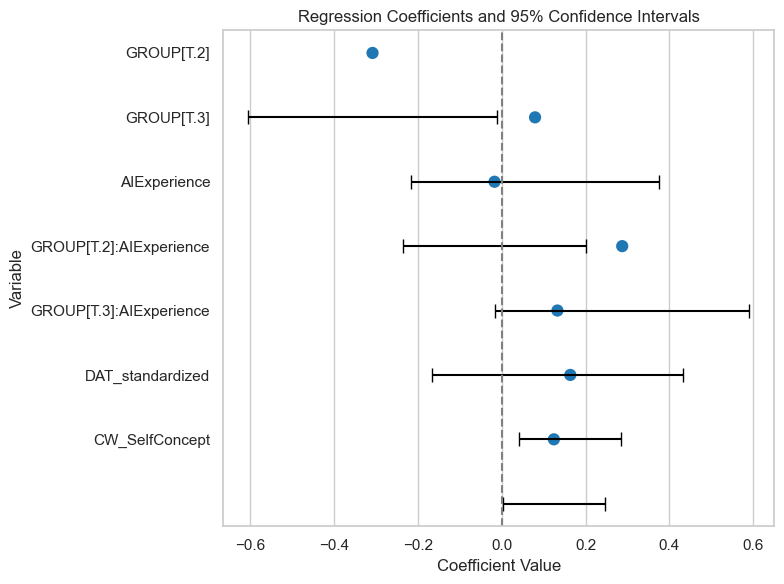

In [586]:
# Create the plot
plt.figure(figsize=(8, 6))
sns.pointplot(
    data=coeffs,
    y='Variable',
    x='Coefficient',
    join=False,
    capsize=0.1,
    errwidth=1,
    ci=None
)

# Add error bars manually
for idx, row in coeffs.iterrows():
    plt.errorbar(
        x=row['Coefficient'],
        y=idx,
        xerr=[[row['Coefficient'] - row['Lower CI']], [row['Upper CI'] - row['Coefficient']]],
        fmt='none',
        c='black',
        capsize=5
    )

# Add a vertical line at zero
plt.axvline(0, color='grey', linestyle='--')

# Add labels and title
plt.title('Regression Coefficients and 95% Confidence Intervals')
plt.xlabel('Coefficient Value')
plt.ylabel('Variable')

# Adjust y-axis labels
plt.yticks(ticks=range(len(coeffs)), labels=coeffs['Variable'])

# Show the plot
plt.tight_layout()
plt.show()


### Robustness Check

        GROUP[T.2]   GROUP[T.3]
count  1000.000000  1000.000000
mean     -0.312762     0.058271
std       0.145404     0.156492
min      -0.845438    -0.528497
25%      -0.410560    -0.039513
50%      -0.315544     0.054676
75%      -0.215148     0.162910
max       0.154171     0.536502
GROUP[T.2] 95% CI: [-0.59719809 -0.03877703]
GROUP[T.3] 95% CI: [-0.24214255  0.37600498]


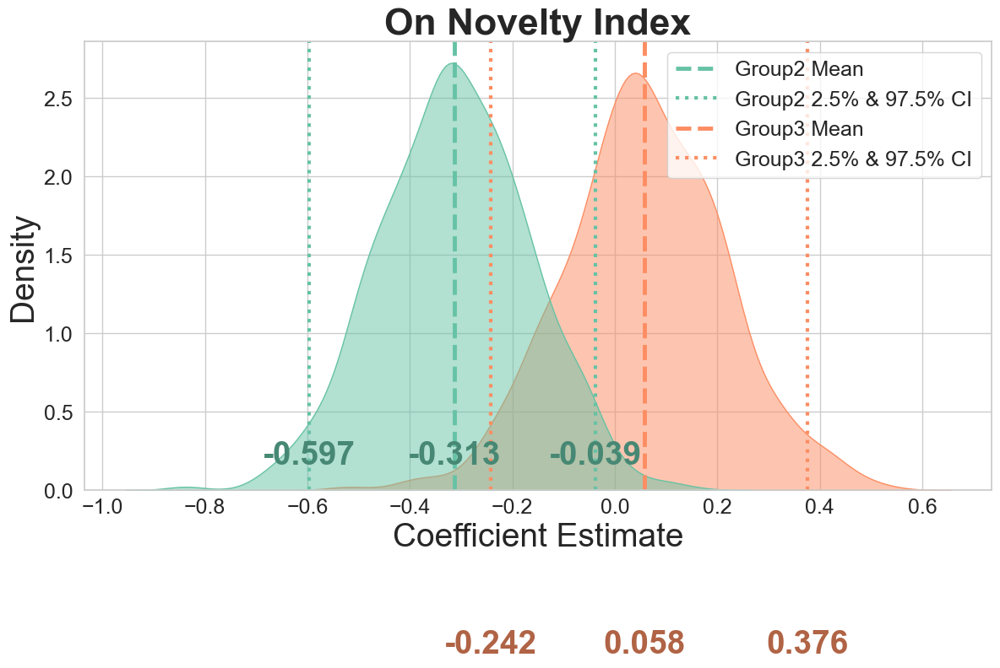

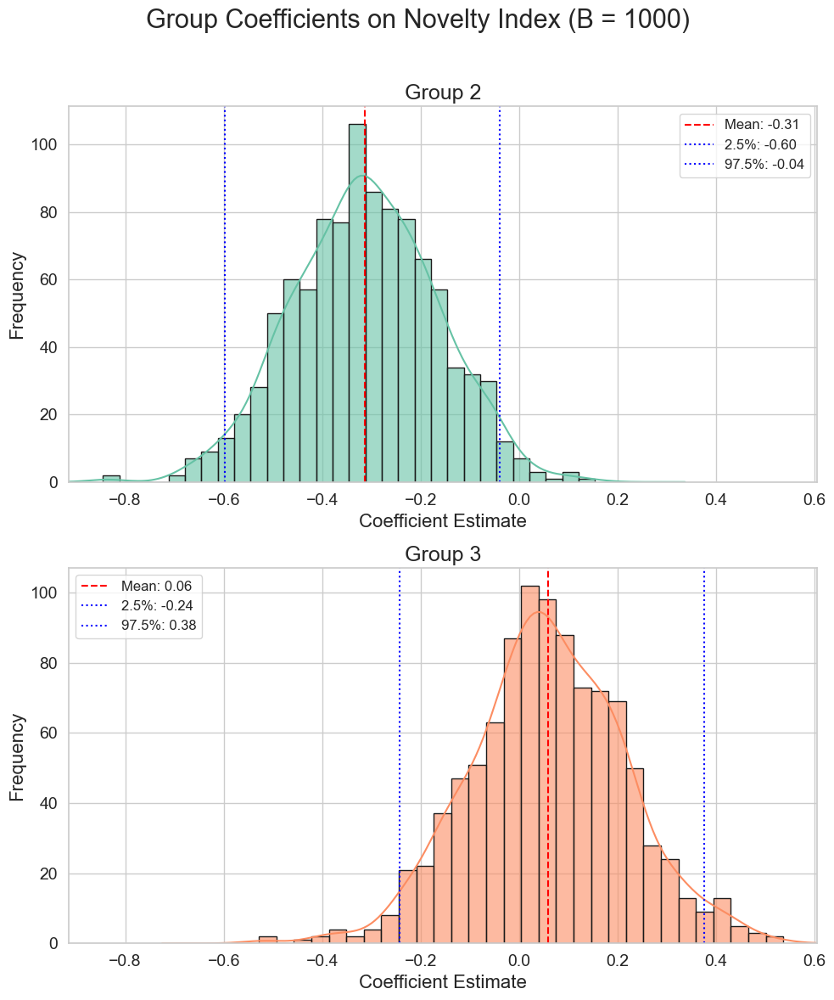

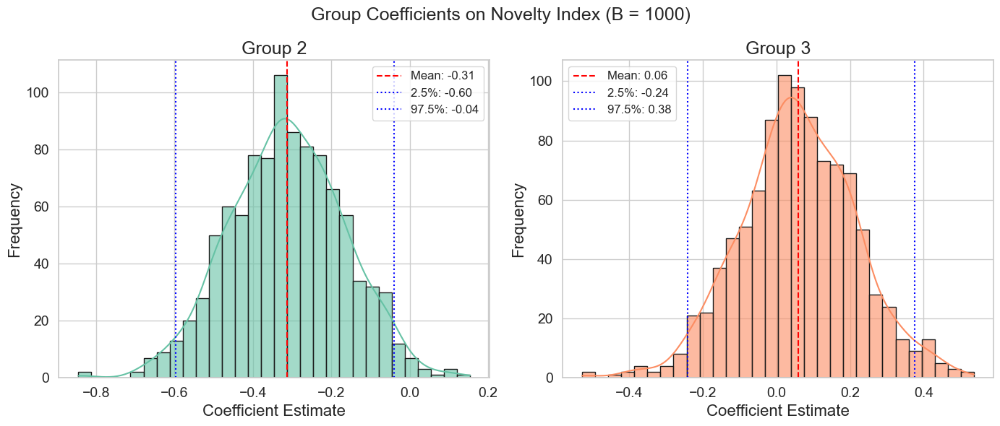

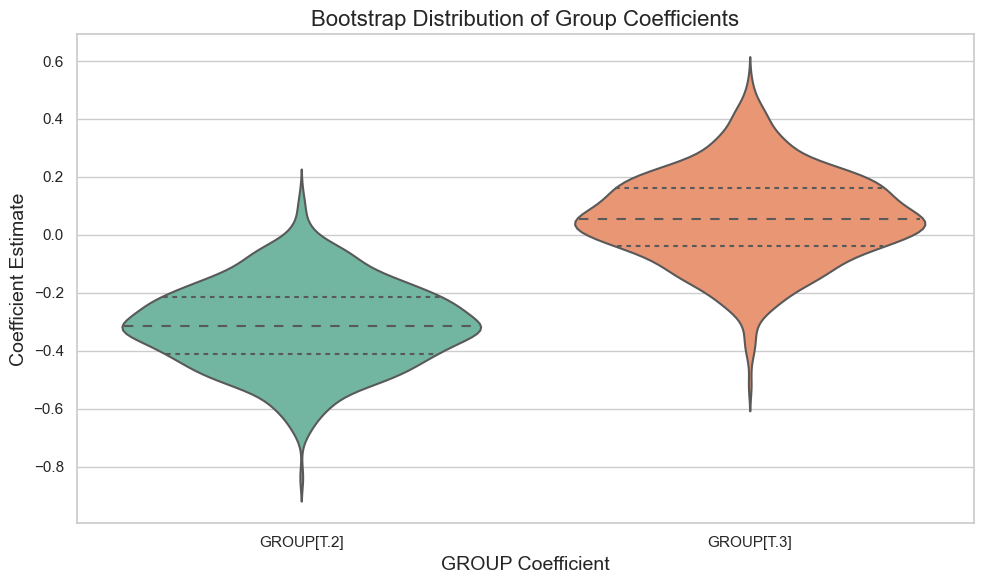

In [587]:
## Random Sampling and Visualization ##

# Set the random seed
np.random.seed(43)

# Number of bootstrap samples
n_bootstrap = 1000

df['GROUP'] = df['GROUP'].astype('category')

sample_model = smf.ols('NoveltyIndex ~ GROUP', data=df).fit()
group_params = [param for param in sample_model.params.index if param.startswith('GROUP[')]

# Initialize a dictionary to store bootstrapped coefficients
bootstrap_coefficients = {param: [] for param in group_params}

# Perform bootstrap sampling
for i in range(n_bootstrap):
    # Resample the data with replacement
    df_bootstrap = df.sample(frac=1, replace=True).reset_index(drop=True)
    
    # Fit the model on the bootstrapped sample
    model_bootstrap = smf.ols('NoveltyIndex ~ GROUP', data=df_bootstrap).fit()
    
    for param in group_params:
        if param in model_bootstrap.params:
            bootstrap_coefficients[param].append(model_bootstrap.params[param])
        else:
            bootstrap_coefficients[param].append(0)

bootstrap_results = pd.DataFrame(bootstrap_coefficients)

# Display
print(bootstrap_results.describe())

# Calculate 95% confidence intervals
ci_group2 = bootstrap_results['GROUP[T.2]'].quantile([0.025, 0.975])
ci_group3 = bootstrap_results['GROUP[T.3]'].quantile([0.025, 0.975])
print(f"GROUP[T.2] 95% CI: {ci_group2.values}")
print(f"GROUP[T.3] 95% CI: {ci_group3.values}")

# ------------------- Enhanced Plots ------------------- #

bootstrap_long = bootstrap_results.melt(var_name='GROUP_Coefficient', value_name='Coefficient_Value')

sns.set(style="whitegrid")

palette = sns.color_palette("Set2", n_colors=len(group_params))

# ------------------- Single Combined KDE Plot with Vertical Lines ------------------- #

plt.figure(figsize=(12, 8))
sns.kdeplot(
    data=bootstrap_long,
    x='Coefficient_Value',
    hue='GROUP_Coefficient',
    fill=True,
    common_norm=False,
    alpha=0.5,
    palette=palette
)

ax = plt.gca()


plt.subplots_adjust(bottom=0.25)


ax.tick_params(axis='x', pad=1) 

# Move x-axis label further down
#ax.xaxis.labelpad = 50

# Get the y-limits to position the text annotations
ymin, ymax = ax.get_ylim()

def darken_color(color, amount=0.5):
    c = mcolors.to_rgb(color)  # Convert color to RGB
    return [(1 - amount) * x for x in c]

# Add vertical lines for each GROUP coefficient
for param, color in zip(group_params, palette):
    mean = bootstrap_results[param].mean()
    ci_lower = bootstrap_results[param].quantile(0.025)
    ci_upper = bootstrap_results[param].quantile(0.975)

    # Split string at the '.' and take the second part
    number_with_bracket = param.split('.')[1]
    
    # Remove closing bracket ']' to get the number
    number = number_with_bracket.rstrip(']')
    
    # Plot mean
    plt.axvline(mean, color=color, linestyle='--', linewidth=3.5, label=f'Group{number} Mean')
    
    # Plot confidence intervals
    plt.axvline(ci_lower, color=color, linestyle=':', linewidth=3, label=f'Group{number} 2.5% & 97.5% CI')
    plt.axvline(ci_upper, color=color, linestyle=':', linewidth=3)

    # Calculate offset for each group to prevent overlap
    offset = 0.06 * (ymax - ymin) * idx

    # Position text annotations
    y_text = ymin + 0.11 * (ymax - ymin) - offset
    y_text_2 = ymin + 0.11 * (ymax - ymin)

    # Get darker shade
    darker_color = darken_color(color, amount=0.3)

    # Add text annotations
    if number == '3':
        ax.text(mean, y_text, f'{mean:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)
        ax.text(ci_lower, y_text, f'{ci_lower:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)
        ax.text(ci_upper, y_text, f'{ci_upper:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)
    else:
        ax.text(mean, y_text_2, f'{mean:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)
        ax.text(ci_lower, y_text_2, f'{ci_lower:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)
        ax.text(ci_upper, y_text_2, f'{ci_upper:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)

handles, labels = plt.gca().get_legend_handles_labels()
# Create a dictionary to remove duplicate labels
from collections import OrderedDict
by_label = OrderedDict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), fontsize=18, title_fontsize=12)

# Add titles and labels
plt.title('On Novelty Index', fontweight='bold', fontsize=32)
plt.xlabel('Coefficient Estimate', fontsize=28)
plt.ylabel('Density', fontsize=28)


plt.tick_params(axis='both', which='major', labelsize=18)

plt.tight_layout()
plt.show()

# ------------------- Separate Subplots with Vertical Lines Vertical ------------------- #

n_coefficients = len(group_params)
cols = 1  
rows = n_coefficients  

fig, axes = plt.subplots(rows, cols, figsize=(10, 6 * rows))
axes = axes.flatten()  

# Add a title
fig.suptitle('Group Coefficients on Novelty Index (B = 1000)', fontsize=22)

custom_titles = {
    'GROUP[T.2]': 'Group 2',
    'GROUP[T.3]': 'Group 3'
}

min_x = min(bootstrap_results[param].min() for param in group_params)
max_x = max(bootstrap_results[param].max() for param in group_params)

# Add a margin to avoid cutting off the distribution lines
x_margin = 0.05 * (max_x - min_x) 
min_x -= x_margin
max_x += x_margin

for idx, (param, ax) in enumerate(zip(group_params, axes)):
    sns.histplot(
        bootstrap_results[param],
        bins=30,
        kde=True,
        color=palette[idx],
        ax=ax,
        edgecolor='k',
        alpha=0.6,
        kde_kws={"cut": 5} 
    )
    
    # Calculate statistics
    mean = bootstrap_results[param].mean()
    ci_lower = bootstrap_results[param].quantile(0.025)
    ci_upper = bootstrap_results[param].quantile(0.975)
    
    # Add vertical lines
    ax.axvline(mean, color='red', linestyle='--', label=f'Mean: {mean:.2f}')
    ax.axvline(ci_lower, color='blue', linestyle=':', label=f'2.5%: {ci_lower:.2f}')
    ax.axvline(ci_upper, color='blue', linestyle=':', label=f'97.5%: {ci_upper:.2f}')
    
    # Set titles and labels
    ax.set_title(custom_titles.get(param, f'Bootstrap Distribution of {param} Coefficient'), fontsize=18)
    ax.set_xlabel('Coefficient Estimate', fontsize=16)
    ax.set_ylabel('Frequency', fontsize=16)
    
    # Add legend
    ax.legend(fontsize=12)

    ax.tick_params(axis='both', which='major', labelsize=14)

    ax.set_xlim(min_x, max_x)

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96]) 
plt.show()

# ------------------- Separate Subplots with Vertical Lines ------------------- #

n_coefficients = len(group_params)
cols = 2
rows = int(np.ceil(n_coefficients / cols))

fig, axes = plt.subplots(rows, cols, figsize=(14, 6 * rows))
axes = axes.flatten() 

fig.suptitle('Group Coefficients on Novelty Index (B = 1000)', fontsize=18)

custom_titles = {
    'GROUP[T.2]': 'Group 2',
    'GROUP[T.3]': 'Group 3'
}

for idx, (param, ax) in enumerate(zip(group_params, axes)):
    sns.histplot(
        bootstrap_results[param],
        bins=30,
        kde=True,
        color=palette[idx],
        ax=ax,
        edgecolor='k',
        alpha=0.6
    )
    
    # Calculate statistics
    mean = bootstrap_results[param].mean()
    ci_lower = bootstrap_results[param].quantile(0.025)
    ci_upper = bootstrap_results[param].quantile(0.975)
    
    # Add vertical lines
    ax.axvline(mean, color='red', linestyle='--', label=f'Mean: {mean:.2f}')
    ax.axvline(ci_lower, color='blue', linestyle=':', label=f'2.5%: {ci_lower:.2f}')
    ax.axvline(ci_upper, color='blue', linestyle=':', label=f'97.5%: {ci_upper:.2f}')
    
    # Set titles and labels
    ax.set_title(custom_titles.get(param, f'Bootstrap Distribution of {param} Coefficient'), fontsize=18)
    ax.set_xlabel('Coefficient Estimate', fontsize=16)
    ax.set_ylabel('Frequency', fontsize=16)
    
    ax.legend(fontsize=12)

    ax.tick_params(axis='both', which='major', labelsize=14)

# Remove any unused subplots
for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

# ------------------- Violin Plots ------------------- #

plt.figure(figsize=(10, 6))
sns.violinplot(
    data=bootstrap_long,
    x='GROUP_Coefficient',
    y='Coefficient_Value',
    palette='Set2',
    inner='quartile'
)
plt.title('Bootstrap Distribution of Group Coefficients', fontsize=16)
plt.xlabel('GROUP Coefficient', fontsize=14)
plt.ylabel('Coefficient Estimate', fontsize=14)
plt.tight_layout()
plt.show()

## Usefulness Index

#### Baseline Model

In [588]:
# Base model: only treatment on the outcome
model_base_use = smf.ols('UsefulnessIndex ~ GROUP', data=df).fit()
print(model_base_use.summary())
robust_model_base_use = model_base_use.get_robustcov_results(cov_type='HC3')
print(robust_model_base_use.summary())

                            OLS Regression Results                            
Dep. Variable:        UsefulnessIndex   R-squared:                       0.012
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     1.187
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):              0.307
Time:                        22:46:15   Log-Likelihood:                -264.64
No. Observations:                 196   AIC:                             535.3
Df Residuals:                     193   BIC:                             545.1
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      4.0995      0.114     35.932      0.0

### Adding Key Covariates

Note: Covariates were tested for main effect and interaction effects in all cases

In [589]:
# Model 1: AIExperience -> Dont include!
model_use_1 = smf.ols('UsefulnessIndex ~ GROUP * AIExperience', data=df).fit()
print(model_use_1.summary())

                            OLS Regression Results                            
Dep. Variable:        UsefulnessIndex   R-squared:                       0.023
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                    0.9102
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):              0.476
Time:                        22:46:15   Log-Likelihood:                -263.52
No. Observations:                 196   AIC:                             539.0
Df Residuals:                     190   BIC:                             558.7
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

In [590]:
# Model 2: DAT -> Dont include
model_use_2 = smf.ols('UsefulnessIndex ~ GROUP * DAT_standardized', data=df).fit()
print(model_use_2.summary())

                            OLS Regression Results                            
Dep. Variable:        UsefulnessIndex   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                 -0.010
Method:                 Least Squares   F-statistic:                    0.6305
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):              0.677
Time:                        22:46:15   Log-Likelihood:                -264.23
No. Observations:                 196   AIC:                             540.5
Df Residuals:                     190   BIC:                             560.1
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Intercept         

In [591]:
# Model 3: AIAttitude -> Dont include
model_use_3 = smf.ols('UsefulnessIndex ~ GROUP * AIAttitude_Index_standardized', data=df).fit()
print(model_use_3.summary())

                            OLS Regression Results                            
Dep. Variable:        UsefulnessIndex   R-squared:                       0.023
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                    0.9110
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):              0.475
Time:                        22:46:15   Log-Likelihood:                -263.52
No. Observations:                 196   AIC:                             539.0
Df Residuals:                     190   BIC:                             558.7
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------------

In [592]:
# Model 4: SelfConcept -> Include
model_use_4 = smf.ols('UsefulnessIndex ~ GROUP * CW_SelfConcept', data=df).fit()
print(model_use_4.summary())

                            OLS Regression Results                            
Dep. Variable:        UsefulnessIndex   R-squared:                       0.069
Model:                            OLS   Adj. R-squared:                  0.045
Method:                 Least Squares   F-statistic:                     2.817
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):             0.0177
Time:                        22:46:15   Log-Likelihood:                -258.84
No. Observations:                 196   AIC:                             529.7
Df Residuals:                     190   BIC:                             549.3
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------
Intercept             

In [593]:
# Model 5: Baseline Motivation -> Dont include
model_use_5 = smf.ols('UsefulnessIndex ~ GROUP * CW_SelfConcept + Motivation_Index_standardized', data=df).fit()
print(model_use_5.summary())

                            OLS Regression Results                            
Dep. Variable:        UsefulnessIndex   R-squared:                       0.070
Model:                            OLS   Adj. R-squared:                  0.040
Method:                 Least Squares   F-statistic:                     2.363
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):             0.0318
Time:                        22:46:15   Log-Likelihood:                -258.75
No. Observations:                 196   AIC:                             531.5
Df Residuals:                     189   BIC:                             554.5
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept     

In [594]:
# Model 6: Baseline SelfEfficacy 
model_use_6 = smf.ols('UsefulnessIndex ~ GROUP * CW_SelfConcept + SelfEfficacy_Index_standardized', data=df).fit()
print(model_use_6.summary())

                            OLS Regression Results                            
Dep. Variable:        UsefulnessIndex   R-squared:                       0.090
Model:                            OLS   Adj. R-squared:                  0.061
Method:                 Least Squares   F-statistic:                     3.112
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):            0.00625
Time:                        22:46:15   Log-Likelihood:                -256.61
No. Observations:                 196   AIC:                             527.2
Df Residuals:                     189   BIC:                             550.2
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept 

In [595]:
# Model 7: Creative Practice -> Dont include!
model_use_7 = smf.ols('UsefulnessIndex ~ GROUP * CW_SelfConcept + SelfEfficacy_Index_standardized + CreativePractice', data=df).fit()
print(model_use_7.summary())

                            OLS Regression Results                            
Dep. Variable:        UsefulnessIndex   R-squared:                       0.090
Model:                            OLS   Adj. R-squared:                  0.056
Method:                 Least Squares   F-statistic:                     2.664
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):             0.0119
Time:                        22:46:15   Log-Likelihood:                -256.58
No. Observations:                 196   AIC:                             529.2
Df Residuals:                     188   BIC:                             555.4
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept 

In [596]:
# Model 8: Age
model_use_8 = smf.ols('UsefulnessIndex ~ GROUP * CW_SelfConcept + SelfEfficacy_Index_standardized + Age_standardized', data=df).fit()
print(model_use_8.summary())

                            OLS Regression Results                            
Dep. Variable:        UsefulnessIndex   R-squared:                       0.132
Model:                            OLS   Adj. R-squared:                  0.099
Method:                 Least Squares   F-statistic:                     4.078
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):           0.000344
Time:                        22:46:15   Log-Likelihood:                -251.99
No. Observations:                 196   AIC:                             520.0
Df Residuals:                     188   BIC:                             546.2
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept 

In [597]:
# Model 9: TechComfort -> Dont include!
model_use_9 = smf.ols('UsefulnessIndex ~ GROUP * CW_SelfConcept + SelfEfficacy_Index_standardized + Age_standardized + TechComfort', data=df).fit()
print(model_use_9.summary())

                            OLS Regression Results                            
Dep. Variable:        UsefulnessIndex   R-squared:                       0.134
Model:                            OLS   Adj. R-squared:                  0.097
Method:                 Least Squares   F-statistic:                     3.624
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):           0.000609
Time:                        22:46:15   Log-Likelihood:                -251.72
No. Observations:                 196   AIC:                             521.4
Df Residuals:                     187   BIC:                             550.9
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept 

In [598]:
# Model 10: Education -> Dont include!
model_use_10 = smf.ols('UsefulnessIndex ~ GROUP * CW_SelfConcept + SelfEfficacy_Index_standardized + Age_standardized + Education', data=df).fit()
print(model_use_10.summary())

                            OLS Regression Results                            
Dep. Variable:        UsefulnessIndex   R-squared:                       0.139
Model:                            OLS   Adj. R-squared:                  0.102
Method:                 Least Squares   F-statistic:                     3.762
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):           0.000413
Time:                        22:46:15   Log-Likelihood:                -251.22
No. Observations:                 196   AIC:                             520.4
Df Residuals:                     187   BIC:                             549.9
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept 

In [599]:
# Model 11: Language Level -> Dont include!
model_use_11 = smf.ols('UsefulnessIndex ~ GROUP * CW_SelfConcept + SelfEfficacy_Index_standardized + Age_standardized + Lang_Level_standardized', data=df).fit()
print(model_use_11.summary())

                            OLS Regression Results                            
Dep. Variable:        UsefulnessIndex   R-squared:                       0.141
Model:                            OLS   Adj. R-squared:                  0.104
Method:                 Least Squares   F-statistic:                     3.844
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):           0.000328
Time:                        22:46:15   Log-Likelihood:                -250.92
No. Observations:                 196   AIC:                             519.8
Df Residuals:                     187   BIC:                             549.3
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept 

In [600]:
# Model 12: Gender -> Dont include
model_use_12 = smf.ols('UsefulnessIndex ~ GROUP * CW_SelfConcept + SelfEfficacy_Index_standardized + Age_standardized + Gender_standardized', data=df).fit()
print(model_use_12.summary())

                            OLS Regression Results                            
Dep. Variable:        UsefulnessIndex   R-squared:                       0.132
Model:                            OLS   Adj. R-squared:                  0.095
Method:                 Least Squares   F-statistic:                     3.563
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):           0.000722
Time:                        22:46:15   Log-Likelihood:                -251.94
No. Observations:                 196   AIC:                             521.9
Df Residuals:                     187   BIC:                             551.4
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept 

### Full Model

In [601]:
# Full Model Usefulness no interaction
model_full_use = smf.ols('UsefulnessIndex ~ GROUP + CW_SelfConcept + SelfEfficacy_Index_standardized + Age_standardized', data=df).fit()
print(model_full_use.summary())
robust_model_full_use = model_full_use.get_robustcov_results(cov_type='HC3')
print(robust_model_full_use.summary())

                            OLS Regression Results                            
Dep. Variable:        UsefulnessIndex   R-squared:                       0.092
Model:                            OLS   Adj. R-squared:                  0.068
Method:                 Least Squares   F-statistic:                     3.843
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):            0.00244
Time:                        22:46:16   Log-Likelihood:                -256.40
No. Observations:                 196   AIC:                             524.8
Df Residuals:                     190   BIC:                             544.5
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept 

In [602]:
# Full Model Usefulness
model_full_use_int = smf.ols('UsefulnessIndex ~ GROUP * CW_SelfConcept + SelfEfficacy_Index_standardized + Age_standardized', data=df).fit()
print(model_full_use_int.summary())
robust_model_full_use_int = model_full_use_int.get_robustcov_results(cov_type='HC3')
print(robust_model_full_use_int.summary())

                            OLS Regression Results                            
Dep. Variable:        UsefulnessIndex   R-squared:                       0.132
Model:                            OLS   Adj. R-squared:                  0.099
Method:                 Least Squares   F-statistic:                     4.078
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):           0.000344
Time:                        22:46:16   Log-Likelihood:                -251.99
No. Observations:                 196   AIC:                             520.0
Df Residuals:                     188   BIC:                             546.2
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept 

### VIF

In [603]:
X = df[['GROUP', 'CW_SelfConcept', 'SelfEfficacy_Index_standardized', 'Age_standardized']]

# Add a constant term to the model for the intercept
X = sm.add_constant(X)

# Calculate the VIF for each variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display the VIF values
print(vif_data)

                          Variable       VIF
0                            const  6.839568
1                            GROUP  1.002263
2                   CW_SelfConcept  1.155367
3  SelfEfficacy_Index_standardized  1.152523
4                 Age_standardized  1.004703


### Power Analysis

In [604]:
## Power Analysis ##
model = ols('UsefulnessIndex ~ C(GROUP)', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)  
print(anova_table)

# Get
SSB = anova_table['sum_sq'][0]  # Sum of squares for GROUP
SSW = anova_table['sum_sq'][1]  # Residual sum of squares

# Partial eta-squared
eta_squared = SSB / (SSB + SSW)
print(f"Partial η²: {eta_squared:.3f}")

# Eta-squared to Cohen's f
f = np.sqrt(eta_squared / (1 - eta_squared))
print(f"Cohen's f: {f:.3f}")

effect_size = f  
alpha = 0.05 
sample_size = 196  
num_groups = 3  

# Conducting post-hoc power analysis
power = smp.FTestAnovaPower().solve_power(effect_size=effect_size, alpha=alpha, nobs=sample_size, k_groups=num_groups)

print(power)

# Calculate required sample size per group
desired_power = 0.80  # Desired power level
sample_size_needed = smp.FTestAnovaPower().solve_power(effect_size=effect_size, alpha=alpha, power=desired_power, k_groups=num_groups)

print(f"Required total sample size for 80% power: {sample_size_needed:.2f}")

              sum_sq     df        F    PR(>F)
C(GROUP)    2.101501    2.0  1.18709  0.307325
Residual  170.833570  193.0      NaN       NaN
Partial η²: 0.012
Cohen's f: 0.111
0.26139098752414114
Required total sample size for 80% power: 786.22


### Robustness Check

        GROUP[T.2]   GROUP[T.3]
count  1000.000000  1000.000000
mean      0.116329    -0.143711
std       0.170283     0.167023
min      -0.475259    -0.704412
25%       0.000479    -0.253117
50%       0.114070    -0.135751
75%       0.244940    -0.032692
max       0.635953     0.446830
GROUP[T.2] 95% CI: [-0.20953646  0.42678805]
GROUP[T.3] 95% CI: [-0.47386829  0.17050693]


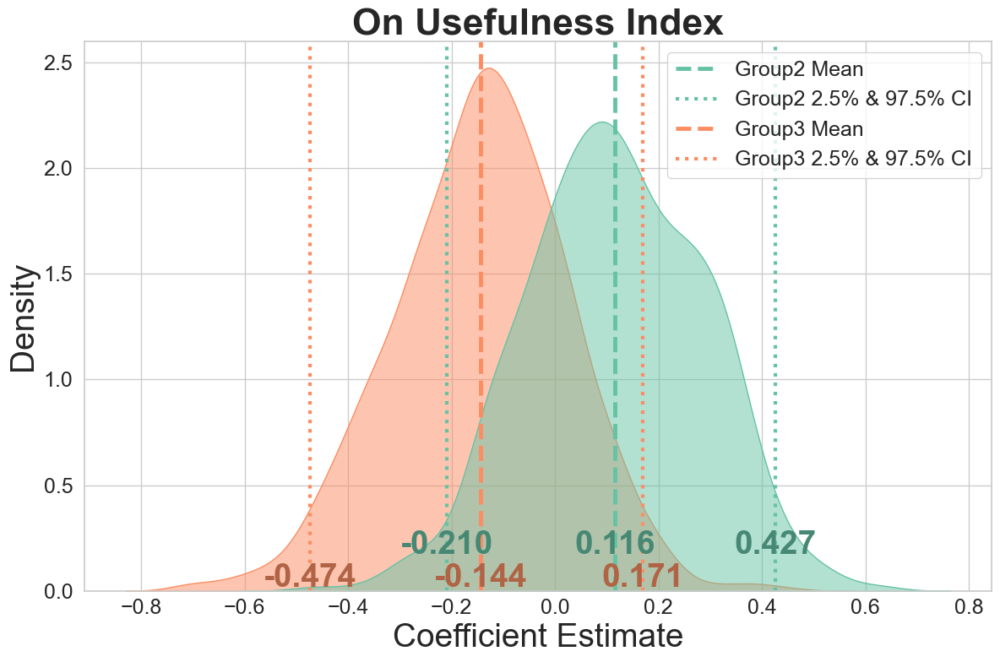

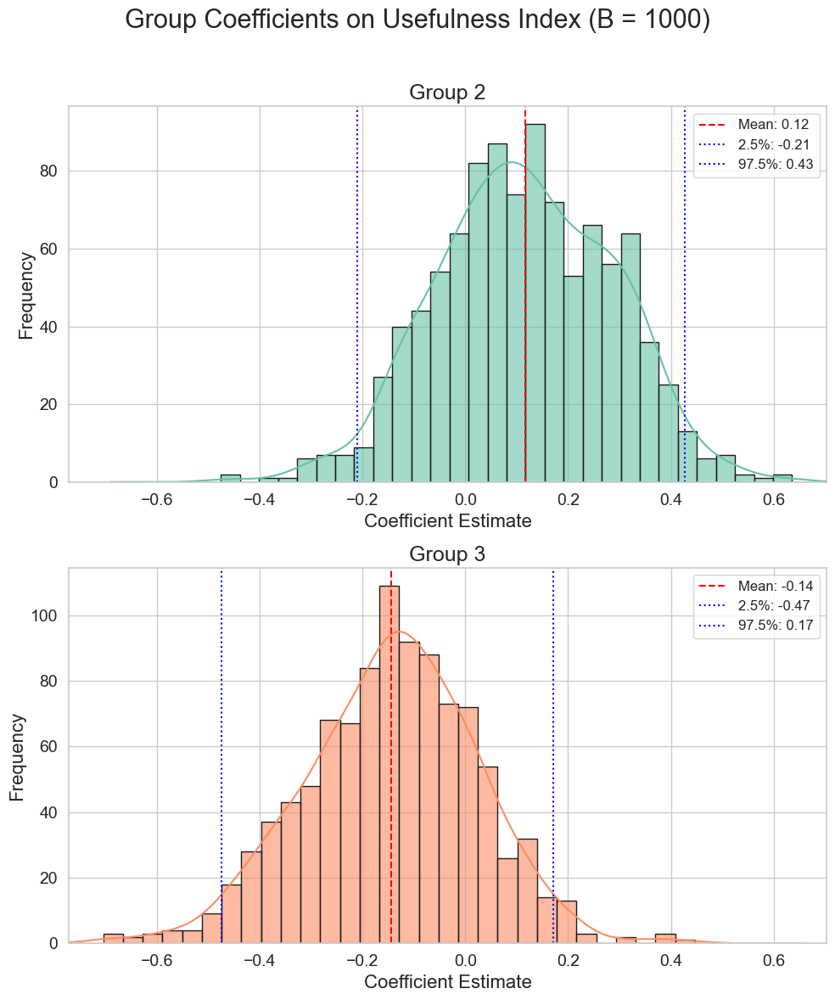

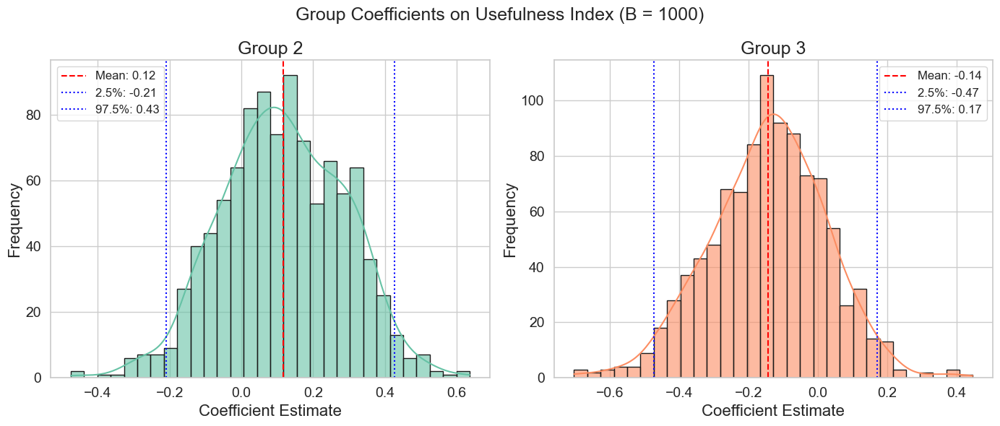

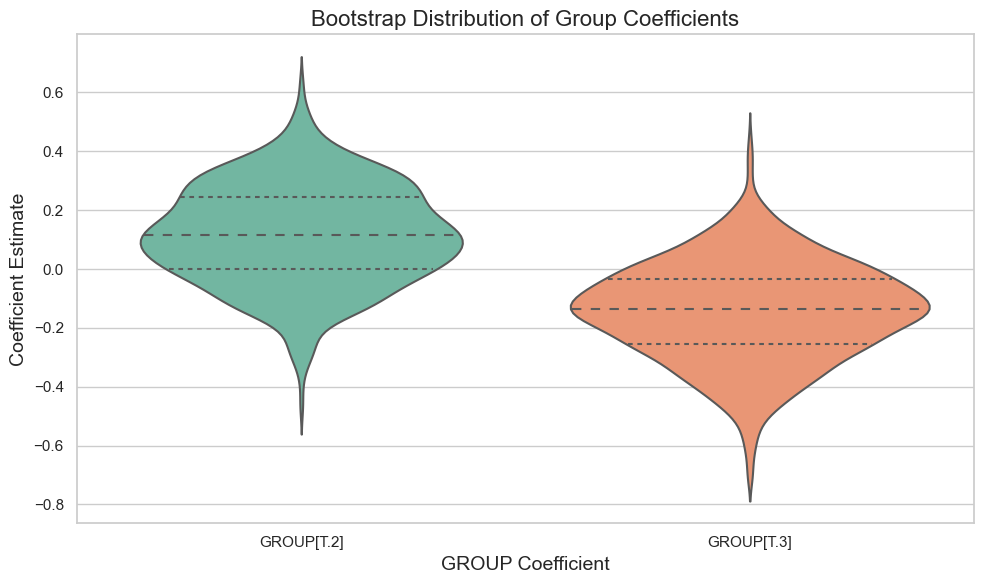

In [605]:
## Bootstrap Sampling and Visualization ##

np.random.seed(43)

# Define the number of bootstrap samples
n_bootstrap = 1000

df['GROUP'] = df['GROUP'].astype('category')

sample_model = smf.ols('UsefulnessIndex ~ GROUP', data=df).fit()
group_params = [param for param in sample_model.params.index if param.startswith('GROUP[')]

# Initialize dictionary
bootstrap_coefficients = {param: [] for param in group_params}

# Perform bootstrap sampling
for i in range(n_bootstrap):
    # Resample the data with replacement
    df_bootstrap = df.sample(frac=1, replace=True).reset_index(drop=True)
    
    # Fit the model on the bootstrapped sample
    model_bootstrap = smf.ols('UsefulnessIndex ~ GROUP', data=df_bootstrap).fit()
    
    for param in group_params:
        if param in model_bootstrap.params:
            bootstrap_coefficients[param].append(model_bootstrap.params[param])
        else:
            bootstrap_coefficients[param].append(0)

bootstrap_results = pd.DataFrame(bootstrap_coefficients)

print(bootstrap_results.describe())

# Calculate 95% confidence intervals
ci_group2 = bootstrap_results['GROUP[T.2]'].quantile([0.025, 0.975])
ci_group3 = bootstrap_results['GROUP[T.3]'].quantile([0.025, 0.975])
print(f"GROUP[T.2] 95% CI: {ci_group2.values}")
print(f"GROUP[T.3] 95% CI: {ci_group3.values}")

# ------------------- Enhanced Plots ------------------- #

bootstrap_long = bootstrap_results.melt(var_name='GROUP_Coefficient', value_name='Coefficient_Value')

sns.set(style="whitegrid")

palette = sns.color_palette("Set2", n_colors=len(group_params))

# ------------------- Single Combined KDE Plot with Vertical Lines ------------------- #

plt.figure(figsize=(12, 8))
sns.kdeplot(
    data=bootstrap_long,
    x='Coefficient_Value',
    hue='GROUP_Coefficient',
    fill=True,
    common_norm=False,
    alpha=0.5,
    palette=palette
)

ax = plt.gca()

plt.subplots_adjust(bottom=0.25)


ax.tick_params(axis='x', pad=1) 

# Move x-axis label further down
#ax.xaxis.labelpad = 50

# Get the y-limits
ymin, ymax = ax.get_ylim()

def darken_color(color, amount=0.5):
    """
    Darkens the given color by multiplying (1 - amount) with the RGB values.
    """
    c = mcolors.to_rgb(color) 
    return [(1 - amount) * x for x in c]

# Add vertical lines for each GROUP coefficient
for param, color in zip(group_params, palette):
    mean = bootstrap_results[param].mean()
    ci_lower = bootstrap_results[param].quantile(0.025)
    ci_upper = bootstrap_results[param].quantile(0.975)

    number_with_bracket = param.split('.')[1]
    
    number = number_with_bracket.rstrip(']')
    
    # Plot mean
    plt.axvline(mean, color=color, linestyle='--', linewidth=3.5, label=f'Group{number} Mean')
    
    # Plot confidence intervals
    plt.axvline(ci_lower, color=color, linestyle=':', linewidth=3, label=f'Group{number} 2.5% & 97.5% CI')
    plt.axvline(ci_upper, color=color, linestyle=':', linewidth=3)

    offset = 0.06 * (ymax - ymin) * idx

    # Position the text annotations
    y_text = ymin + 0.11 * (ymax - ymin) - offset
    y_text_2 = ymin + 0.11 * (ymax - ymin)

    darker_color = darken_color(color, amount=0.3)

    # Add text annotations
    if number == '3':
        ax.text(mean, y_text, f'{mean:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)
        ax.text(ci_lower, y_text, f'{ci_lower:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)
        ax.text(ci_upper, y_text, f'{ci_upper:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)
    else:
        ax.text(mean, y_text_2, f'{mean:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)
        ax.text(ci_lower, y_text_2, f'{ci_lower:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)
        ax.text(ci_upper, y_text_2, f'{ci_upper:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)

handles, labels = plt.gca().get_legend_handles_labels()
# Create a dictionary to remove duplicate labels
from collections import OrderedDict
by_label = OrderedDict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), fontsize=18, title_fontsize=12)

# Add titles and labels
plt.title('On Usefulness Index', fontweight='bold', fontsize=32)
plt.xlabel('Coefficient Estimate', fontsize=28)
plt.ylabel('Density', fontsize=28)


plt.tick_params(axis='both', which='major', labelsize=18)

# Adjust layout
plt.tight_layout()
plt.show()

# ------------------- Separate Subplots with Vertical Lines Vertical ------------------- #

n_coefficients = len(group_params)
cols = 1  
rows = n_coefficients  

fig, axes = plt.subplots(rows, cols, figsize=(10, 6 * rows))
axes = axes.flatten() 

fig.suptitle('Group Coefficients on Usefulness Index (B = 1000)', fontsize=22)

# Define a dictionary mapping
custom_titles = {
    'GROUP[T.2]': 'Group 2',
    'GROUP[T.3]': 'Group 3'
}

min_x = min(bootstrap_results[param].min() for param in group_params)
max_x = max(bootstrap_results[param].max() for param in group_params)

# Add a margin to avoid cutting off the distribution lines
x_margin = 0.05 * (max_x - min_x)  
min_x -= x_margin
max_x += x_margin

for idx, (param, ax) in enumerate(zip(group_params, axes)):
    sns.histplot(
        bootstrap_results[param],
        bins=30,
        kde=True,
        color=palette[idx],
        ax=ax,
        edgecolor='k',
        alpha=0.6,
        kde_kws={"cut": 5} 
    )
    
    # Calculate statistics
    mean = bootstrap_results[param].mean()
    ci_lower = bootstrap_results[param].quantile(0.025)
    ci_upper = bootstrap_results[param].quantile(0.975)
    
    # Add vertical lines
    ax.axvline(mean, color='red', linestyle='--', label=f'Mean: {mean:.2f}')
    ax.axvline(ci_lower, color='blue', linestyle=':', label=f'2.5%: {ci_lower:.2f}')
    ax.axvline(ci_upper, color='blue', linestyle=':', label=f'97.5%: {ci_upper:.2f}')
    
    # Set titles and labels
    ax.set_title(custom_titles.get(param, f'Bootstrap Distribution of {param} Coefficient'), fontsize=18)
    ax.set_xlabel('Coefficient Estimate', fontsize=16)
    ax.set_ylabel('Frequency', fontsize=16)
    
    # Add legend
    ax.legend(fontsize=12)

    ax.tick_params(axis='both', which='major', labelsize=14)

    ax.set_xlim(min_x, max_x)

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96]) 
plt.show()

# ------------------- Separate Subplots with Vertical Lines ------------------- #

n_coefficients = len(group_params)
cols = 2
rows = int(np.ceil(n_coefficients / cols))

fig, axes = plt.subplots(rows, cols, figsize=(14, 6 * rows))
axes = axes.flatten()  

# Add a title
fig.suptitle('Group Coefficients on Usefulness Index (B = 1000)', fontsize=18)

custom_titles = {
    'GROUP[T.2]': 'Group 2',
    'GROUP[T.3]': 'Group 3'
}

for idx, (param, ax) in enumerate(zip(group_params, axes)):
    sns.histplot(
        bootstrap_results[param],
        bins=30,
        kde=True,
        color=palette[idx],
        ax=ax,
        edgecolor='k',
        alpha=0.6
    )
    
    # Calculate statistics
    mean = bootstrap_results[param].mean()
    ci_lower = bootstrap_results[param].quantile(0.025)
    ci_upper = bootstrap_results[param].quantile(0.975)
    
    # Add vertical lines
    ax.axvline(mean, color='red', linestyle='--', label=f'Mean: {mean:.2f}')
    ax.axvline(ci_lower, color='blue', linestyle=':', label=f'2.5%: {ci_lower:.2f}')
    ax.axvline(ci_upper, color='blue', linestyle=':', label=f'97.5%: {ci_upper:.2f}')
    
    # Set titles and labels
    ax.set_title(custom_titles.get(param, f'Bootstrap Distribution of {param} Coefficient'), fontsize=18)
    ax.set_xlabel('Coefficient Estimate', fontsize=16)
    ax.set_ylabel('Frequency', fontsize=16)
    
    # Add legend
    ax.legend(fontsize=12)

    ax.tick_params(axis='both', which='major', labelsize=14)

for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()

# ------------------- Violin Plots ------------------- #

plt.figure(figsize=(10, 6))
sns.violinplot(
    data=bootstrap_long,
    x='GROUP_Coefficient',
    y='Coefficient_Value',
    palette='Set2',
    inner='quartile'
)
plt.title('Bootstrap Distribution of Group Coefficients', fontsize=16)
plt.xlabel('GROUP Coefficient', fontsize=14)
plt.ylabel('Coefficient Estimate', fontsize=14)
plt.tight_layout()
plt.show()

## Emotions Index

### Baseline Model

In [606]:
# Base model: only treatment on the outcome
model_base_emotions = smf.ols('EmotionsIndex ~ GROUP', data=df).fit()
print(model_base_emotions.summary())
robust_model_base_emotions = model_base_emotions.get_robustcov_results(cov_type='HC3')
print(robust_model_base_emotions.summary())

                            OLS Regression Results                            
Dep. Variable:          EmotionsIndex   R-squared:                       0.013
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     1.270
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):              0.283
Time:                        22:46:34   Log-Likelihood:                -203.89
No. Observations:                 196   AIC:                             413.8
Df Residuals:                     193   BIC:                             423.6
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.5272      0.084     42.151      0.0

### Adding Key Covariates

Note: Covariates were tested for main effect and interaction effects in all cases

In [607]:
# Model 1: AIExperience -> Dont include!
model_em_1 = smf.ols('EmotionsIndex ~ GROUP * AIExperience', data=df).fit()
print(model_em_1.summary())

                            OLS Regression Results                            
Dep. Variable:          EmotionsIndex   R-squared:                       0.048
Model:                            OLS   Adj. R-squared:                  0.023
Method:                 Least Squares   F-statistic:                     1.903
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):             0.0956
Time:                        22:46:34   Log-Likelihood:                -200.38
No. Observations:                 196   AIC:                             412.8
Df Residuals:                     190   BIC:                             432.4
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

In [608]:
# Model 2: DAT-> Dont include!
model_em_2 = smf.ols('EmotionsIndex ~ GROUP + DAT_standardized', data=df).fit()
print(model_em_2.summary())

                            OLS Regression Results                            
Dep. Variable:          EmotionsIndex   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     1.065
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):              0.365
Time:                        22:46:34   Log-Likelihood:                -203.55
No. Observations:                 196   AIC:                             415.1
Df Residuals:                     192   BIC:                             428.2
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            3.5237      0.084  

In [609]:
# Model 3: AIAttitude -> Dont include, not too complicated
model_em_3 = smf.ols('EmotionsIndex ~ GROUP + AIAttitude_Index_standardized', data=df).fit()
print(model_em_3.summary())

                            OLS Regression Results                            
Dep. Variable:          EmotionsIndex   R-squared:                       0.030
Model:                            OLS   Adj. R-squared:                  0.014
Method:                 Least Squares   F-statistic:                     1.949
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):              0.123
Time:                        22:46:35   Log-Likelihood:                -202.23
No. Observations:                 196   AIC:                             412.5
Df Residuals:                     192   BIC:                             425.6
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept     

In [610]:
# Model 4: SelfConcept
model_em_4 = smf.ols('EmotionsIndex ~ GROUP + CW_SelfConcept', data=df).fit()
print(model_em_4.summary())

                            OLS Regression Results                            
Dep. Variable:          EmotionsIndex   R-squared:                       0.026
Model:                            OLS   Adj. R-squared:                  0.011
Method:                 Least Squares   F-statistic:                     1.730
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):              0.162
Time:                        22:46:35   Log-Likelihood:                -202.55
No. Observations:                 196   AIC:                             413.1
Df Residuals:                     192   BIC:                             426.2
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          3.5313      0.083     42.

In [611]:
# Model 5: Baseline Motivation -> Dont include
model_em_5 = smf.ols('EmotionsIndex ~ GROUP + Motivation_Index_standardized', data=df).fit()
print(model_em_5.summary())

                            OLS Regression Results                            
Dep. Variable:          EmotionsIndex   R-squared:                       0.013
Model:                            OLS   Adj. R-squared:                 -0.002
Method:                 Least Squares   F-statistic:                    0.8424
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):              0.472
Time:                        22:46:35   Log-Likelihood:                -203.88
No. Observations:                 196   AIC:                             415.8
Df Residuals:                     192   BIC:                             428.9
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept     

In [612]:
# Model 6: Baseline SelfEfficacy -> Dont include
model_em_6 = smf.ols('EmotionsIndex ~ GROUP + SelfEfficacy_Index_standardized', data=df).fit()
print(model_em_6.summary())

                            OLS Regression Results                            
Dep. Variable:          EmotionsIndex   R-squared:                       0.018
Model:                            OLS   Adj. R-squared:                  0.003
Method:                 Least Squares   F-statistic:                     1.166
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):              0.324
Time:                        22:46:35   Log-Likelihood:                -203.40
No. Observations:                 196   AIC:                             414.8
Df Residuals:                     192   BIC:                             427.9
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                      coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------
Intercept 

In [613]:
# Model 7: Creative Practice -> include
model_em_7 = smf.ols('EmotionsIndex ~ GROUP + CreativePractice', data=df).fit()
print(model_em_7.summary())

                            OLS Regression Results                            
Dep. Variable:          EmotionsIndex   R-squared:                       0.028
Model:                            OLS   Adj. R-squared:                  0.013
Method:                 Least Squares   F-statistic:                     1.857
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):              0.138
Time:                        22:46:35   Log-Likelihood:                -202.36
No. Observations:                 196   AIC:                             412.7
Df Residuals:                     192   BIC:                             425.8
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            3.5310      0.083  

In [614]:
# Model 8: Age
model_em_8 = smf.ols('EmotionsIndex ~ GROUP + CreativePractice + Age_standardized', data=df).fit()
print(model_em_8.summary())

                            OLS Regression Results                            
Dep. Variable:          EmotionsIndex   R-squared:                       0.135
Model:                            OLS   Adj. R-squared:                  0.117
Method:                 Least Squares   F-statistic:                     7.482
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):           1.28e-05
Time:                        22:46:35   Log-Likelihood:                -190.90
No. Observations:                 196   AIC:                             391.8
Df Residuals:                     191   BIC:                             408.2
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            3.5274      0.079  

In [615]:
# Model 9: Tech Comfort -> Dont include
model_em_9 = smf.ols('EmotionsIndex ~ GROUP + CreativePractice + Age_standardized + TechComfort', data=df).fit()
print(model_em_9.summary())

                            OLS Regression Results                            
Dep. Variable:          EmotionsIndex   R-squared:                       0.136
Model:                            OLS   Adj. R-squared:                  0.113
Method:                 Least Squares   F-statistic:                     5.980
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):           3.67e-05
Time:                        22:46:35   Log-Likelihood:                -190.84
No. Observations:                 196   AIC:                             393.7
Df Residuals:                     190   BIC:                             413.4
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            3.5250      0.079  

In [616]:
# Model 10: Education -> Dont include
model_em_10 = smf.ols('EmotionsIndex ~ GROUP + CreativePractice + Age_standardized + Education_standardized', data=df).fit()
print(model_em_10.summary())

                            OLS Regression Results                            
Dep. Variable:          EmotionsIndex   R-squared:                       0.138
Model:                            OLS   Adj. R-squared:                  0.115
Method:                 Least Squares   F-statistic:                     6.088
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):           2.97e-05
Time:                        22:46:35   Log-Likelihood:                -190.60
No. Observations:                 196   AIC:                             393.2
Df Residuals:                     190   BIC:                             412.9
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                  3

In [617]:
# Model 11: Language Level -> Dont include
model_em_11 = smf.ols('EmotionsIndex ~ GROUP + CreativePractice + Age_standardized + Lang_Level_standardized', data=df).fit()
print(model_em_11.summary())

                            OLS Regression Results                            
Dep. Variable:          EmotionsIndex   R-squared:                       0.136
Model:                            OLS   Adj. R-squared:                  0.113
Method:                 Least Squares   F-statistic:                     5.958
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):           3.83e-05
Time:                        22:46:35   Log-Likelihood:                -190.89
No. Observations:                 196   AIC:                             393.8
Df Residuals:                     190   BIC:                             413.5
Df Model:                           5                                         
Covariance Type:            nonrobust                                         
                              coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                 

In [618]:
# Model 12: Gender -> Dont include
model_em_12 = smf.ols('EmotionsIndex ~ GROUP + AIAttitude_Index_standardized + CreativePractice + Age_standardized + Gender', data=df).fit()
print(model_em_12.summary())

                            OLS Regression Results                            
Dep. Variable:          EmotionsIndex   R-squared:                       0.141
Model:                            OLS   Adj. R-squared:                  0.114
Method:                 Least Squares   F-statistic:                     5.170
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):           6.02e-05
Time:                        22:46:35   Log-Likelihood:                -190.27
No. Observations:                 196   AIC:                             394.5
Df Residuals:                     189   BIC:                             417.5
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
                                    coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------------------
Intercept     

### Full Model

In [619]:
# Full Model Emotions
model_full_em = smf.ols('EmotionsIndex ~ GROUP + CreativePractice + Age_standardized', data=df).fit()
print(model_full_em.summary())
robust_model_full_em = model_full_em.get_robustcov_results(cov_type='HC3')
print(robust_model_full_em.summary())

                            OLS Regression Results                            
Dep. Variable:          EmotionsIndex   R-squared:                       0.135
Model:                            OLS   Adj. R-squared:                  0.117
Method:                 Least Squares   F-statistic:                     7.482
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):           1.28e-05
Time:                        22:46:35   Log-Likelihood:                -190.90
No. Observations:                 196   AIC:                             391.8
Df Residuals:                     191   BIC:                             408.2
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
Intercept            3.5274      0.079  

### VIF

In [620]:
X = df[['GROUP', 'CreativePractice', 'Age_standardized']]

# Add a constant term to the model for the intercept
X = sm.add_constant(X)

# Calculate the VIF for each variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# Display the VIF values
print(vif_data)

           Variable       VIF
0             const  6.822429
1             GROUP  1.000034
2  CreativePractice  1.059908
3  Age_standardized  1.059888


### Power Analysis

In [621]:
## Power Analysis ##
model = ols('EmotionsIndex ~ C(GROUP)', data=df).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print(anova_table)

# Get 
SSB = anova_table['sum_sq'][0]  # Sum of squares for GROUP
SSW = anova_table['sum_sq'][1]  # Residual sum of squares

# Partial eta-squared
eta_squared = SSB / (SSB + SSW)
print(f"Partial η²: {eta_squared:.3f}")

# Eta-squared to Cohen's f
f = np.sqrt(eta_squared / (1 - eta_squared))
print(f"Cohen's f: {f:.3f}")

effect_size = f 
alpha = 0.05
sample_size = 196 
num_groups = 3 

# Conducting post-hoc power 
power = smp.FTestAnovaPower().solve_power(effect_size=effect_size, alpha=alpha, nobs=sample_size, k_groups=num_groups)

print(power)

# Calculate required sample size per group
desired_power = 0.80  # Desired power level
sample_size_needed = smp.FTestAnovaPower().solve_power(effect_size=effect_size, alpha=alpha, power=desired_power, k_groups=num_groups)

print(f"Required total sample size for 80% power: {sample_size_needed:.2f}")

             sum_sq     df         F    PR(>F)
C(GROUP)   1.209454    2.0  1.269998  0.283168
Residual  91.899627  193.0       NaN       NaN
Partial η²: 0.013
Cohen's f: 0.115
0.27733852812134363
Required total sample size for 80% power: 735.09


### Robustness Check

        GROUP[T.2]   GROUP[T.3]
count  1000.000000  1000.000000
mean     -0.071985     0.114315
std       0.121642     0.122709
min      -0.454043    -0.299731
25%      -0.153460     0.034608
50%      -0.066831     0.116275
75%       0.009513     0.192058
max       0.428738     0.512784
GROUP[T.2] 95% CI: [-0.31514486  0.15778205]
GROUP[T.3] 95% CI: [-0.12393706  0.36517839]


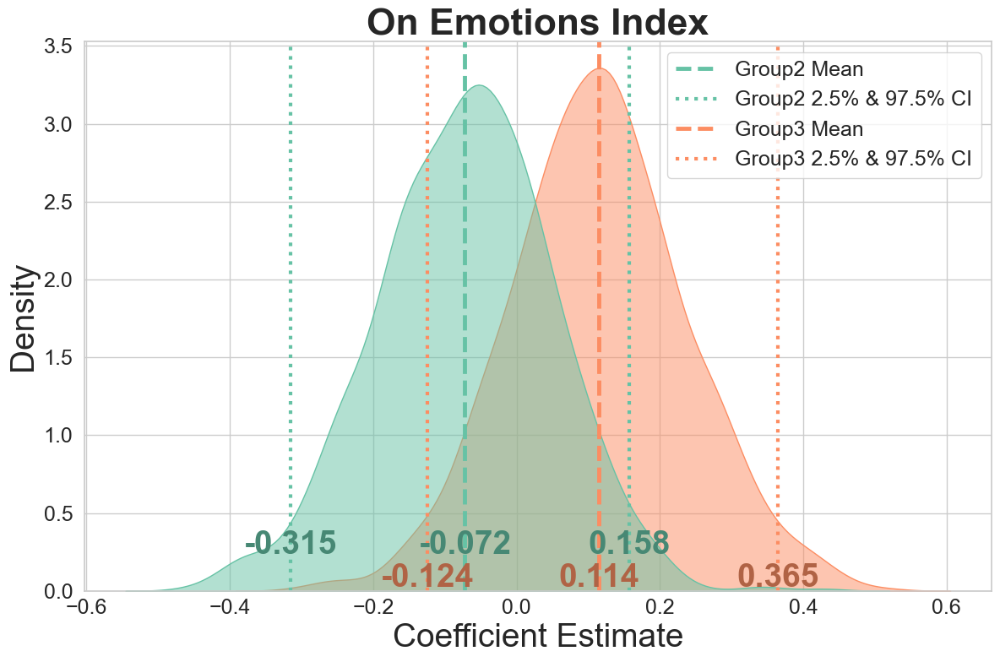

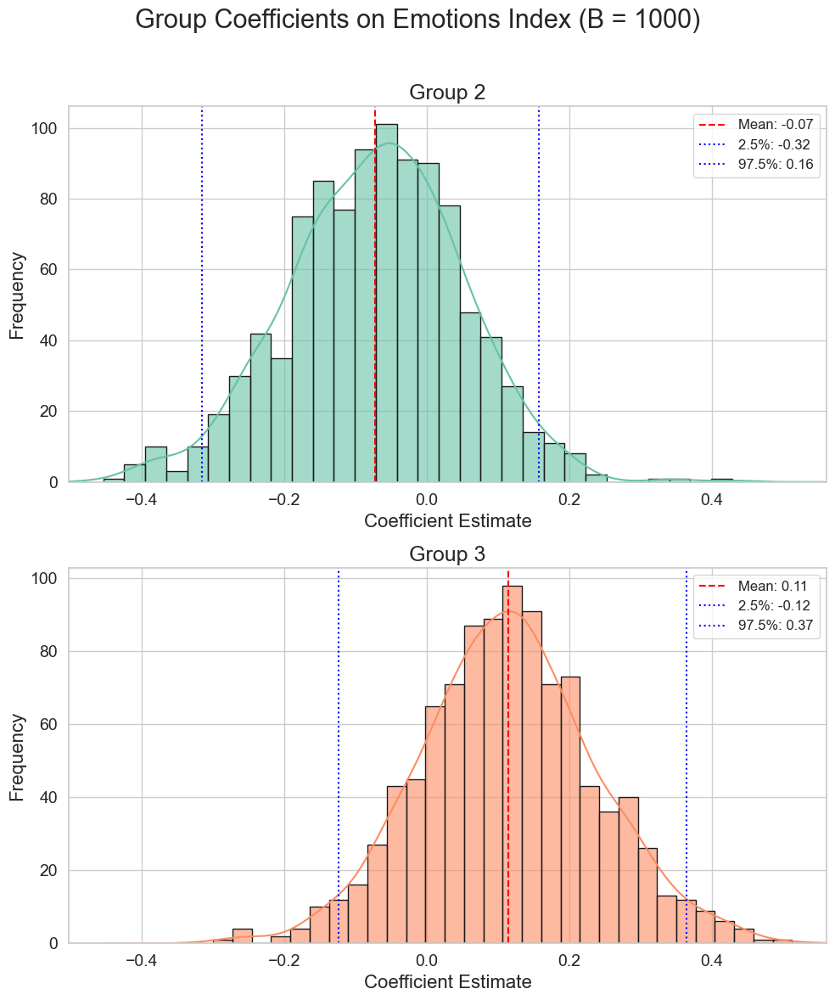

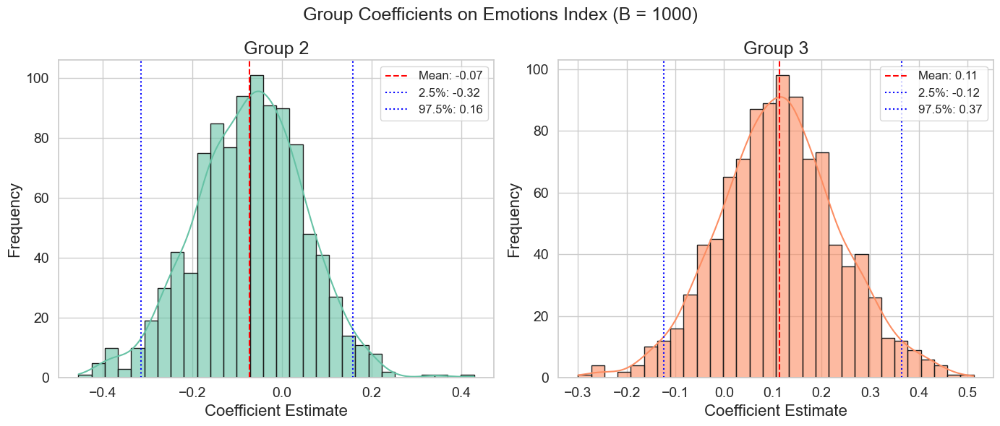

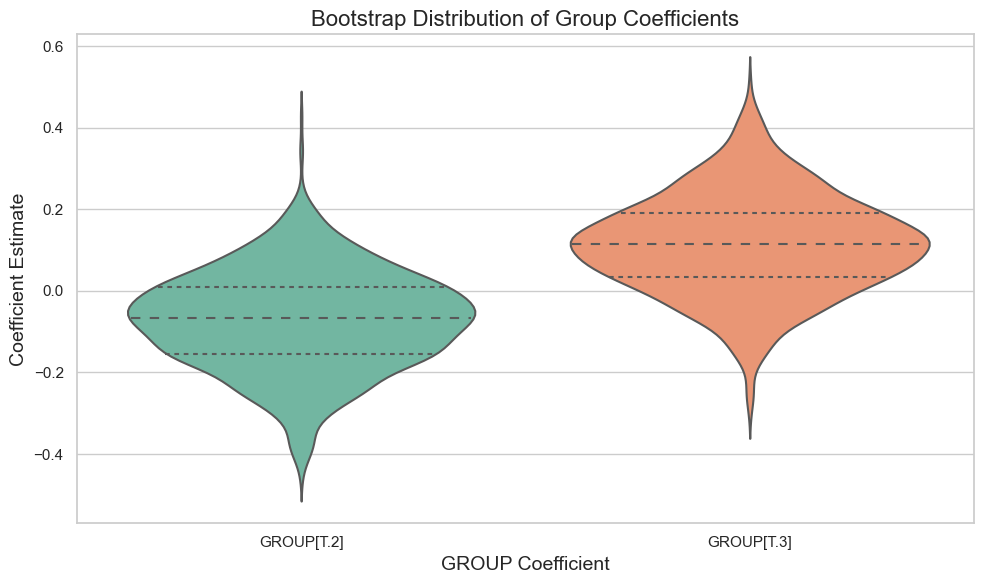

In [622]:
## Bootstrap Sampling and Visualization ##

np.random.seed(43)

# Define the number of bootstrap samples
n_bootstrap = 1000

df['GROUP'] = df['GROUP'].astype('category')

sample_model = smf.ols('EmotionsIndex ~ GROUP', data=df).fit()
group_params = [param for param in sample_model.params.index if param.startswith('GROUP[')]

bootstrap_coefficients = {param: [] for param in group_params}

# Perform bootstrap sampling
for i in range(n_bootstrap):
    # Resample the data with replacement
    df_bootstrap = df.sample(frac=1, replace=True).reset_index(drop=True)
    
    # Fit the model on the bootstrapped sample
    model_bootstrap = smf.ols('EmotionsIndex ~ GROUP', data=df_bootstrap).fit()
    
    for param in group_params:
        if param in model_bootstrap.params:
            bootstrap_coefficients[param].append(model_bootstrap.params[param])
        else:
            bootstrap_coefficients[param].append(0)

bootstrap_results = pd.DataFrame(bootstrap_coefficients)

# Display
print(bootstrap_results.describe())

# Calculate 95% confidence intervals
ci_group2 = bootstrap_results['GROUP[T.2]'].quantile([0.025, 0.975])
ci_group3 = bootstrap_results['GROUP[T.3]'].quantile([0.025, 0.975])
print(f"GROUP[T.2] 95% CI: {ci_group2.values}")
print(f"GROUP[T.3] 95% CI: {ci_group3.values}")

# ------------------- Enhanced Plots ------------------- #

bootstrap_long = bootstrap_results.melt(var_name='GROUP_Coefficient', value_name='Coefficient_Value')

sns.set(style="whitegrid")

palette = sns.color_palette("Set2", n_colors=len(group_params))

# ------------------- Single Combined KDE Plot with Vertical Lines ------------------- #

plt.figure(figsize=(12, 8))
sns.kdeplot(
    data=bootstrap_long,
    x='Coefficient_Value',
    hue='GROUP_Coefficient',
    fill=True,
    common_norm=False,
    alpha=0.5,
    palette=palette
)

ax = plt.gca()

plt.subplots_adjust(bottom=0.25)

ax.tick_params(axis='x', pad=1)

# Move x-axis label further down
#ax.xaxis.labelpad = 50

ymin, ymax = ax.get_ylim()

def darken_color(color, amount=0.5):
    c = mcolors.to_rgb(color) 
    return [(1 - amount) * x for x in c]

# Add vertical lines
for param, color in zip(group_params, palette):
    mean = bootstrap_results[param].mean()
    ci_lower = bootstrap_results[param].quantile(0.025)
    ci_upper = bootstrap_results[param].quantile(0.975)

    number_with_bracket = param.split('.')[1]
    
    number = number_with_bracket.rstrip(']')
    
    # Plot mean
    plt.axvline(mean, color=color, linestyle='--', linewidth=3.5, label=f'Group{number} Mean')
    
    # Plot confidence intervals
    plt.axvline(ci_lower, color=color, linestyle=':', linewidth=3, label=f'Group{number} 2.5% & 97.5% CI')
    plt.axvline(ci_upper, color=color, linestyle=':', linewidth=3)

    offset = 0.06 * (ymax - ymin) * idx

    # Position the text annotations
    y_text = ymin + 0.11 * (ymax - ymin) - offset
    y_text_2 = ymin + 0.11 * (ymax - ymin)

    darker_color = darken_color(color, amount=0.3)

    # Add text annotations
    if number == '3':
        ax.text(mean, y_text, f'{mean:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)
        ax.text(ci_lower, y_text, f'{ci_lower:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)
        ax.text(ci_upper, y_text, f'{ci_upper:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)
    else:
        ax.text(mean, y_text_2, f'{mean:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)
        ax.text(ci_lower, y_text_2, f'{ci_lower:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)
        ax.text(ci_upper, y_text_2, f'{ci_upper:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)

handles, labels = plt.gca().get_legend_handles_labels()
# Create a dictionary to remove duplicate labels
from collections import OrderedDict
by_label = OrderedDict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), fontsize=18, title_fontsize=12)

# Add titles and labels
plt.title('On Emotions Index', fontweight='bold', fontsize=32)
plt.xlabel('Coefficient Estimate', fontsize=28)
plt.ylabel('Density', fontsize=28)


plt.tick_params(axis='both', which='major', labelsize=18)

plt.tight_layout()
plt.show()

# ------------------- Separate Subplots with Vertical Lines Vertical ------------------- #

n_coefficients = len(group_params)
cols = 1 
rows = n_coefficients 

fig, axes = plt.subplots(rows, cols, figsize=(10, 6 * rows))
axes = axes.flatten() 

# Add a title
fig.suptitle('Group Coefficients on Emotions Index (B = 1000)', fontsize=22)

custom_titles = {
    'GROUP[T.2]': 'Group 2',
    'GROUP[T.3]': 'Group 3'
}

# Find the global x-axis limits
min_x = min(bootstrap_results[param].min() for param in group_params)
max_x = max(bootstrap_results[param].max() for param in group_params)

# Add a margin
x_margin = 0.05 * (max_x - min_x)
min_x -= x_margin
max_x += x_margin

for idx, (param, ax) in enumerate(zip(group_params, axes)):
    sns.histplot(
        bootstrap_results[param],
        bins=30,
        kde=True,
        color=palette[idx],
        ax=ax,
        edgecolor='k',
        alpha=0.6,
        kde_kws={"cut": 5} 
    )
    
    # Calculate statistics
    mean = bootstrap_results[param].mean()
    ci_lower = bootstrap_results[param].quantile(0.025)
    ci_upper = bootstrap_results[param].quantile(0.975)
    
    # Add vertical lines
    ax.axvline(mean, color='red', linestyle='--', label=f'Mean: {mean:.2f}')
    ax.axvline(ci_lower, color='blue', linestyle=':', label=f'2.5%: {ci_lower:.2f}')
    ax.axvline(ci_upper, color='blue', linestyle=':', label=f'97.5%: {ci_upper:.2f}')
    
    # Set titles and labels
    ax.set_title(custom_titles.get(param, f'Bootstrap Distribution of {param} Coefficient'), fontsize=18)
    ax.set_xlabel('Coefficient Estimate', fontsize=16)
    ax.set_ylabel('Frequency', fontsize=16)
    
    ax.legend(fontsize=12)

    ax.tick_params(axis='both', which='major', labelsize=14)

    ax.set_xlim(min_x, max_x)

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to accommodate the figure title
plt.show()

# ------------------- Separate Subplots with Vertical Lines ------------------- #

n_coefficients = len(group_params)
cols = 2
rows = int(np.ceil(n_coefficients / cols))

fig, axes = plt.subplots(rows, cols, figsize=(14, 6 * rows))
axes = axes.flatten()

fig.suptitle('Group Coefficients on Emotions Index (B = 1000)', fontsize=18)

custom_titles = {
    'GROUP[T.2]': 'Group 2',
    'GROUP[T.3]': 'Group 3'
}

for idx, (param, ax) in enumerate(zip(group_params, axes)):
    sns.histplot(
        bootstrap_results[param],
        bins=30,
        kde=True,
        color=palette[idx],
        ax=ax,
        edgecolor='k',
        alpha=0.6
    )
    
    # Calculate statistics
    mean = bootstrap_results[param].mean()
    ci_lower = bootstrap_results[param].quantile(0.025)
    ci_upper = bootstrap_results[param].quantile(0.975)
    
    # Add vertical lines
    ax.axvline(mean, color='red', linestyle='--', label=f'Mean: {mean:.2f}')
    ax.axvline(ci_lower, color='blue', linestyle=':', label=f'2.5%: {ci_lower:.2f}')
    ax.axvline(ci_upper, color='blue', linestyle=':', label=f'97.5%: {ci_upper:.2f}')

    ax.set_title(custom_titles.get(param, f'Bootstrap Distribution of {param} Coefficient'), fontsize=18)
    ax.set_xlabel('Coefficient Estimate', fontsize=16)
    ax.set_ylabel('Frequency', fontsize=16)
    

    ax.legend(fontsize=12)

    ax.tick_params(axis='both', which='major', labelsize=14)

for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()

# ------------------- Violin Plots ------------------- #

plt.figure(figsize=(10, 6))
sns.violinplot(
    data=bootstrap_long,
    x='GROUP_Coefficient',
    y='Coefficient_Value',
    palette='Set2',
    inner='quartile'
)
plt.title('Bootstrap Distribution of Group Coefficients', fontsize=16)
plt.xlabel('GROUP Coefficient', fontsize=14)
plt.ylabel('Coefficient Estimate', fontsize=14)
plt.tight_layout()
plt.show()

# ANCOVA Models on Psychological Measures

## Motivation

In [701]:
df['Pre_Motivation_Index_standardized'] = scaler.fit_transform(df[['Pre_Motivation_Index']])
df['Pre_SelfEfficacy_Index_standardized'] = scaler.fit_transform(df[['Pre_SelfEfficacy_Index']])

In [624]:
df['Post_Motivation_Index_standardized'] = scaler.fit_transform(df[['Post_Motivation_Index']])
df['Post_SelfEfficacy_Index_standardized'] = scaler.fit_transform(df[['Post_SelfEfficacy_Index']])

In [625]:
df['Pre_Motivation_Index_log'] = np.log(df['Pre_Motivation_Index'] + 1)

In [626]:
df['Post_Motivation_Index_log'] = np.log(df['Post_Motivation_Index'] + 1)

### Baseline

In [627]:
# ANCOVA baseline model Motivation
model_base_mot = smf.ols('Post_Motivation_Index ~ Pre_Motivation_Index_standardized + GROUP', data=df).fit()
# Print model summary
print(model_base_mot.summary())
robust_model_base_mot = model_base_mot.get_robustcov_results(cov_type='HC3')
print(robust_model_base_mot.summary())

                              OLS Regression Results                             
Dep. Variable:     Post_Motivation_Index   R-squared:                       0.675
Model:                               OLS   Adj. R-squared:                  0.669
Method:                    Least Squares   F-statistic:                     132.6
Date:                    Mo, 07 Okt 2024   Prob (F-statistic):           1.46e-46
Time:                           22:46:55   Log-Likelihood:                -247.79
No. Observations:                    196   AIC:                             503.6
Df Residuals:                        192   BIC:                             516.7
Df Model:                              3                                         
Covariance Type:               nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------

### Adding Key Variables

Note: Covariates were tested for main effect and interaction effects in all cases

In [628]:
# Model 1: AIExperience
model_mot_1 = smf.ols('Post_Motivation_Index ~ Pre_Motivation_Index_standardized + GROUP + AIExperience', data=df).fit()
# Print model summary
print(model_mot_1.summary())

                              OLS Regression Results                             
Dep. Variable:     Post_Motivation_Index   R-squared:                       0.675
Model:                               OLS   Adj. R-squared:                  0.668
Method:                    Least Squares   F-statistic:                     98.96
Date:                    Mo, 07 Okt 2024   Prob (F-statistic):           1.82e-45
Time:                           22:46:55   Log-Likelihood:                -247.79
No. Observations:                    196   AIC:                             505.6
Df Residuals:                        191   BIC:                             522.0
Df Model:                              4                                         
Covariance Type:               nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------

In [629]:
# Model 2: AIAttitude -> significant effect on model
model_mot_2 = smf.ols('Post_Motivation_Index ~ Pre_Motivation_Index_standardized + GROUP * AIAttitude_Index_standardized', data=df).fit()
# Print model summary
print(model_mot_2.summary())

                              OLS Regression Results                             
Dep. Variable:     Post_Motivation_Index   R-squared:                       0.682
Model:                               OLS   Adj. R-squared:                  0.672
Method:                    Least Squares   F-statistic:                     67.64
Date:                    Mo, 07 Okt 2024   Prob (F-statistic):           1.90e-44
Time:                           22:46:55   Log-Likelihood:                -245.43
No. Observations:                    196   AIC:                             504.9
Df Residuals:                        189   BIC:                             527.8
Df Model:                              6                                         
Covariance Type:               nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------

In [630]:
# Model 3: DAT -> dont include to not overcomplicate
model_mot_3 = smf.ols('Post_Motivation_Index ~ Pre_Motivation_Index_standardized + GROUP * AIAttitude_Index_standardized + DAT_standardized', data=df).fit()
# Print model summary
print(model_mot_3.summary())

                              OLS Regression Results                             
Dep. Variable:     Post_Motivation_Index   R-squared:                       0.684
Model:                               OLS   Adj. R-squared:                  0.673
Method:                    Least Squares   F-statistic:                     58.21
Date:                    Mo, 07 Okt 2024   Prob (F-statistic):           9.08e-44
Time:                           22:46:55   Log-Likelihood:                -244.80
No. Observations:                    196   AIC:                             505.6
Df Residuals:                        188   BIC:                             531.8
Df Model:                              7                                         
Covariance Type:               nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------

In [631]:
# Model 4: Self Concept
model_mot_4 = smf.ols('Post_Motivation_Index ~ Pre_Motivation_Index_standardized + GROUP * AIAttitude_Index_standardized + CW_SelfConcept', data=df).fit()
# Print model summary
print(model_mot_4.summary())

                              OLS Regression Results                             
Dep. Variable:     Post_Motivation_Index   R-squared:                       0.682
Model:                               OLS   Adj. R-squared:                  0.670
Method:                    Least Squares   F-statistic:                     57.68
Date:                    Mo, 07 Okt 2024   Prob (F-statistic):           1.62e-43
Time:                           22:46:55   Log-Likelihood:                -245.42
No. Observations:                    196   AIC:                             506.8
Df Residuals:                        188   BIC:                             533.1
Df Model:                              7                                         
Covariance Type:               nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------

In [632]:
# Model 5: Creative Practice -> dont include
model_mot_5 = smf.ols('Post_Motivation_Index ~ Pre_Motivation_Index_standardized + GROUP * AIAttitude_Index_standardized + CreativePractice', data=df).fit()
# Print model summary
print(model_mot_5.summary())

                              OLS Regression Results                             
Dep. Variable:     Post_Motivation_Index   R-squared:                       0.683
Model:                               OLS   Adj. R-squared:                  0.671
Method:                    Least Squares   F-statistic:                     57.77
Date:                    Mo, 07 Okt 2024   Prob (F-statistic):           1.47e-43
Time:                           22:46:55   Log-Likelihood:                -245.31
No. Observations:                    196   AIC:                             506.6
Df Residuals:                        188   BIC:                             532.8
Df Model:                              7                                         
Covariance Type:               nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------

In [633]:
# Model 6: Age -> Drop AIAttitude because not significant (closely related to age)
model_mot_6 = smf.ols('Post_Motivation_Index ~ Pre_Motivation_Index_standardized + GROUP * AIAttitude_Index_standardized + GROUP * Age_standardized', data=df).fit()
# Print model summary
print(model_mot_6.summary())

                              OLS Regression Results                             
Dep. Variable:     Post_Motivation_Index   R-squared:                       0.701
Model:                               OLS   Adj. R-squared:                  0.687
Method:                    Least Squares   F-statistic:                     48.47
Date:                    Mo, 07 Okt 2024   Prob (F-statistic):           3.56e-44
Time:                           22:46:55   Log-Likelihood:                -239.44
No. Observations:                    196   AIC:                             498.9
Df Residuals:                        186   BIC:                             531.7
Df Model:                              9                                         
Covariance Type:               nonrobust                                         
                                               coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------

In [634]:
# Model 7: TechComfort
model_mot_6 = smf.ols('Post_Motivation_Index ~ Pre_Motivation_Index_standardized + GROUP * Age_standardized + TechComfort', data=df).fit()
# Print model summary
print(model_mot_6.summary())

                              OLS Regression Results                             
Dep. Variable:     Post_Motivation_Index   R-squared:                       0.692
Model:                               OLS   Adj. R-squared:                  0.681
Method:                    Least Squares   F-statistic:                     60.44
Date:                    Mo, 07 Okt 2024   Prob (F-statistic):           8.20e-45
Time:                           22:46:55   Log-Likelihood:                -242.27
No. Observations:                    196   AIC:                             500.5
Df Residuals:                        188   BIC:                             526.8
Df Model:                              7                                         
Covariance Type:               nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------

In [635]:
# Model 8: Education -> Dont include
model_mot_8 = smf.ols('Post_Motivation_Index ~ Pre_Motivation_Index_standardized + GROUP * Age_standardized + Education_standardized', data=df).fit()
# Print model summary
print(model_mot_8.summary())

                              OLS Regression Results                             
Dep. Variable:     Post_Motivation_Index   R-squared:                       0.692
Model:                               OLS   Adj. R-squared:                  0.681
Method:                    Least Squares   F-statistic:                     60.41
Date:                    Mo, 07 Okt 2024   Prob (F-statistic):           8.50e-45
Time:                           22:46:55   Log-Likelihood:                -242.31
No. Observations:                    196   AIC:                             500.6
Df Residuals:                        188   BIC:                             526.8
Df Model:                              7                                         
Covariance Type:               nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------

In [636]:
# Model 9: Self Efficacy -> Dont include
model_mot_9 = smf.ols('Post_Motivation_Index ~ Pre_Motivation_Index_standardized + GROUP * Age_standardized + Pre_SelfEfficacy_Index_standardized', data=df).fit()
# Print model summary
print(model_mot_9.summary())

                              OLS Regression Results                             
Dep. Variable:     Post_Motivation_Index   R-squared:                       0.692
Model:                               OLS   Adj. R-squared:                  0.680
Method:                    Least Squares   F-statistic:                     60.24
Date:                    Mo, 07 Okt 2024   Prob (F-statistic):           1.02e-44
Time:                           22:46:56   Log-Likelihood:                -242.49
No. Observations:                    196   AIC:                             501.0
Df Residuals:                        188   BIC:                             527.2
Df Model:                              7                                         
Covariance Type:               nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------

In [637]:
# Model 10: Lang Level -> Dont include
model_mot_10 = smf.ols('Post_Motivation_Index ~ Pre_Motivation_Index_standardized + GROUP * Age_standardized + Lang_Level_standardized', data=df).fit()
# Print model summary
print(model_mot_10.summary())

                              OLS Regression Results                             
Dep. Variable:     Post_Motivation_Index   R-squared:                       0.692
Model:                               OLS   Adj. R-squared:                  0.681
Method:                    Least Squares   F-statistic:                     60.48
Date:                    Mo, 07 Okt 2024   Prob (F-statistic):           7.91e-45
Time:                           22:46:56   Log-Likelihood:                -242.23
No. Observations:                    196   AIC:                             500.5
Df Residuals:                        188   BIC:                             526.7
Df Model:                              7                                         
Covariance Type:               nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------

In [638]:
# Model 11: Gender -> Dont include
model_mot_11 = smf.ols('Post_Motivation_Index ~ Pre_Motivation_Index_standardized + GROUP * Age_standardized + Gender', data=df).fit()
# Print model summary
print(model_mot_11.summary())

                              OLS Regression Results                             
Dep. Variable:     Post_Motivation_Index   R-squared:                       0.704
Model:                               OLS   Adj. R-squared:                  0.693
Method:                    Least Squares   F-statistic:                     63.85
Date:                    Mo, 07 Okt 2024   Prob (F-statistic):           2.33e-46
Time:                           22:46:56   Log-Likelihood:                -238.51
No. Observations:                    196   AIC:                             493.0
Df Residuals:                        188   BIC:                             519.2
Df Model:                              7                                         
Covariance Type:               nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------

### Full Model

In [639]:
# Full ANCOVA Model Motivation
model_full_mot = smf.ols('Post_Motivation_Index ~ Pre_Motivation_Index_standardized + GROUP * Age_standardized', data=df).fit()
# Print model summary
print(model_full_mot.summary())
robust_model_full_mot = model_full_mot.get_robustcov_results(cov_type='HC3')
print(robust_model_full_mot.summary())

                              OLS Regression Results                             
Dep. Variable:     Post_Motivation_Index   R-squared:                       0.692
Model:                               OLS   Adj. R-squared:                  0.682
Method:                    Least Squares   F-statistic:                     70.65
Date:                    Mo, 07 Okt 2024   Prob (F-statistic):           1.16e-45
Time:                           22:46:56   Log-Likelihood:                -242.49
No. Observations:                    196   AIC:                             499.0
Df Residuals:                        189   BIC:                             521.9
Df Model:                              6                                         
Covariance Type:               nonrobust                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------

### VIF and Visuals

In [640]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
variables = df[['Pre_Motivation_Index_standardized', 'Age_standardized', 'GROUP']]
vif_data = pd.DataFrame()
vif_data["VIF"] = [variance_inflation_factor(variables.values, i) for i in range(variables.shape[1])]
vif_data["feature"] = variables.columns
print(vif_data)

        VIF                            feature
0  1.005214  Pre_Motivation_Index_standardized
1  1.005207                   Age_standardized
2  1.000118                              GROUP


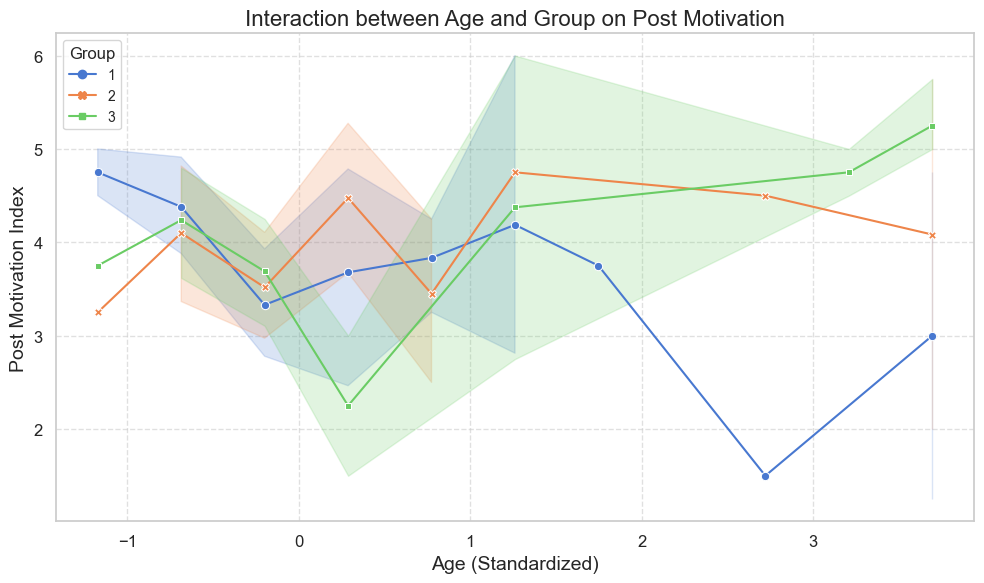

In [641]:
# Interaction plot ##
def plot_interaction(df, x, group, y, xlabel, ylabel, title):
    plt.figure(figsize=(10, 6))

    # Create interaction plot with seaborn for better aesthetics
    sns.lineplot(
        x=x, y=y, hue=group, style=group, markers=True, dashes=False, data=df, palette="muted"
    )

    # Add plot details for aesthetics
    plt.title(title, fontsize=16)
    plt.xlabel(xlabel, fontsize=14)
    plt.ylabel(ylabel, fontsize=14)
    plt.legend(title="Group", title_fontsize=12, fontsize=10)
    
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()

plot_interaction(
    df=df,
    x='Age_standardized',
    group='GROUP',
    y='Post_Motivation_Index',
    xlabel='Age (Standardized)',
    ylabel='Post Motivation Index',
    title='Interaction between Age and Group on Post Motivation'
)

plt.show()


### Power Analysis

In [642]:
# Fit the full model
model_full = smf.ols('Post_Motivation_Index ~ Pre_Motivation_Index_standardized + C(GROUP)', data=df).fit()
anova_table_full = sm.stats.anova_lm(model_full, typ=2)
print("ANOVA table for full model:")
print(anova_table_full)

# Fit the reduced model (excluding GROUP)
model_reduced = smf.ols('Post_Motivation_Index ~ Pre_Motivation_Index_standardized', data=df).fit()
anova_table_reduced = sm.stats.anova_lm(model_reduced, typ=2) 
print("ANOVA table for reduced model:")
print(anova_table_reduced)

# Get R-squared values from both models
R2_full = model_full.rsquared
R2_reduced = model_reduced.rsquared
print(f"R2 full model: {R2_full}")
print(f"R2 reduced model: {R2_reduced}")

# Partial R-squared
partial_R2_GROUP = (R2_full - R2_reduced) / (1 - R2_reduced)
print(f"R2 partial: {partial_R2_GROUP}")

# Partial eta-squared
partial_eta_squared = (R2_full - R2_reduced) / (1 - R2_reduced)
print(f"Partial η²: {partial_eta_squared}")

# Compute Cohen's f
f = np.sqrt(partial_eta_squared / (1 - partial_eta_squared))
print(f"Cohen's f: {f}")

# Degrees of freedom
df_num = model_full.df_model - model_reduced.df_model
print(f"Degrees of freedom: {df_num}")
df_denom = model_full.df_resid 
print(f"Degrees of freedom in full model: {df_denom}")

# Number of groups
k_groups = df['GROUP'].nunique()
print(f"K Groups: {k_groups}")

# Total sample size
nobs = int(model_full.nobs)

# Significance level
alpha = 0.05

# Initialize the power analysis object
power_analysis = FTestAnovaPower()

# Calculate the post-hoc power
power = power_analysis.power(effect_size=f, k_groups=k_groups, nobs=nobs, alpha=alpha)

print(f"Post-hoc power for the GROUP variable: {power:.4f}")

# Calculate required sample size per group
desired_power = 0.80  # Desired power level
sample_size_needed = smp.FTestAnovaPower().solve_power(effect_size=f, alpha=alpha, power=desired_power, k_groups=k_groups)

print(f"Required total sample size for 80% power: {sample_size_needed:.2f}")

ANOVA table for full model:
                                       sum_sq     df           F        PR(>F)
C(GROUP)                             5.163634    2.0    3.446072  3.385521e-02
Pre_Motivation_Index_standardized  297.343141    1.0  396.877776  1.314722e-48
Residual                           143.847518  192.0         NaN           NaN
ANOVA table for reduced model:
                                       sum_sq     df           F        PR(>F)
Pre_Motivation_Index_standardized  292.921245    1.0  381.358849  1.117806e-47
Residual                           149.011153  194.0         NaN           NaN
R2 full model: 0.6745033427631701
R2 reduced model: 0.6628191249863256
R2 partial: 0.03465267054773118
Partial η²: 0.03465267054773118
Cohen's f: 0.18946393591567262
Degrees of freedom: 2.0
Degrees of freedom in full model: 192.0
K Groups: 3
Post-hoc power for the GROUP variable: 0.6506
Required total sample size for 80% power: 271.42


### Bootstrap Sampling

        GROUP[T.2]   GROUP[T.3]
count  1000.000000  1000.000000
mean     -0.297088     0.084289
std       0.142821     0.151336
min      -0.825073    -0.437516
25%      -0.398153    -0.015998
50%      -0.299885     0.081467
75%      -0.202037     0.186984
max       0.163275     0.547165
GROUP[T.2] 95% CI: [-0.56318545 -0.02344801]
GROUP[T.3] 95% CI: [-0.22601212  0.37859941]


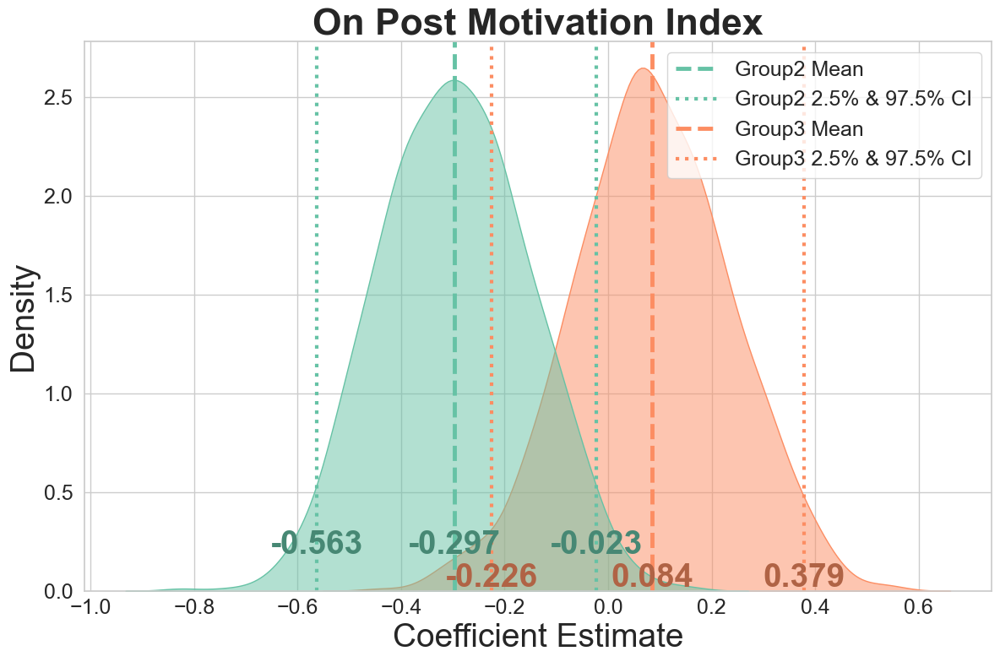

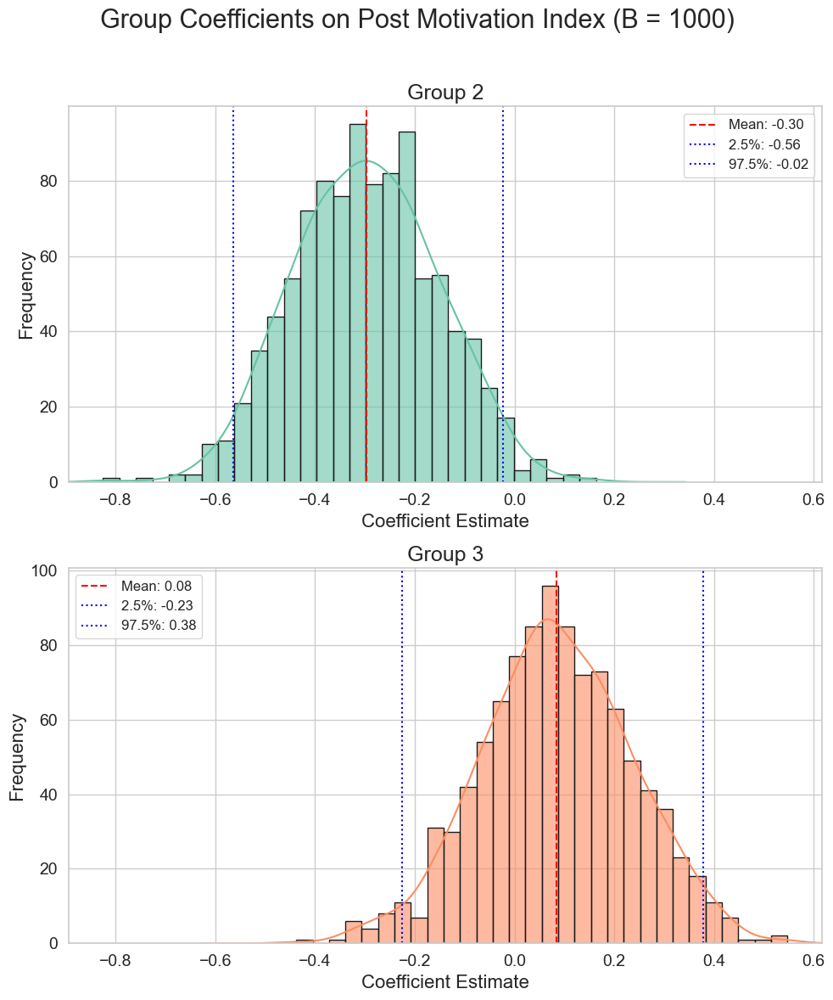

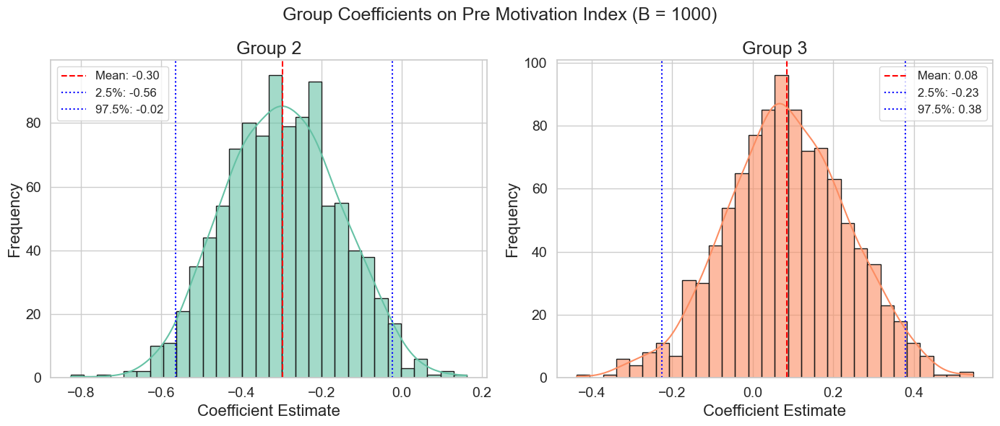

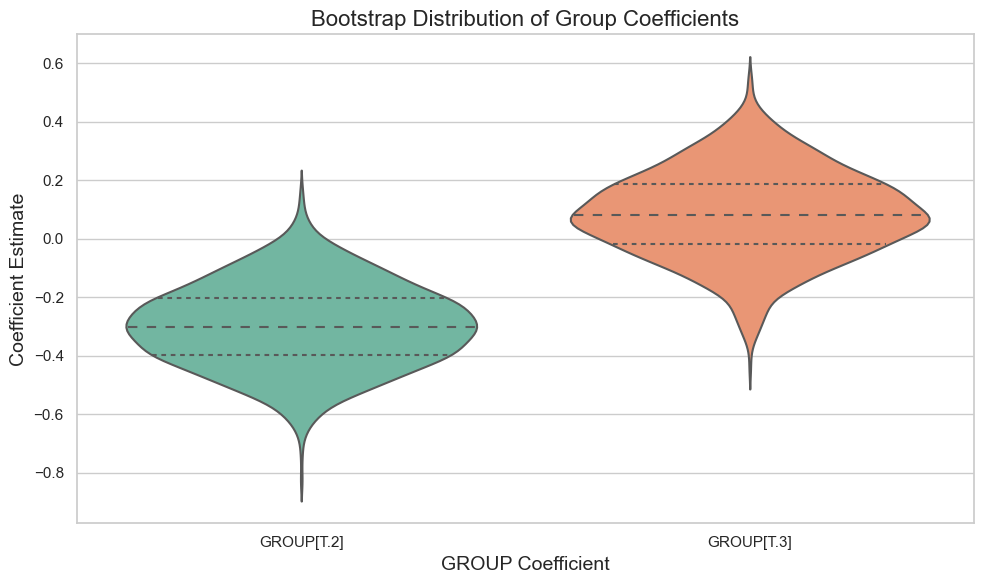

In [643]:
## Bootstrap Sampling and Visualization ##

np.random.seed(43)

# Define the number of bootstrap samples
n_bootstrap = 1000

df['GROUP'] = df['GROUP'].astype('category')

sample_model = smf.ols('Post_Motivation_Index ~ Pre_Motivation_Index_standardized + GROUP', data=df).fit()
group_params = [param for param in sample_model.params.index if param.startswith('GROUP[')]

bootstrap_coefficients = {param: [] for param in group_params}

# Perform bootstrap sampling
for i in range(n_bootstrap):
    # Resample the data with replacement
    df_bootstrap = df.sample(frac=1, replace=True).reset_index(drop=True)
    
    # Fit the model on the bootstrapped sample
    model_bootstrap = smf.ols('Post_Motivation_Index ~ Pre_Motivation_Index_standardized + GROUP', data=df_bootstrap).fit()
    

    for param in group_params:
        if param in model_bootstrap.params:
            bootstrap_coefficients[param].append(model_bootstrap.params[param])
        else:
            bootstrap_coefficients[param].append(0)

bootstrap_results = pd.DataFrame(bootstrap_coefficients)

# Display some basic statistics
print(bootstrap_results.describe())

# Calculate 95% confidence intervals
ci_group2 = bootstrap_results['GROUP[T.2]'].quantile([0.025, 0.975])
ci_group3 = bootstrap_results['GROUP[T.3]'].quantile([0.025, 0.975])
print(f"GROUP[T.2] 95% CI: {ci_group2.values}")
print(f"GROUP[T.3] 95% CI: {ci_group3.values}")

# ------------------- Enhanced Plots ------------------- #

bootstrap_long = bootstrap_results.melt(var_name='GROUP_Coefficient', value_name='Coefficient_Value')

sns.set(style="whitegrid")

palette = sns.color_palette("Set2", n_colors=len(group_params))

# ------------------- Single Combined KDE Plot with Vertical Lines ------------------- #

plt.figure(figsize=(12, 8))
sns.kdeplot(
    data=bootstrap_long,
    x='Coefficient_Value',
    hue='GROUP_Coefficient',
    fill=True,
    common_norm=False,
    alpha=0.5,
    palette=palette
)
# Get the current axes to adjust properties and add annotations
ax = plt.gca()

# Adjust the bottom margin
plt.subplots_adjust(bottom=0.25)

ax.tick_params(axis='x', pad=1) 

# Move x-axis label further down
#ax.xaxis.labelpad = 50

# Get the y-limits to position the text annotations
ymin, ymax = ax.get_ylim()

def darken_color(color, amount=0.5):
    c = mcolors.to_rgb(color)  # Convert color to RGB
    return [(1 - amount) * x for x in c]

# Add vertical lines for each GROUP coefficient
for param, color in zip(group_params, palette):
    mean = bootstrap_results[param].mean()
    ci_lower = bootstrap_results[param].quantile(0.025)
    ci_upper = bootstrap_results[param].quantile(0.975)

    number_with_bracket = param.split('.')[1]
    

    number = number_with_bracket.rstrip(']')
    
    # Plot mean
    plt.axvline(mean, color=color, linestyle='--', linewidth=3.5, label=f'Group{number} Mean')
    
    # Plot confidence intervals
    plt.axvline(ci_lower, color=color, linestyle=':', linewidth=3, label=f'Group{number} 2.5% & 97.5% CI')
    plt.axvline(ci_upper, color=color, linestyle=':', linewidth=3)

    offset = 0.06 * (ymax - ymin) * idx

    y_text = ymin + 0.11 * (ymax - ymin) - offset
    y_text_2 = ymin + 0.11 * (ymax - ymin)


    darker_color = darken_color(color, amount=0.3)

    # Add text annotations
    if number == '3':
        ax.text(mean, y_text, f'{mean:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)
        ax.text(ci_lower, y_text, f'{ci_lower:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)
        ax.text(ci_upper, y_text, f'{ci_upper:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)
    else:
        ax.text(mean, y_text_2, f'{mean:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)
        ax.text(ci_lower, y_text_2, f'{ci_lower:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)
        ax.text(ci_upper, y_text_2, f'{ci_upper:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)

# To avoid duplicate labels in the legend, we'll handle them separately
handles, labels = plt.gca().get_legend_handles_labels()
# Create a dictionary to remove duplicate labels
from collections import OrderedDict
by_label = OrderedDict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), fontsize=18, title_fontsize=12)

# Add titles and labels
plt.title('On Post Motivation Index', fontweight='bold', fontsize=32)
plt.xlabel('Coefficient Estimate', fontsize=28)
plt.ylabel('Density', fontsize=28)


# Increase the tick label font size
plt.tick_params(axis='both', which='major', labelsize=18)

# Adjust layout
plt.tight_layout()
plt.show()

# ------------------- Separate Subplots with Vertical Lines Vertical ------------------- #

# Initialize the matplotlib figure for vertical subplots
n_coefficients = len(group_params)
cols = 1 
rows = n_coefficients 

fig, axes = plt.subplots(rows, cols, figsize=(10, 6 * rows))
axes = axes.flatten() 

# Add a title for the entire figure
fig.suptitle('Group Coefficients on Post Motivation Index (B = 1000)', fontsize=22)

# Define a dictionary mapping each parameter to a custom title
custom_titles = {
    'GROUP[T.2]': 'Group 2',
    'GROUP[T.3]': 'Group 3'
    # Add more mappings if you have more groups
}

# Find the global x-axis limits based on all data to ensure consistency
min_x = min(bootstrap_results[param].min() for param in group_params)
max_x = max(bootstrap_results[param].max() for param in group_params)

# Add a margin to avoid cutting off the distribution lines
x_margin = 0.05 * (max_x - min_x)  # Add 5% margin on each side
min_x -= x_margin
max_x += x_margin

for idx, (param, ax) in enumerate(zip(group_params, axes)):
    sns.histplot(
        bootstrap_results[param],
        bins=30,
        kde=True,
        color=palette[idx],
        ax=ax,
        edgecolor='k',
        alpha=0.6,
        kde_kws={"cut": 5}  # Ensure the KDE line dont get cut off
    )
    
    # Calculate statistics
    mean = bootstrap_results[param].mean()
    ci_lower = bootstrap_results[param].quantile(0.025)
    ci_upper = bootstrap_results[param].quantile(0.975)
    
    # Add vertical lines
    ax.axvline(mean, color='red', linestyle='--', label=f'Mean: {mean:.2f}')
    ax.axvline(ci_lower, color='blue', linestyle=':', label=f'2.5%: {ci_lower:.2f}')
    ax.axvline(ci_upper, color='blue', linestyle=':', label=f'97.5%: {ci_upper:.2f}')
    
    # Set titles and labels
    ax.set_title(custom_titles.get(param, f'Bootstrap Distribution of {param} Coefficient'), fontsize=18)
    ax.set_xlabel('Coefficient Estimate', fontsize=16)
    ax.set_ylabel('Frequency', fontsize=16)
    
    # Add legend
    ax.legend(fontsize=12)

    # Increase the tick label font size
    ax.tick_params(axis='both', which='major', labelsize=14)

    # Set consistent x-axis limits for comparison
    ax.set_xlim(min_x, max_x)

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96])  
plt.show()

# ------------------- Separate Subplots with Vertical Lines ------------------- #

# Initialize the matplotlib figure for separate subplots
n_coefficients = len(group_params)
cols = 2
rows = int(np.ceil(n_coefficients / cols))

fig, axes = plt.subplots(rows, cols, figsize=(14, 6 * rows))
axes = axes.flatten()  # Flatten in case of multiple rows

# Add a title for the entire figure
fig.suptitle('Group Coefficients on Pre Motivation Index (B = 1000)', fontsize=18)

# Define a dictionary mapping each parameter to a custom title
custom_titles = {
    'GROUP[T.2]': 'Group 2',
    'GROUP[T.3]': 'Group 3'
}

for idx, (param, ax) in enumerate(zip(group_params, axes)):
    sns.histplot(
        bootstrap_results[param],
        bins=30,
        kde=True,
        color=palette[idx],
        ax=ax,
        edgecolor='k',
        alpha=0.6
    )
    
    # Calculate statistics
    mean = bootstrap_results[param].mean()
    ci_lower = bootstrap_results[param].quantile(0.025)
    ci_upper = bootstrap_results[param].quantile(0.975)
    
    # Add vertical lines
    ax.axvline(mean, color='red', linestyle='--', label=f'Mean: {mean:.2f}')
    ax.axvline(ci_lower, color='blue', linestyle=':', label=f'2.5%: {ci_lower:.2f}')
    ax.axvline(ci_upper, color='blue', linestyle=':', label=f'97.5%: {ci_upper:.2f}')
    
    # Set titles and labels
    ax.set_title(custom_titles.get(param, f'Bootstrap Distribution of {param} Coefficient'), fontsize=18)
    ax.set_xlabel('Coefficient Estimate', fontsize=16)
    ax.set_ylabel('Frequency', fontsize=16)
    
    # Add legend
    ax.legend(fontsize=12)

    # Increase the tick label font size
    ax.tick_params(axis='both', which='major', labelsize=14)

# Remove any unused subplots
for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()

# ------------------- Violin Plots ------------------- #

plt.figure(figsize=(10, 6))
sns.violinplot(
    data=bootstrap_long,
    x='GROUP_Coefficient',
    y='Coefficient_Value',
    palette='Set2',
    inner='quartile'
)
plt.title('Bootstrap Distribution of Group Coefficients', fontsize=16)
plt.xlabel('GROUP Coefficient', fontsize=14)
plt.ylabel('Coefficient Estimate', fontsize=14)
plt.tight_layout()
plt.show()

### Difference Score Model

In [644]:
# Fit the diff score model
model_change_mot = smf.ols('Motivation_Change ~ GROUP', data=df).fit()
# Print model summary
print(model_change_mot.summary())
robust_model_change_mot  = model_change_mot.get_robustcov_results(cov_type='HC3')
print(robust_model_change_mot .summary())

                            OLS Regression Results                            
Dep. Variable:      Motivation_Change   R-squared:                       0.044
Model:                            OLS   Adj. R-squared:                  0.034
Method:                 Least Squares   F-statistic:                     4.484
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):             0.0125
Time:                        22:47:20   Log-Likelihood:                -256.12
No. Observations:                 196   AIC:                             518.2
Df Residuals:                     193   BIC:                             528.1
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0588      0.109      0.539      0.5

## Self-Efficacy

### Baseline

In [645]:
# ANCOVA baseline model Motivation
model_base_self = smf.ols('Post_SelfEfficacy_Index ~ Pre_SelfEfficacy_Index_standardized + GROUP', data=df).fit()
# Print model summary
print(model_base_self.summary())
robust_model_base_self = model_base_self.get_robustcov_results(cov_type='HC3')
print(robust_model_base_self.summary())

                               OLS Regression Results                              
Dep. Variable:     Post_SelfEfficacy_Index   R-squared:                       0.597
Model:                                 OLS   Adj. R-squared:                  0.591
Method:                      Least Squares   F-statistic:                     94.74
Date:                      Mo, 07 Okt 2024   Prob (F-statistic):           1.16e-37
Time:                             22:47:20   Log-Likelihood:                -205.69
No. Observations:                      196   AIC:                             419.4
Df Residuals:                          192   BIC:                             432.5
Df Model:                                3                                         
Covariance Type:                 nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------

### Adding Key Variables

In [646]:
# Model 1: AIExperience -> Dont include
model_self_1 = smf.ols('Post_SelfEfficacy_Index ~ Pre_SelfEfficacy_Index_standardized + GROUP + AIExperience', data=df).fit()
# Print model summary
print(model_self_1.summary())

                               OLS Regression Results                              
Dep. Variable:     Post_SelfEfficacy_Index   R-squared:                       0.598
Model:                                 OLS   Adj. R-squared:                  0.589
Method:                      Least Squares   F-statistic:                     70.93
Date:                      Mo, 07 Okt 2024   Prob (F-statistic):           1.01e-36
Time:                             22:47:20   Log-Likelihood:                -205.49
No. Observations:                      196   AIC:                             421.0
Df Residuals:                          191   BIC:                             437.4
Df Model:                                4                                         
Covariance Type:                 nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------

In [647]:
# Model 2: AIAttitude -> Dont include
model_self_2 = smf.ols('Post_SelfEfficacy_Index ~ Pre_SelfEfficacy_Index_standardized + GROUP', data=df).fit()
# Print model summary
print(model_self_2.summary())

                               OLS Regression Results                              
Dep. Variable:     Post_SelfEfficacy_Index   R-squared:                       0.597
Model:                                 OLS   Adj. R-squared:                  0.591
Method:                      Least Squares   F-statistic:                     94.74
Date:                      Mo, 07 Okt 2024   Prob (F-statistic):           1.16e-37
Time:                             22:47:20   Log-Likelihood:                -205.69
No. Observations:                      196   AIC:                             419.4
Df Residuals:                          192   BIC:                             432.5
Df Model:                                3                                         
Covariance Type:                 nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------

In [648]:
# Model 3: DAT
model_self_3 = smf.ols('Post_SelfEfficacy_Index ~ Pre_SelfEfficacy_Index_standardized + GROUP', data=df).fit()
# Print model summary
print(model_self_3.summary())

                               OLS Regression Results                              
Dep. Variable:     Post_SelfEfficacy_Index   R-squared:                       0.597
Model:                                 OLS   Adj. R-squared:                  0.591
Method:                      Least Squares   F-statistic:                     94.74
Date:                      Mo, 07 Okt 2024   Prob (F-statistic):           1.16e-37
Time:                             22:47:20   Log-Likelihood:                -205.69
No. Observations:                      196   AIC:                             419.4
Df Residuals:                          192   BIC:                             432.5
Df Model:                                3                                         
Covariance Type:                 nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------

In [649]:
# Model 4: Self Concept -> Dont include
model_self_4 = smf.ols('Post_SelfEfficacy_Index ~ Pre_SelfEfficacy_Index_standardized + GROUP + CW_SelfConcept', data=df).fit()
# Print model summary
print(model_self_4.summary())

                               OLS Regression Results                              
Dep. Variable:     Post_SelfEfficacy_Index   R-squared:                       0.597
Model:                                 OLS   Adj. R-squared:                  0.589
Method:                      Least Squares   F-statistic:                     70.77
Date:                      Mo, 07 Okt 2024   Prob (F-statistic):           1.14e-36
Time:                             22:47:20   Log-Likelihood:                -205.62
No. Observations:                      196   AIC:                             421.2
Df Residuals:                          191   BIC:                             437.6
Df Model:                                4                                         
Covariance Type:                 nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------

In [650]:
# Model 5: Creative Practice -> include
model_self_5 = smf.ols('Post_SelfEfficacy_Index ~ Pre_SelfEfficacy_Index_standardized + GROUP + CreativePractice', data=df).fit()
# Print model summary
print(model_self_5.summary())

                               OLS Regression Results                              
Dep. Variable:     Post_SelfEfficacy_Index   R-squared:                       0.608
Model:                                 OLS   Adj. R-squared:                  0.600
Method:                      Least Squares   F-statistic:                     74.03
Date:                      Mo, 07 Okt 2024   Prob (F-statistic):           8.70e-38
Time:                             22:47:20   Log-Likelihood:                -202.96
No. Observations:                      196   AIC:                             415.9
Df Residuals:                          191   BIC:                             432.3
Df Model:                                4                                         
Covariance Type:                 nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------

In [651]:
# Model 6: Age -> Dont include
model_self_6 = smf.ols('Post_SelfEfficacy_Index ~ Pre_SelfEfficacy_Index_standardized + GROUP + CreativePractice + Age_standardized', data=df).fit()
# Print model summary
print(model_self_6.summary())

                               OLS Regression Results                              
Dep. Variable:     Post_SelfEfficacy_Index   R-squared:                       0.608
Model:                                 OLS   Adj. R-squared:                  0.598
Method:                      Least Squares   F-statistic:                     58.95
Date:                      Mo, 07 Okt 2024   Prob (F-statistic):           7.74e-37
Time:                             22:47:20   Log-Likelihood:                -202.92
No. Observations:                      196   AIC:                             417.8
Df Residuals:                          190   BIC:                             437.5
Df Model:                                5                                         
Covariance Type:                 nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------

In [652]:
# Model 7: TechComfort -> dont
model_self_7 = smf.ols('Post_SelfEfficacy_Index ~ Pre_SelfEfficacy_Index_standardized + GROUP + CreativePractice + TechComfort', data=df).fit()
# Print model summary
print(model_self_7.summary())

                               OLS Regression Results                              
Dep. Variable:     Post_SelfEfficacy_Index   R-squared:                       0.621
Model:                                 OLS   Adj. R-squared:                  0.611
Method:                      Least Squares   F-statistic:                     62.26
Date:                      Mo, 07 Okt 2024   Prob (F-statistic):           3.30e-38
Time:                             22:47:20   Log-Likelihood:                -199.64
No. Observations:                      196   AIC:                             411.3
Df Residuals:                          190   BIC:                             430.9
Df Model:                                5                                         
Covariance Type:                 nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------

In [653]:
# Model 8: Education -> dont
model_self_8 = smf.ols('Post_SelfEfficacy_Index ~ Pre_SelfEfficacy_Index_standardized + GROUP + CreativePractice + Education_standardized', data=df).fit()
# Print model summary
print(model_self_8.summary())

                               OLS Regression Results                              
Dep. Variable:     Post_SelfEfficacy_Index   R-squared:                       0.608
Model:                                 OLS   Adj. R-squared:                  0.598
Method:                      Least Squares   F-statistic:                     58.98
Date:                      Mo, 07 Okt 2024   Prob (F-statistic):           7.51e-37
Time:                             22:47:20   Log-Likelihood:                -202.89
No. Observations:                      196   AIC:                             417.8
Df Residuals:                          190   BIC:                             437.4
Df Model:                                5                                         
Covariance Type:                 nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------

In [654]:
# Model 9: Baseline Motivation -> Dont include
model_self_9 = smf.ols('Post_SelfEfficacy_Index ~ Pre_SelfEfficacy_Index_standardized + GROUP + CreativePractice + Pre_Motivation_Index_standardized', data=df).fit()
# Print model summary
print(model_self_9.summary())

                               OLS Regression Results                              
Dep. Variable:     Post_SelfEfficacy_Index   R-squared:                       0.610
Model:                                 OLS   Adj. R-squared:                  0.600
Method:                      Least Squares   F-statistic:                     59.43
Date:                      Mo, 07 Okt 2024   Prob (F-statistic):           4.88e-37
Time:                             22:47:20   Log-Likelihood:                -202.44
No. Observations:                      196   AIC:                             416.9
Df Residuals:                          190   BIC:                             436.6
Df Model:                                5                                         
Covariance Type:                 nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------

In [655]:
# Model 10: Language Level -> Dont
model_self_10 = smf.ols('Post_SelfEfficacy_Index ~ Pre_SelfEfficacy_Index_standardized + GROUP + CreativePractice + Lang_Level_standardized', data=df).fit()
# Print model summary
print(model_self_10.summary())

                               OLS Regression Results                              
Dep. Variable:     Post_SelfEfficacy_Index   R-squared:                       0.608
Model:                                 OLS   Adj. R-squared:                  0.598
Method:                      Least Squares   F-statistic:                     59.06
Date:                      Mo, 07 Okt 2024   Prob (F-statistic):           6.99e-37
Time:                             22:47:20   Log-Likelihood:                -202.82
No. Observations:                      196   AIC:                             417.6
Df Residuals:                          190   BIC:                             437.3
Df Model:                                5                                         
Covariance Type:                 nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------

In [656]:
# Model 11: Gender -> Dont
model_self_11 = smf.ols('Post_SelfEfficacy_Index ~ Pre_SelfEfficacy_Index_standardized + GROUP + CreativePractice + Gender', data=df).fit()
# Print model summary
print(model_self_11.summary())

                               OLS Regression Results                              
Dep. Variable:     Post_SelfEfficacy_Index   R-squared:                       0.608
Model:                                 OLS   Adj. R-squared:                  0.598
Method:                      Least Squares   F-statistic:                     59.04
Date:                      Mo, 07 Okt 2024   Prob (F-statistic):           7.11e-37
Time:                             22:47:20   Log-Likelihood:                -202.83
No. Observations:                      196   AIC:                             417.7
Df Residuals:                          190   BIC:                             437.3
Df Model:                                5                                         
Covariance Type:                 nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------

### Full Model

In [657]:
# Full Model Self-Efficacy
model_full_self = smf.ols('Post_SelfEfficacy_Index ~ Pre_SelfEfficacy_Index_standardized + GROUP + CreativePractice', data=df).fit()
# Print model summary
print(model_full_self.summary())
robust_model_full_self = model_full_self.get_robustcov_results(cov_type='HC3')
print(robust_model_full_self.summary())

                               OLS Regression Results                              
Dep. Variable:     Post_SelfEfficacy_Index   R-squared:                       0.608
Model:                                 OLS   Adj. R-squared:                  0.600
Method:                      Least Squares   F-statistic:                     74.03
Date:                      Mo, 07 Okt 2024   Prob (F-statistic):           8.70e-38
Time:                             22:47:21   Log-Likelihood:                -202.96
No. Observations:                      196   AIC:                             415.9
Df Residuals:                          191   BIC:                             432.3
Df Model:                                4                                         
Covariance Type:                 nonrobust                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------

### VIF

In [658]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
variables = df[['Pre_SelfEfficacy_Index_standardized', 'CreativePractice', 'GROUP']]
vif_data = pd.DataFrame()
vif_data["VIF"] = [variance_inflation_factor(variables.values, i) for i in range(variables.shape[1])]
vif_data["feature"] = variables.columns
print(vif_data)

        VIF                              feature
0  1.262172  Pre_SelfEfficacy_Index_standardized
1  1.262156                     CreativePractice
2  1.000363                                GROUP


### Power Analysis

In [659]:
## Power Analysis ##
# Fit the full model (including GROUP)
model_full = smf.ols('Post_SelfEfficacy_Index ~ Pre_SelfEfficacy_Index_standardized + C(GROUP)', data=df).fit()
anova_table_full = sm.stats.anova_lm(model_full, typ=2)  # Type 2 ANOVA
print("ANOVA table for full model:")
print(anova_table_full)

# Fit the reduced model (excluding GROUP)
model_reduced = smf.ols('Post_SelfEfficacy_Index ~ Pre_SelfEfficacy_Index_standardized', data=df).fit()
anova_table_reduced = sm.stats.anova_lm(model_reduced, typ=2)  # Type 2 ANOVA
print("ANOVA table for reduced model:")
print(anova_table_reduced)

# Get R-squared values from both models
R2_full = model_full.rsquared
R2_reduced = model_reduced.rsquared
print(f"R2 full model: {R2_full}")
print(f"R2 reduced model: {R2_reduced}")

# Calculate the partial R-squared for the GROUP variable
partial_R2_GROUP = (R2_full - R2_reduced) / (1 - R2_reduced)
print(f"R2 partial: {partial_R2_GROUP}")

# Calculate the partial eta-squared for the GROUP variable
partial_eta_squared = (R2_full - R2_reduced) / (1 - R2_reduced)
print(f"Partial η²: {partial_eta_squared}")

# Compute Cohen's f (effect size measure)
f = np.sqrt(partial_eta_squared / (1 - partial_eta_squared))
print(f"Cohen's f: {f}")

# Degrees of freedom
df_num = model_full.df_model - model_reduced.df_model 
print(f"Degrees of freedom: {df_num}")
df_denom = model_full.df_resid 
print(f"Degrees of freedom in full model: {df_denom}")

# Number of groups
k_groups = df['GROUP'].nunique()
print(f"K Groups: {k_groups}")

nobs = int(model_full.nobs)

alpha = 0.05

# Initialize the power analysis object
power_analysis = FTestAnovaPower()

# Calculate the post-hoc power
power = power_analysis.power(effect_size=f, k_groups=k_groups, nobs=nobs, alpha=alpha)

print(f"Post-hoc power for the GROUP variable: {power:.4f}")

# Calculate required sample size per group
desired_power = 0.80  # Desired power level
sample_size_needed = smp.FTestAnovaPower().solve_power(effect_size=f, alpha=alpha, power=desired_power, k_groups=k_groups)

print(f"Required total sample size for 80% power: {sample_size_needed:.2f}")

ANOVA table for full model:
                                         sum_sq     df          F  \
C(GROUP)                               1.035067    2.0    1.06151   
Pre_SelfEfficacy_Index_standardized  138.501588    1.0  284.07971   
Residual                              93.608604  192.0        NaN   

                                           PR(>F)  
C(GROUP)                             3.479544e-01  
Pre_SelfEfficacy_Index_standardized  1.023323e-39  
Residual                                      NaN  
ANOVA table for reduced model:
                                         sum_sq     df           F  \
Pre_SelfEfficacy_Index_standardized  137.530365    1.0  281.908876   
Residual                              94.643671  194.0         NaN   

                                           PR(>F)  
Pre_SelfEfficacy_Index_standardized  1.165827e-39  
Residual                                      NaN  
R2 full model: 0.5968170896206433
R2 reduced model: 0.592358937261889
R2 partial: 0.01093

### Bootstrap Sampling

        GROUP[T.2]   GROUP[T.3]
count  1000.000000  1000.000000
mean     -0.122229     0.049106
std       0.135095     0.114373
min      -0.553582    -0.300399
25%      -0.214732    -0.028164
50%      -0.123353     0.041971
75%      -0.030307     0.124620
max       0.373980     0.444644
GROUP[T.2] 95% CI: [-0.38827748  0.14411824]
GROUP[T.3] 95% CI: [-0.16972792  0.28428699]


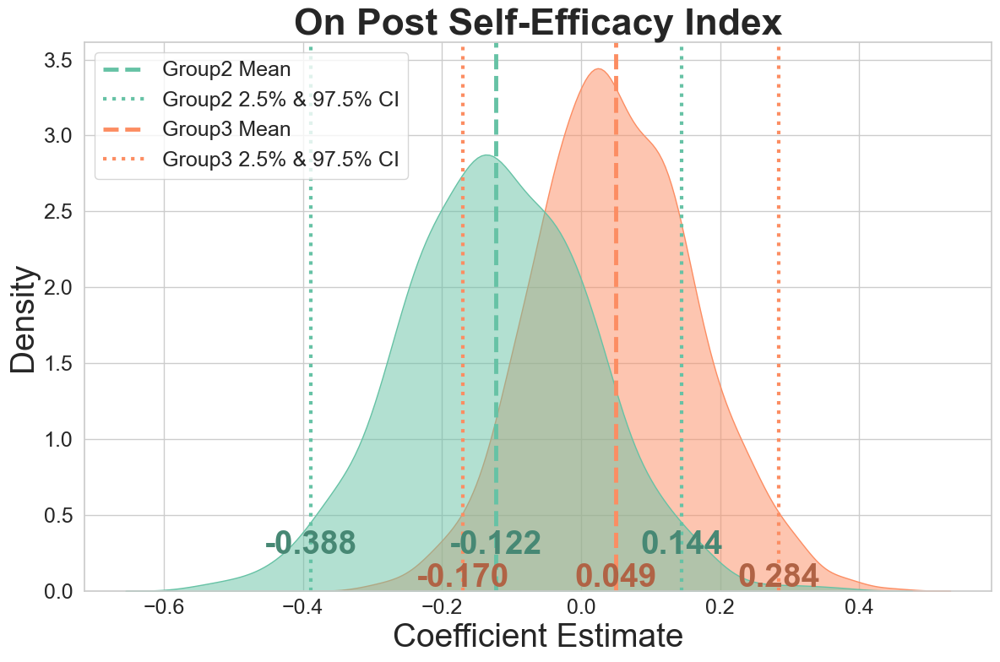

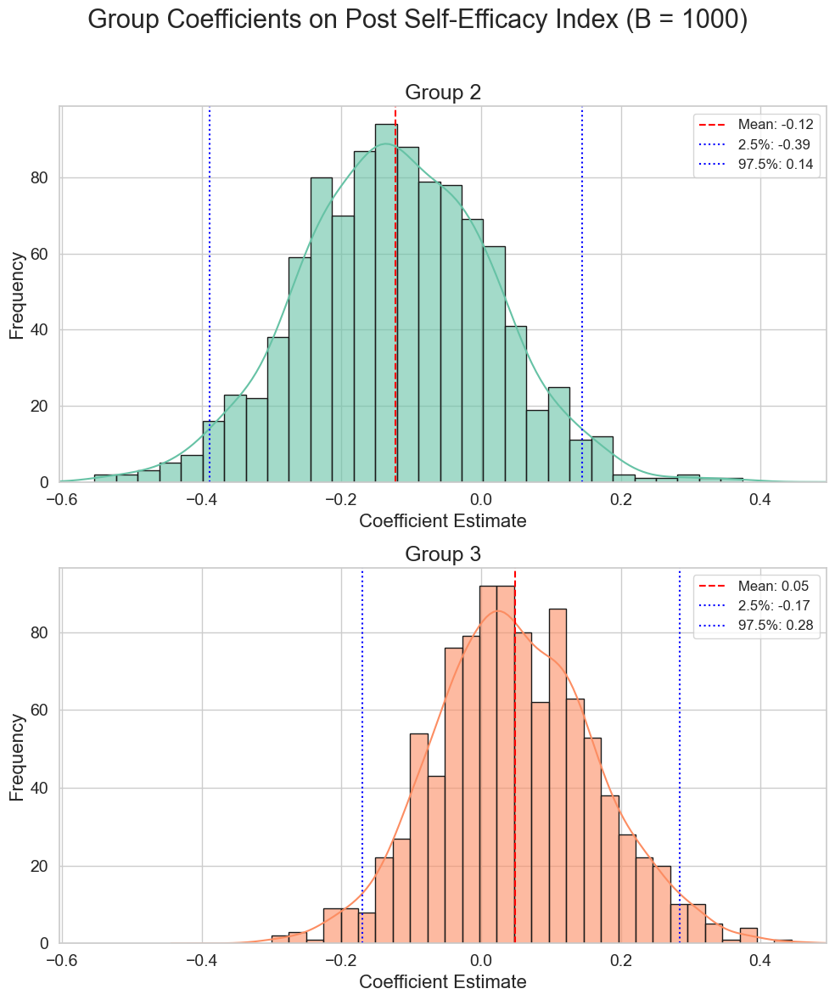

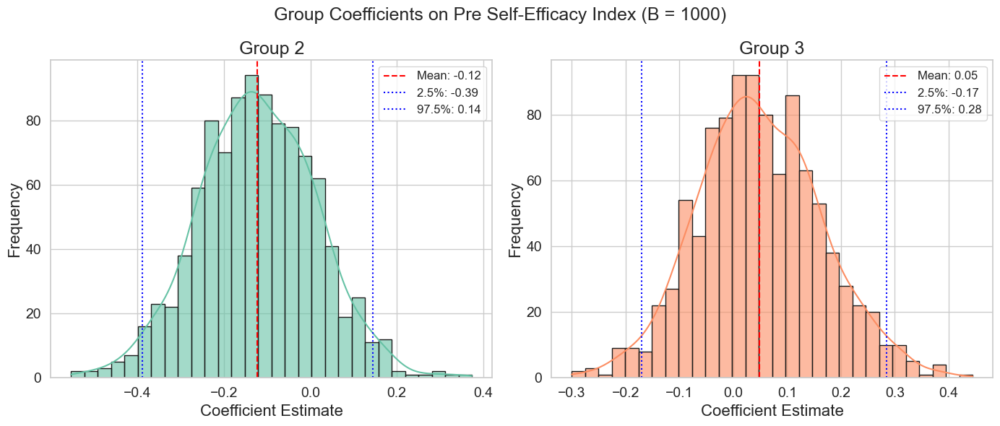

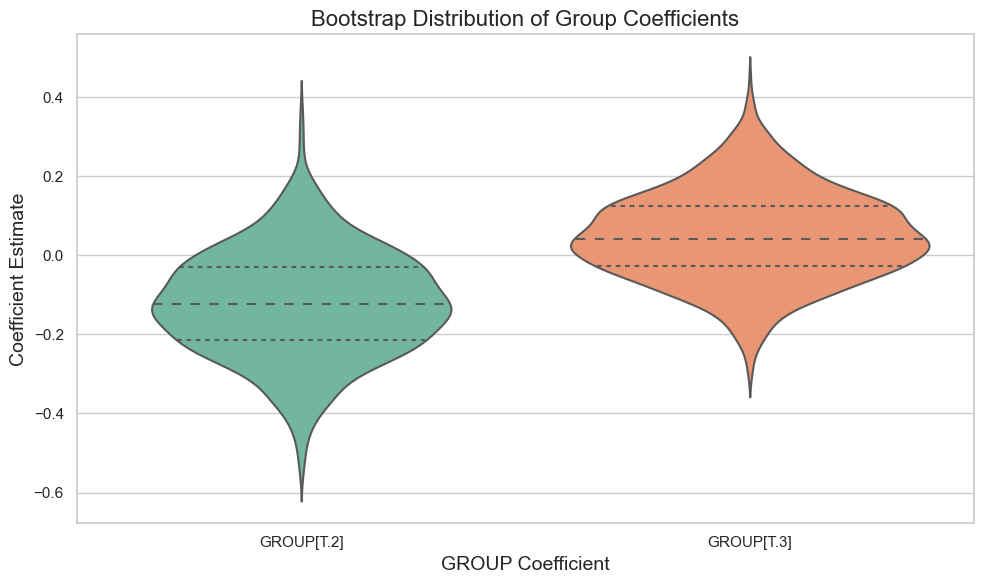

In [660]:
## Bootstrap Sampling and Visualization ##

np.random.seed(43)

# Define the number of bootstrap samples
n_bootstrap = 1000

df['GROUP'] = df['GROUP'].astype('category')

sample_model = smf.ols('Post_SelfEfficacy_Index ~ Pre_SelfEfficacy_Index_standardized + GROUP', data=df).fit()
group_params = [param for param in sample_model.params.index if param.startswith('GROUP[')]

bootstrap_coefficients = {param: [] for param in group_params}

# Perform bootstrap sampling
for i in range(n_bootstrap):
    # Resample the data with replacement
    df_bootstrap = df.sample(frac=1, replace=True).reset_index(drop=True)
    
    # Fit the model on the bootstrapped sample
    model_bootstrap = smf.ols('Post_SelfEfficacy_Index ~ Pre_SelfEfficacy_Index_standardized + GROUP', data=df_bootstrap).fit()
    
    # Store each GROUP coefficient, assign 0 if the category is missing
    for param in group_params:
        if param in model_bootstrap.params:
            bootstrap_coefficients[param].append(model_bootstrap.params[param])
        else:
            bootstrap_coefficients[param].append(0)

bootstrap_results = pd.DataFrame(bootstrap_coefficients)

# Display some basic statistics
print(bootstrap_results.describe())

# Calculate 95% confidence intervals
ci_group2 = bootstrap_results['GROUP[T.2]'].quantile([0.025, 0.975])
ci_group3 = bootstrap_results['GROUP[T.3]'].quantile([0.025, 0.975])
print(f"GROUP[T.2] 95% CI: {ci_group2.values}")
print(f"GROUP[T.3] 95% CI: {ci_group3.values}")

# ------------------- Enhanced Plots ------------------- #

# Melt the DataFrame to long-form for seaborn
bootstrap_long = bootstrap_results.melt(var_name='GROUP_Coefficient', value_name='Coefficient_Value')

# Set the aesthetic style of the plots
sns.set(style="whitegrid")

# Choose a color palette
palette = sns.color_palette("Set2", n_colors=len(group_params))

# ------------------- Single Combined KDE Plot with Vertical Lines ------------------- #

plt.figure(figsize=(12, 8))
sns.kdeplot(
    data=bootstrap_long,
    x='Coefficient_Value',
    hue='GROUP_Coefficient',
    fill=True,
    common_norm=False,
    alpha=0.5,
    palette=palette
)
# Get the current axes to adjust properties and add annotations
ax = plt.gca()

# Adjust the bottom margin to make room for text annotations
plt.subplots_adjust(bottom=0.25)

# Increase space between x-axis ticks and labels
ax.tick_params(axis='x', pad=1) 

# Move x-axis label further down
#ax.xaxis.labelpad = 50

# Get the y-limits to position the text annotations
ymin, ymax = ax.get_ylim()

def darken_color(color, amount=0.5):
    c = mcolors.to_rgb(color) 
    return [(1 - amount) * x for x in c]

# Add vertical lines for each GROUP coefficient
for param, color in zip(group_params, palette):
    mean = bootstrap_results[param].mean()
    ci_lower = bootstrap_results[param].quantile(0.025)
    ci_upper = bootstrap_results[param].quantile(0.975)

    number_with_bracket = param.split('.')[1]

    number = number_with_bracket.rstrip(']')
    
    # Plot mean
    plt.axvline(mean, color=color, linestyle='--', linewidth=3.5, label=f'Group{number} Mean')
    
    # Plot confidence intervals
    plt.axvline(ci_lower, color=color, linestyle=':', linewidth=3, label=f'Group{number} 2.5% & 97.5% CI')
    plt.axvline(ci_upper, color=color, linestyle=':', linewidth=3)

    # Calculate offset for each group to prevent overlap
    offset = 0.06 * (ymax - ymin) * idx

    # Position the text annotations slightly below the x-axis
    y_text = ymin + 0.11 * (ymax - ymin) - offset
    y_text_2 = ymin + 0.11 * (ymax - ymin)

    # Get darker shade of the current color
    darker_color = darken_color(color, amount=0.3)

    # Add text annotations for mean, ci_lower, and ci_upper
    if number == '3':
        ax.text(mean, y_text, f'{mean:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)
        ax.text(ci_lower, y_text, f'{ci_lower:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)
        ax.text(ci_upper, y_text, f'{ci_upper:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)
    else:
        ax.text(mean, y_text_2, f'{mean:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)
        ax.text(ci_lower, y_text_2, f'{ci_lower:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)
        ax.text(ci_upper, y_text_2, f'{ci_upper:.3f}', color=darker_color, ha='center', va='top', fontweight='bold', fontsize=28)

handles, labels = plt.gca().get_legend_handles_labels()
# Create a dictionary to remove duplicate labels
from collections import OrderedDict
by_label = OrderedDict(zip(labels, handles))
plt.legend(by_label.values(), by_label.keys(), fontsize=18, title_fontsize=12)

# Add titles and labels
plt.title('On Post Self-Efficacy Index', fontweight='bold', fontsize=32)
plt.xlabel('Coefficient Estimate', fontsize=28)
plt.ylabel('Density', fontsize=28)


# Increase the tick label font size
plt.tick_params(axis='both', which='major', labelsize=18)

# Adjust layout
plt.tight_layout()
plt.show()

# ------------------- Separate Subplots with Vertical Lines Vertical ------------------- #

# Initialize the matplotlib figure for vertical subplots
n_coefficients = len(group_params)
cols = 1 
rows = n_coefficients  

fig, axes = plt.subplots(rows, cols, figsize=(10, 6 * rows))
axes = axes.flatten()  # Flatten in case of multiple rows

# Add a title for the entire figure
fig.suptitle('Group Coefficients on Post Self-Efficacy Index (B = 1000)', fontsize=22)

# Define a dictionary mapping each parameter to a custom title
custom_titles = {
    'GROUP[T.2]': 'Group 2',
    'GROUP[T.3]': 'Group 3'
}

# Find the global x-axis limits
min_x = min(bootstrap_results[param].min() for param in group_params)
max_x = max(bootstrap_results[param].max() for param in group_params)

# Add a margin
x_margin = 0.05 * (max_x - min_x)
min_x -= x_margin
max_x += x_margin

for idx, (param, ax) in enumerate(zip(group_params, axes)):
    sns.histplot(
        bootstrap_results[param],
        bins=30,
        kde=True,
        color=palette[idx],
        ax=ax,
        edgecolor='k',
        alpha=0.6,
        kde_kws={"cut": 5}
    )
    
    # Calculate statistics
    mean = bootstrap_results[param].mean()
    ci_lower = bootstrap_results[param].quantile(0.025)
    ci_upper = bootstrap_results[param].quantile(0.975)
    
    # Add vertical lines
    ax.axvline(mean, color='red', linestyle='--', label=f'Mean: {mean:.2f}')
    ax.axvline(ci_lower, color='blue', linestyle=':', label=f'2.5%: {ci_lower:.2f}')
    ax.axvline(ci_upper, color='blue', linestyle=':', label=f'97.5%: {ci_upper:.2f}')
    
    # Set titles and labels
    ax.set_title(custom_titles.get(param, f'Bootstrap Distribution of {param} Coefficient'), fontsize=18)
    ax.set_xlabel('Coefficient Estimate', fontsize=16)
    ax.set_ylabel('Frequency', fontsize=16)
    
    # Add legend
    ax.legend(fontsize=12)

    # Increase the tick label font size
    ax.tick_params(axis='both', which='major', labelsize=14)

    # Set consistent x-axis limits for comparison
    ax.set_xlim(min_x, max_x)

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.96]) 
plt.show()

# ------------------- Separate Subplots with Vertical Lines ------------------- #

# Initialize the matplotlib figure for separate subplots
n_coefficients = len(group_params)
cols = 2
rows = int(np.ceil(n_coefficients / cols))

fig, axes = plt.subplots(rows, cols, figsize=(14, 6 * rows))
axes = axes.flatten() 

# Add a title for the entire figure
fig.suptitle('Group Coefficients on Pre Self-Efficacy Index (B = 1000)', fontsize=18)

custom_titles = {
    'GROUP[T.2]': 'Group 2',
    'GROUP[T.3]': 'Group 3'
}

for idx, (param, ax) in enumerate(zip(group_params, axes)):
    sns.histplot(
        bootstrap_results[param],
        bins=30,
        kde=True,
        color=palette[idx],
        ax=ax,
        edgecolor='k',
        alpha=0.6
    )
    
    # Calculate statistics
    mean = bootstrap_results[param].mean()
    ci_lower = bootstrap_results[param].quantile(0.025)
    ci_upper = bootstrap_results[param].quantile(0.975)
    
    # Add vertical lines
    ax.axvline(mean, color='red', linestyle='--', label=f'Mean: {mean:.2f}')
    ax.axvline(ci_lower, color='blue', linestyle=':', label=f'2.5%: {ci_lower:.2f}')
    ax.axvline(ci_upper, color='blue', linestyle=':', label=f'97.5%: {ci_upper:.2f}')
    
    # Set titles and labels
    ax.set_title(custom_titles.get(param, f'Bootstrap Distribution of {param} Coefficient'), fontsize=18)
    ax.set_xlabel('Coefficient Estimate', fontsize=16)
    ax.set_ylabel('Frequency', fontsize=16)
    
    # Add legend
    ax.legend(fontsize=12)

    # Increase the tick label font size
    ax.tick_params(axis='both', which='major', labelsize=14)

# Remove any unused subplots
for j in range(idx + 1, len(axes)):
    fig.delaxes(axes[j])

# Adjust layout
plt.tight_layout()
plt.show()

# ------------------- Violin Plots ------------------- #

plt.figure(figsize=(10, 6))
sns.violinplot(
    data=bootstrap_long,
    x='GROUP_Coefficient',
    y='Coefficient_Value',
    palette='Set2',
    inner='quartile'
)
plt.title('Bootstrap Distribution of Group Coefficients', fontsize=16)
plt.xlabel('GROUP Coefficient', fontsize=14)
plt.ylabel('Coefficient Estimate', fontsize=14)
plt.tight_layout()
plt.show()

### Difference Score Model

In [661]:
# Fit the diff-score model
model_change_self = smf.ols('SelfEfficacy_Change ~ GROUP', data=df).fit()
# Print model summary
print(model_change_self.summary())
robust_model_change_self  = model_change_self.get_robustcov_results(cov_type='HC3')
print(robust_model_change_self .summary())

                             OLS Regression Results                            
Dep. Variable:     SelfEfficacy_Change   R-squared:                       0.016
Model:                             OLS   Adj. R-squared:                  0.006
Method:                  Least Squares   F-statistic:                     1.603
Date:                  Mo, 07 Okt 2024   Prob (F-statistic):              0.204
Time:                         22:47:44   Log-Likelihood:                -212.93
No. Observations:                  196   AIC:                             431.9
Df Residuals:                      193   BIC:                             441.7
Df Model:                            2                                         
Covariance Type:             nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     -0.2549      0.088     -2.90

# Further Analysis

## Mediation Analysis

In [377]:
indices = ['NoveltyIndex', 'UsefulnessIndex', 'EmotionsIndex', 'Motivation_Change', 'SelfEfficacy_Change']
aiusage_suffix = ['SoundingBoard', 'Tutor', 'Ghostwriter','Editor']
aiusage_columns = ['AIUsage_Ghostwriter','AIUsage_SoundingBoard', 'AIUsage_Tutor', 'AIUsage_Editor']

import warnings
warnings.filterwarnings('ignore')

def stratified_resample(data, target_column, num_bootstrap=2000, random_state=None):
    # Perform stratified bootstrapping
    for i in range(num_bootstrap):
        # Resample each class separately to maintain the class proportions
        bootstrapped_data = data.groupby(target_column, group_keys=False).apply(lambda x: x.sample(frac=1, replace=True, random_state=random_state+i))
        
        yield bootstrapped_data

def log_regression_aiusage(df, group_column, aiusage):
    coefficients_dict = {}
    
    # Define independent variables (GROUP dummies) and dependent variable (AIUsage variable)
    X = pd.get_dummies(df[group_column], drop_first=True) # Create dummies for 'GROUP'
    y = df[aiusage]
    
    # Check if the resample has at least two classes
    if y.nunique() < 2:
        return None  # Skip this sample if only one class is present
    
    # Standardize the predictors
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X)
    
    # Initialize and fit the logistic regression model with L2 regularization
    logit_model = LogisticRegression(penalty='l2', solver='liblinear')
    logit_model.fit(X_scaled, y)
    
    # Get the coefficients and calculate odds ratios
    coefficients = logit_model.coef_[0]
    odds_ratios = np.exp(coefficients)

    # Store the coefficients in a separate variable
    coefficients_dict[aiusage] = coefficients
    
    # Store the results
    #results[aiusage] = {
    #    "Coefficients": coefficients,
    #    "Odds Ratios": odds_ratios
    #}
    
    # Print the results for this AIUsage variable
    
    return coefficients_dict

# Function to compute indirect effects using bootstrapping
def compute_indirect_effects(data, num_bootstrap=2000, random_state=None):
    results = {}
    
    for index in indices:
        print(index)
        print('-' * 50)
        results[index] = {}
        
        for aiusage in aiusage_suffix:    
            indirect_effects_group_2 = []
            indirect_effects_group_3 = []
            
            for i, sample_data in enumerate(stratified_resample(data, 'GROUP', num_bootstrap=2000, random_state=random_state)):
                # Resample data stratified
                
                # Logistic regression to compute Path A (effect of Group on AI Usage)
                aiusage_column = f'AIUsage_{aiusage}'
                #print(f"Running logistic regression for: {aiusage}")
                coefficients_dict = log_regression_aiusage(sample_data, 'GROUP', aiusage_column)

                if coefficients_dict is None:
                    continue  # Skip this iteration if the sample doesn't have two classes
                
                # Path A coefficients for Group 2 and Group 3
                path_a_coeff_group_2 = coefficients_dict[f'AIUsage_{aiusage}'][0]  # Group 2
                path_a_coeff_group_3 = coefficients_dict[f'AIUsage_{aiusage}'][1]  # Group 3
                
                # OLS to compute Path B (effect of AI Usage on the DV)
                model = ols(f'{index} ~ C(AIUsage, Treatment(reference="None"))', data=sample_data).fit()
                path_b_coeff = model.params.get(f'C(AIUsage, Treatment(reference="None"))[T.{aiusage}]', 0)
                
                # Compute the indirect effect for Group 2 and Group 3
                indirect_effect_group_2 = path_a_coeff_group_2 * path_b_coeff
                indirect_effect_group_3 = path_a_coeff_group_3 * path_b_coeff

                indirect_effects_group_2.append(indirect_effect_group_2)
                indirect_effects_group_3.append(indirect_effect_group_3)
            
            # Calculate the confidence intervals for different alphas
            def compute_ci(effects, alpha):
                lower_percentile = (1 - alpha) / 2 * 100
                upper_percentile = (1 + alpha) / 2 * 100
                lower_ci = np.percentile(effects, lower_percentile)
                upper_ci = np.percentile(effects, upper_percentile)
                return (lower_ci, upper_ci)
            
            # Confidence Intervals for Group 2
            ci_group_2_90 = compute_ci(indirect_effects_group_2, 0.90)
            ci_group_2_95 = compute_ci(indirect_effects_group_2, 0.95)
            ci_group_2_99 = compute_ci(indirect_effects_group_2, 0.99)
            
            # Confidence Intervals for Group 3
            ci_group_3_90 = compute_ci(indirect_effects_group_3, 0.90)
            ci_group_3_95 = compute_ci(indirect_effects_group_3, 0.95)
            ci_group_3_99 = compute_ci(indirect_effects_group_3, 0.99)
            
            # Store the results for this AI usage type
            results[index][aiusage] = {
                'mean_indirect_group_2': np.mean(indirect_effects_group_2),
                'ci_group_2_90': ci_group_2_90,
                'ci_group_2_95': ci_group_2_95,
                'ci_group_2_99': ci_group_2_99,
                'mean_indirect_group_3': np.mean(indirect_effects_group_3),
                'ci_group_3_90': ci_group_3_90,
                'ci_group_3_95': ci_group_3_95,
                'ci_group_3_99': ci_group_3_99
            }
        print('Success')
    return results

# usage
random_seed = 42
results = compute_indirect_effects(df, random_state=random_seed)
for index, aiusage_results in results.items():
    print(f"Results for {index}:")
    for aiusage, res in aiusage_results.items():
        print(f"AIUsage: {aiusage}")
        
        # Print mean and confidence intervals for Group 2
        print(f"Mean indirect effect (Group 2): {res['mean_indirect_group_2']}")
        print(f"90% Confidence Interval (Group 2): {res['ci_group_2_90']}")
        print(f"95% Confidence Interval (Group 2): {res['ci_group_2_95']}")
        print(f"99% Confidence Interval (Group 2): {res['ci_group_2_99']}")
        
        # Print mean and confidence intervals for Group 3
        print(f"Mean indirect effect (Group 3): {res['mean_indirect_group_3']}")
        print(f"90% Confidence Interval (Group 3): {res['ci_group_3_90']}")
        print(f"95% Confidence Interval (Group 3): {res['ci_group_3_95']}")
        print(f"99% Confidence Interval (Group 3): {res['ci_group_3_99']}")
        
        print('-' * 50)

NoveltyIndex
--------------------------------------------------
Success
UsefulnessIndex
--------------------------------------------------
Success
EmotionsIndex
--------------------------------------------------
Success
Motivation_Change
--------------------------------------------------
Success
SelfEfficacy_Change
--------------------------------------------------
Success
Results for NoveltyIndex:
AIUsage: SoundingBoard
Mean indirect effect (Group 2): 0.13023894948560744
90% Confidence Interval (Group 2): (-0.15300535717043506, 0.4028252322838486)
95% Confidence Interval (Group 2): (-0.21155118525525757, 0.45151974004840956)
99% Confidence Interval (Group 2): (-0.34768776253036726, 0.5439667129501884)
Mean indirect effect (Group 3): 0.1857255127206314
90% Confidence Interval (Group 3): (-0.1798609420814979, 0.558480022816996)
95% Confidence Interval (Group 3): (-0.263412598572769, 0.6419234306594349)
99% Confidence Interval (Group 3): (-0.3917768668113598, 0.7926105257805262)
--------

## SUR

Verify Correlated Errors across Outcomes:

In [380]:
model_ols1 = smf.ols('NoveltyIndex ~ GROUP', data=df).fit()
model_ols2 = smf.ols('UsefulnessIndex ~ GROUP', data=df).fit()
model_ols3 = smf.ols('EmotionsIndex ~ GROUP', data=df).fit()

In [381]:
res1 = model_ols1.resid
res2 = model_ols2.resid
res3 = model_ols3.resid

In [382]:
print(res1.corr(res2))
print(res1.corr(res3))
print(res2.corr(res3))

0.17086568336737917
0.5944639862173957
0.5709777520892184


Resiudals with EmotionsIndex significantly correlated (correlation coefficients above |0.3|), SUR is justified.

In [383]:
## SUR ##

# Create dummy variables
group_dummies = pd.get_dummies(df['GROUP'], drop_first=True)

# Convert
group_dummies.columns = group_dummies.columns.astype(str)

# Define the outcome variables
Y1 = df['NoveltyIndex']
Y2 = df['UsefulnessIndex']
Y3 = df['EmotionsIndex']

# Add a constant to the group dummies for the intercept term
X = sm.add_constant(group_dummies)

# Ensure column names in exog are strings
X.columns = X.columns.astype(str)

equations = {
    'NoveltyIndex': (Y1, X),
    'UsefulnessIndex': (Y2, X),
    'EmotionsIndex': (Y3, X),
}

# Fit the SUR model
model = SUR(equations=equations)
results = model.fit(cov_type='robust')

# Display the results
print(results.summary)

                           System OLS Estimation Summary                           
Estimator:                        OLS   Overall R-squared:                   0.0205
No. Equations.:                     3   McElroy's R-squared:                 0.0252
No. Observations:                 196   Judge's (OLS) R-squared:             0.0205
Date:                 Mo, Okt 07 2024   Berndt's R-squared:                  0.0726
Time:                        21:39:37   Dhrymes's R-squared:                 0.0205
                                        Cov. Estimator:                      robust
                                        Num. Constraints:                      None
           Equation: NoveltyIndex, Dependent Variable: NoveltyIndex           
            Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
------------------------------------------------------------------------------
const          3.6108     0.0974     37.057     0.0000      3.4198      3.8017
2           

## Low / High Skilled

In [384]:
# Novelty
model_dat = smf.ols('NoveltyIndex ~ GROUP * DAT_standardized', data=df).fit()
# print(model_dat.summary())
robust_model_dat = model_dat.get_robustcov_results(cov_type='HC3')
print(robust_model_dat.summary())

                            OLS Regression Results                            
Dep. Variable:           NoveltyIndex   R-squared:                       0.072
Model:                            OLS   Adj. R-squared:                  0.047
Method:                 Least Squares   F-statistic:                     2.873
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):             0.0159
Time:                        21:39:40   Log-Likelihood:                -250.35
No. Observations:                 196   AIC:                             512.7
Df Residuals:                     190   BIC:                             532.4
Df Model:                           5                                         
Covariance Type:                  HC3                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Intercept         

                            OLS Regression Results                            
Dep. Variable:           NoveltyIndex   R-squared:                       0.072
Model:                            OLS   Adj. R-squared:                  0.047
Method:                 Least Squares   F-statistic:                     2.873
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):             0.0159
Time:                        23:51:58   Log-Likelihood:                -250.35
No. Observations:                 196   AIC:                             512.7
Df Residuals:                     190   BIC:                             532.4
Df Model:                           5                                         
Covariance Type:                  HC3                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          1.0452      1.439      0.

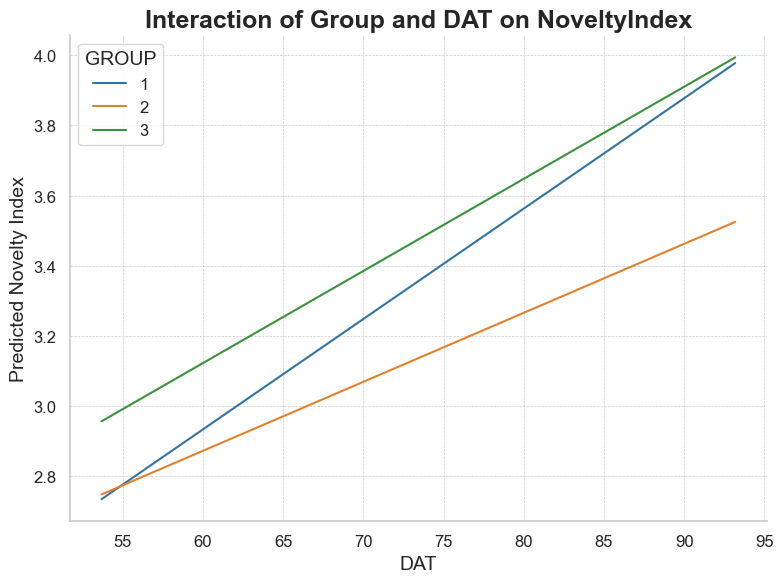

In [691]:
# Fit the model
model_dat = smf.ols('NoveltyIndex ~ GROUP * DAT', data=df).fit()
robust_model_dat = model_dat.get_robustcov_results(cov_type='HC3')

# Display the model summary
print(robust_model_dat.summary())

# Prepare for plotting
# Define the levels of GROUP and create predictions for each level
group_levels = df['GROUP'].unique()
dat_range = np.linspace(df['DAT'].min(), df['DAT'].max(), 100)

# Create a DataFrame for predictions
pred_data = pd.DataFrame({
    'DAT': np.tile(dat_range, len(group_levels)),
    'GROUP': np.repeat(group_levels, len(dat_range))
})

# Add predictions to the DataFrame
pred_data['NoveltyIndex_pred'] = robust_model_dat.predict(pred_data)

# Set your custom color palette
palette = {1: '#3274A1', 2: '#E1812C', 3: '#3A923A'}

# Plot the interaction
plt.figure(figsize=(8, 6))
sns.lineplot(x='DAT', y='NoveltyIndex_pred', hue='GROUP', data=pred_data, palette=palette)

# Adding labels and title with larger font sizes for academic style
plt.title('Interaction of Group and DAT on NoveltyIndex', fontsize=18, weight='bold')
plt.xlabel('DAT', fontsize=14)
plt.ylabel('Predicted Novelty Index', fontsize=14)
plt.legend(title='GROUP', fontsize=12, title_fontsize=14)

# Adjust aesthetics for a cleaner academic look
sns.despine()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Adjust tick parameters for bigger labels
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Show plot
plt.tight_layout()
plt.show()

In [385]:
# Usefulness
model_dat = smf.ols('UsefulnessIndex ~ GROUP * DAT_standardized', data=df).fit()
# print(model_dat.summary())
robust_model_dat = model_dat.get_robustcov_results(cov_type='HC3')
print(robust_model_dat.summary())

                            OLS Regression Results                            
Dep. Variable:        UsefulnessIndex   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                 -0.010
Method:                 Least Squares   F-statistic:                    0.6626
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):              0.652
Time:                        21:39:42   Log-Likelihood:                -264.23
No. Observations:                 196   AIC:                             540.5
Df Residuals:                     190   BIC:                             560.1
Df Model:                           5                                         
Covariance Type:                  HC3                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Intercept         

                            OLS Regression Results                            
Dep. Variable:        UsefulnessIndex   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                 -0.010
Method:                 Least Squares   F-statistic:                    0.6626
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):              0.652
Time:                        23:52:51   Log-Likelihood:                -264.23
No. Observations:                 196   AIC:                             540.5
Df Residuals:                     190   BIC:                             560.1
Df Model:                           5                                         
Covariance Type:                  HC3                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          4.1190      1.683      2.

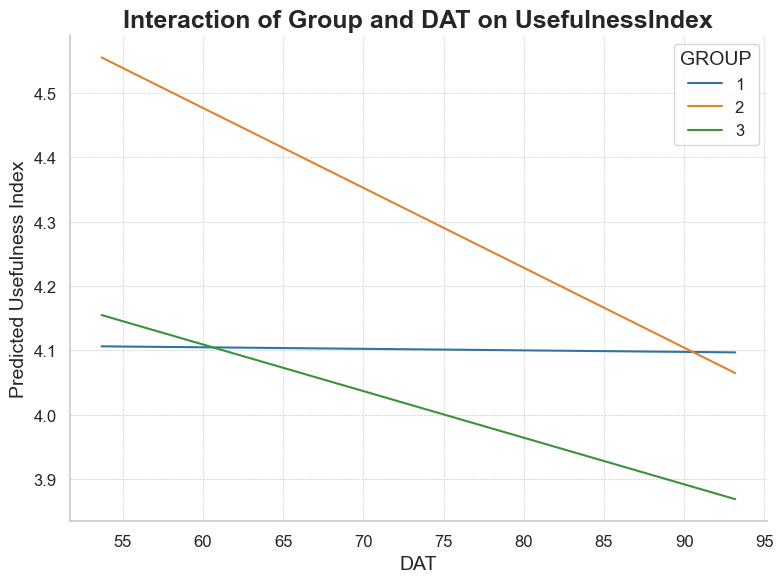

In [692]:
# Fit the model
model_dat = smf.ols('UsefulnessIndex ~ GROUP * DAT', data=df).fit()
robust_model_dat = model_dat.get_robustcov_results(cov_type='HC3')

# Display the model summary
print(robust_model_dat.summary())

# Prepare for plotting
# Define the levels of GROUP and create predictions for each level
group_levels = df['GROUP'].unique()
dat_range = np.linspace(df['DAT'].min(), df['DAT'].max(), 100)

# Create a DataFrame for predictions
pred_data = pd.DataFrame({
    'DAT': np.tile(dat_range, len(group_levels)),
    'GROUP': np.repeat(group_levels, len(dat_range))
})

# Add predictions to the DataFrame
pred_data['UsefulnessIndex_pred'] = robust_model_dat.predict(pred_data)

# Set your custom color palette
palette = {1: '#3274A1', 2: '#E1812C', 3: '#3A923A'}

# Plot the interaction
plt.figure(figsize=(8, 6))
sns.lineplot(x='DAT', y='UsefulnessIndex_pred', hue='GROUP', data=pred_data, palette=palette)

# Adding labels and title with larger font sizes for academic style
plt.title('Interaction of Group and DAT on UsefulnessIndex', fontsize=18, weight='bold')
plt.xlabel('DAT', fontsize=14)
plt.ylabel('Predicted Usefulness Index', fontsize=14)
plt.legend(title='GROUP', fontsize=12, title_fontsize=14)

# Adjust aesthetics for a cleaner academic look
sns.despine()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Adjust tick parameters for bigger labels
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Show plot
plt.tight_layout()
plt.show()

In [386]:
# Emotions
model_dat = smf.ols('EmotionsIndex ~ GROUP * DAT_standardized', data=df).fit()
# print(model_dat.summary())
robust_model_dat = model_dat.get_robustcov_results(cov_type='HC3')
print(robust_model_dat.summary())

                            OLS Regression Results                            
Dep. Variable:          EmotionsIndex   R-squared:                       0.018
Model:                            OLS   Adj. R-squared:                 -0.008
Method:                 Least Squares   F-statistic:                    0.5729
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):              0.721
Time:                        21:39:45   Log-Likelihood:                -203.43
No. Observations:                 196   AIC:                             418.9
Df Residuals:                     190   BIC:                             438.5
Df Model:                           5                                         
Covariance Type:                  HC3                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Intercept         

                            OLS Regression Results                            
Dep. Variable:          EmotionsIndex   R-squared:                       0.018
Model:                            OLS   Adj. R-squared:                 -0.008
Method:                 Least Squares   F-statistic:                    0.5729
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):              0.721
Time:                        23:57:19   Log-Likelihood:                -203.43
No. Observations:                 196   AIC:                             418.9
Df Residuals:                     190   BIC:                             438.5
Df Model:                           5                                         
Covariance Type:                  HC3                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          3.1069      1.135      2.

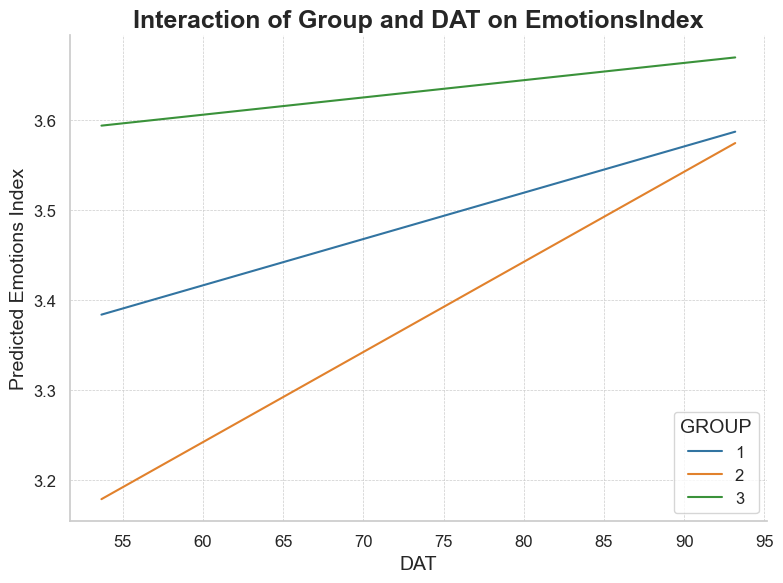

In [694]:
# Fit the model
model_dat = smf.ols('EmotionsIndex ~ GROUP * DAT', data=df).fit()
robust_model_dat = model_dat.get_robustcov_results(cov_type='HC3')

# Display the model summary
print(robust_model_dat.summary())

# Prepare for plotting
# Define the levels of GROUP and create predictions for each level
group_levels = df['GROUP'].unique()
dat_range = np.linspace(df['DAT'].min(), df['DAT'].max(), 100)

# Create a DataFrame for predictions
pred_data = pd.DataFrame({
    'DAT': np.tile(dat_range, len(group_levels)),
    'GROUP': np.repeat(group_levels, len(dat_range))
})

# Add predictions to the DataFrame
pred_data['EmotionsIndex_pred'] = robust_model_dat.predict(pred_data)

# Set your custom color palette
palette = {1: '#3274A1', 2: '#E1812C', 3: '#3A923A'}

# Plot the interaction
plt.figure(figsize=(8, 6))
sns.lineplot(x='DAT', y='EmotionsIndex_pred', hue='GROUP', data=pred_data, palette=palette)

# Adding labels and title with larger font sizes for academic style
plt.title('Interaction of Group and DAT on EmotionsIndex', fontsize=18, weight='bold')
plt.xlabel('DAT', fontsize=14)
plt.ylabel('Predicted Emotions Index', fontsize=14)
plt.legend(title='GROUP', fontsize=12, title_fontsize=14)

# Adjust aesthetics for a cleaner academic look
sns.despine()
plt.grid(True, which='both', linestyle='--', linewidth=0.5)

# Adjust tick parameters for bigger labels
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Show plot
plt.tight_layout()
plt.show()

In [387]:
# Post Motivation
model_dat = smf.ols('Post_Motivation_Index ~ GROUP * DAT_standardized + Pre_Motivation_Index_standardized', data=df).fit()
# print(model_dat.summary())
robust_model_dat = model_dat.get_robustcov_results(cov_type='HC3')
print(robust_model_dat.summary())

                              OLS Regression Results                             
Dep. Variable:     Post_Motivation_Index   R-squared:                       0.680
Model:                               OLS   Adj. R-squared:                  0.670
Method:                    Least Squares   F-statistic:                     101.4
Date:                    Mo, 07 Okt 2024   Prob (F-statistic):           2.18e-56
Time:                           21:39:48   Log-Likelihood:                -246.11
No. Observations:                    196   AIC:                             506.2
Df Residuals:                        189   BIC:                             529.2
Df Model:                              6                                         
Covariance Type:                     HC3                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------

In [388]:
# Post SelfEfficacy
model_dat = smf.ols('Post_SelfEfficacy_Index ~ GROUP * DAT_standardized + Pre_SelfEfficacy_Index_standardized', data=df).fit()
# print(model_dat.summary())
robust_model_dat = model_dat.get_robustcov_results(cov_type='HC3')
print(robust_model_dat.summary())

                               OLS Regression Results                              
Dep. Variable:     Post_SelfEfficacy_Index   R-squared:                       0.602
Model:                                 OLS   Adj. R-squared:                  0.590
Method:                      Least Squares   F-statistic:                     34.01
Date:                      Mo, 07 Okt 2024   Prob (F-statistic):           1.13e-27
Time:                             21:39:50   Log-Likelihood:                -204.38
No. Observations:                      196   AIC:                             422.8
Df Residuals:                          189   BIC:                             445.7
Df Model:                                6                                         
Covariance Type:                       HC3                                         
                                          coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------

## Participation Date

In [389]:
# Adding days since start as predictor
model_with_date = smf.ols('NoveltyIndex ~ GROUP * days_since_start', data=df).fit()
#print(model_with_date.summary())

# Get robust standard errors (HC3)
robust_model_with_date = model_with_date.get_robustcov_results(cov_type='HC3')
print(robust_model_with_date.summary())

                            OLS Regression Results                            
Dep. Variable:           NoveltyIndex   R-squared:                       0.064
Model:                            OLS   Adj. R-squared:                  0.039
Method:                 Least Squares   F-statistic:                     2.771
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):             0.0193
Time:                        21:39:53   Log-Likelihood:                -251.16
No. Observations:                 196   AIC:                             514.3
Df Residuals:                     190   BIC:                             534.0
Df Model:                           5                                         
Covariance Type:                  HC3                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Intercept         

## Self Concept Self Assessment

In [390]:
# Run OLS regression to predict NoveltyIndex based on CW_SelfConcept
model_self_assessment = smf.ols('NoveltyIndex ~ CW_SelfConcept', data=df).fit()

# Print the results
#print(model_self_assessment.summary())

# Get robust standard errors (HC3)
robust_model_self_assessment = model_self_assessment.get_robustcov_results(cov_type='HC3')
print(robust_model_self_assessment.summary())

                            OLS Regression Results                            
Dep. Variable:           NoveltyIndex   R-squared:                       0.018
Model:                            OLS   Adj. R-squared:                  0.013
Method:                 Least Squares   F-statistic:                     3.661
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):             0.0572
Time:                        21:40:07   Log-Likelihood:                -255.83
No. Observations:                 196   AIC:                             515.7
Df Residuals:                     194   BIC:                             522.2
Df Model:                           1                                         
Covariance Type:                  HC3                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          3.5273      0.064     54.

In [391]:
# Run OLS regression to predict UsefulnessIndex based on CW_SelfConcept
model_self_assessment = smf.ols('UsefulnessIndex ~ CW_SelfConcept', data=df).fit()

# Print the results
#print(model_self_assessment.summary())

# Get robust standard errors (HC3)
robust_model_self_assessment = model_self_assessment.get_robustcov_results(cov_type='HC3')
print(robust_model_self_assessment.summary())

                            OLS Regression Results                            
Dep. Variable:        UsefulnessIndex   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                  0.010
Method:                 Least Squares   F-statistic:                     2.949
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):             0.0875
Time:                        21:40:13   Log-Likelihood:                -264.31
No. Observations:                 196   AIC:                             532.6
Df Residuals:                     194   BIC:                             539.2
Df Model:                           1                                         
Covariance Type:                  HC3                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          4.0947      0.067     61.

In [392]:
# Run OLS regression to predict EmotionsIndex based on CW_SelfConcept
model_self_assessment = smf.ols('EmotionsIndex ~ CW_SelfConcept', data=df).fit()

# Print the results
#print(model_self_assessment.summary())

# Get robust standard errors (HC3)
robust_model_self_assessment = model_self_assessment.get_robustcov_results(cov_type='HC3')
print(robust_model_self_assessment.summary())

                            OLS Regression Results                            
Dep. Variable:          EmotionsIndex   R-squared:                       0.013
Model:                            OLS   Adj. R-squared:                  0.008
Method:                 Least Squares   F-statistic:                     2.191
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):              0.140
Time:                        21:40:16   Log-Likelihood:                -203.90
No. Observations:                 196   AIC:                             411.8
Df Residuals:                     194   BIC:                             418.4
Df Model:                           1                                         
Covariance Type:                  HC3                                         
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          3.5443      0.050     71.

#### Under Over Estimation?

In [393]:
df['NoveltyIndex_standardized'] = scaler.fit_transform(df[['NoveltyIndex']])

In [394]:
# Assess bias in over- or underestimation with missing data handling
def assess_bias(self_assessment_col, actual_performance_col):
    # Step 1: Drop rows where either self-assessment or actual performance is missing
    data = df[[self_assessment_col, actual_performance_col]].dropna()

    # Step 2: Calculate the difference between self-assessment and actual performance
    data['self_assessment_error'] = data[self_assessment_col] - data[actual_performance_col]

    # Step 3: Summary statistics to understand the trend of over- or underestimation
    bias_summary = data['self_assessment_error'].describe()
    print(f"\nSummary of Over- or Underestimation (Bias) for {self_assessment_col} vs {actual_performance_col}:")
    print(bias_summary)

    # Step 4: Calculate the mean difference to assess bias (positive = overestimation, negative = underestimation)
    mean_bias = data['self_assessment_error'].mean()
    print(f"\nMean Bias for {self_assessment_col} vs {actual_performance_col}: {mean_bias}")

    if mean_bias > 0:
        print("Participants tend to overestimate their skills.")
    elif mean_bias < 0:
        print("Participants tend to underestimate their skills.")
    else:
        print("Participants tend to assess their skills accurately.")

    # Step 5: Run a paired t-test to check if the difference is statistically significant
    t_stat, p_value = ttest_rel(data[self_assessment_col], data[actual_performance_col])
    print(f"\nPaired T-Test Results for {self_assessment_col} vs {actual_performance_col}: t-statistic = {t_stat}, p-value = {p_value}")

    if p_value < 0.05:
        print("The difference between self-assessment and actual performance is statistically significant.")
    else:
        print("No significant difference between self-assessment and actual performance.")

# List of variable pairs to compare (self-assessment, actual performance)
comparison_pairs = [
    ('OE_Novelty', 'NoveltyIndex'),
    ('OE_Usefulness', 'UsefulnessIndex'),
    ('OE_Emotions', 'EmotionsIndex')
]

# Loop through the pairs and assess bias
for self_assessment, actual_performance in comparison_pairs:
    assess_bias(self_assessment, actual_performance)


Summary of Over- or Underestimation (Bias) for OE_Novelty vs NoveltyIndex:
count    196.000000
mean      -0.200392
std        1.390624
min       -3.333333
25%       -1.180556
50%       -0.183333
75%        0.687500
max        3.750000
Name: self_assessment_error, dtype: float64

Mean Bias for OE_Novelty vs NoveltyIndex: -0.20039210128495838
Participants tend to underestimate their skills.

Paired T-Test Results for OE_Novelty vs NoveltyIndex: t-statistic = -2.017431580437297, p-value = 0.04502134219386686
The difference between self-assessment and actual performance is statistically significant.

Summary of Over- or Underestimation (Bias) for OE_Usefulness vs UsefulnessIndex:
count    195.000000
mean      -0.361845
std        1.332631
min       -3.875000
25%       -1.306250
50%       -0.416667
75%        0.500000
max        3.500000
Name: self_assessment_error, dtype: float64

Mean Bias for OE_Usefulness vs UsefulnessIndex: -0.36184472934472933
Participants tend to underestimate their

## Behaviour on Motivation

In [395]:
## Add Composite Score ##
model_base_self = smf.ols('Post_Motivation_Index ~ Pre_Motivation_Index_standardized  + GROUP + Composite_Score_standardized', data=df).fit()
# Print model summary
# print(model_base_self.summary())
robust_model_base_self = model_base_self.get_robustcov_results(cov_type='HC3')
print(robust_model_base_self.summary())

                              OLS Regression Results                             
Dep. Variable:     Post_Motivation_Index   R-squared:                       0.684
Model:                               OLS   Adj. R-squared:                  0.677
Method:                    Least Squares   F-statistic:                     140.6
Date:                    Mo, 07 Okt 2024   Prob (F-statistic):           5.83e-55
Time:                           21:40:25   Log-Likelihood:                -237.30
No. Observations:                    190   AIC:                             484.6
Df Residuals:                        185   BIC:                             500.8
Df Model:                              4                                         
Covariance Type:                     HC3                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------

Each of the 3 composite scores:

In [396]:
model_base_self = smf.ols('Post_Motivation_Index ~ Pre_Motivation_Index_standardized  + GROUP + Composite_Score_Factor1', data=df).fit()
# Print model summary
#print(model_base_self.summary())
robust_model_base_self = model_base_self.get_robustcov_results(cov_type='HC3')
print(robust_model_base_self.summary())

                              OLS Regression Results                             
Dep. Variable:     Post_Motivation_Index   R-squared:                       0.679
Model:                               OLS   Adj. R-squared:                  0.672
Method:                    Least Squares   F-statistic:                     137.0
Date:                    Mo, 07 Okt 2024   Prob (F-statistic):           3.51e-54
Time:                           21:40:28   Log-Likelihood:                -238.68
No. Observations:                    190   AIC:                             487.4
Df Residuals:                        185   BIC:                             503.6
Df Model:                              4                                         
Covariance Type:                     HC3                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------

In [397]:
model_base_self = smf.ols('Post_Motivation_Index ~ Pre_Motivation_Index_standardized  + GROUP + Composite_Score_Factor2', data=df).fit()
# Print model summary
#print(model_base_self.summary())
robust_model_base_self = model_base_self.get_robustcov_results(cov_type='HC3')
print(robust_model_base_self.summary())

                              OLS Regression Results                             
Dep. Variable:     Post_Motivation_Index   R-squared:                       0.686
Model:                               OLS   Adj. R-squared:                  0.679
Method:                    Least Squares   F-statistic:                     149.8
Date:                    Mo, 07 Okt 2024   Prob (F-statistic):           6.69e-57
Time:                           21:40:30   Log-Likelihood:                -236.62
No. Observations:                    190   AIC:                             483.2
Df Residuals:                        185   BIC:                             499.5
Df Model:                              4                                         
Covariance Type:                     HC3                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------

In [398]:
model_base_self = smf.ols('Post_Motivation_Index ~ Pre_Motivation_Index_standardized  + GROUP + Composite_Score_Factor2 + Composite_Score_Factor3', data=df).fit()
# Print model summary
#print(model_base_self.summary())
robust_model_base_self = model_base_self.get_robustcov_results(cov_type='HC3')
print(robust_model_base_self.summary())

                              OLS Regression Results                             
Dep. Variable:     Post_Motivation_Index   R-squared:                       0.688
Model:                               OLS   Adj. R-squared:                  0.679
Method:                    Least Squares   F-statistic:                     120.4
Date:                    Mo, 07 Okt 2024   Prob (F-statistic):           4.49e-56
Time:                           21:40:33   Log-Likelihood:                -236.13
No. Observations:                    190   AIC:                             484.3
Df Residuals:                        184   BIC:                             503.7
Df Model:                              5                                         
Covariance Type:                     HC3                                         
                                        coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------

## Each Emotional Characteristic

In [399]:
# List of emotional characteristics
outcomes = ['Funny', 'WellWritten', 'Twist', 'Enjoyed', 'Boring']

# Loop through each outcome and fit an OLS regression model
for outcome in outcomes:
    formula = f'{outcome} ~ GROUP'
    model = smf.ols(formula=formula, data=df).fit(cov_type='HC3')
    
    # Print the summary for each regression model
    print(f"Results for {outcome}:")
    print(model.summary())
    print("\n")

Results for Funny:
                            OLS Regression Results                            
Dep. Variable:                  Funny   R-squared:                       0.037
Model:                            OLS   Adj. R-squared:                  0.027
Method:                 Least Squares   F-statistic:                     3.285
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):             0.0396
Time:                        21:40:35   Log-Likelihood:                -280.45
No. Observations:                 196   AIC:                             566.9
Df Residuals:                     193   BIC:                             576.7
Df Model:                           2                                         
Covariance Type:                  HC3                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.2486      0.124 

In [400]:
## SUR ##
group_dummies = pd.get_dummies(df['GROUP'], drop_first=True)

group_dummies.columns = group_dummies.columns.astype(str)

# Define the outcome variables
Y1 = df['Funny']
Y2 = df['WellWritten']
Y3 = df['Twist']
Y4 = df['Enjoyed']
Y5 = df['BoringReversed']

X = sm.add_constant(group_dummies)

X.columns = X.columns.astype(str)

equations = {
    'Funny': (Y1, X),
    'WellWritten': (Y2, X),
    'Twist': (Y3, X),
    'Enjoyed': (Y4, X),
    'BoringReversed': (Y5, X),
}

# Fit the SUR model
model = SUR(equations=equations)
results = model.fit(cov_type='robust')

# Display the results
print(results.summary)

                           System OLS Estimation Summary                           
Estimator:                        OLS   Overall R-squared:                   0.0227
No. Equations.:                     5   McElroy's R-squared:                 0.0249
No. Observations:                 196   Judge's (OLS) R-squared:             0.0227
Date:                 Mo, Okt 07 2024   Berndt's R-squared:                  0.1162
Time:                        21:40:40   Dhrymes's R-squared:                 0.0227
                                        Cov. Estimator:                      robust
                                        Num. Constraints:                      None
                  Equation: Funny, Dependent Variable: Funny                  
            Parameter  Std. Err.     T-stat    P-value    Lower CI    Upper CI
------------------------------------------------------------------------------
const          2.2486     0.1217     18.477     0.0000      2.0101      2.4871
2           

## Each Usefulness Item

In [401]:
# Usefulness Items
outcomes = ['Feasible', 'Appropriate']

# Loop through each outcome and fit an OLS regression model
for outcome in outcomes:
    formula = f'{outcome} ~ GROUP'
    model = smf.ols(formula=formula, data=df).fit(cov_type='HC3')
    
    # Print the summary for each regression model
    print(f"Results for {outcome}:")
    print(model.summary())
    print("\n")

Results for Feasible:
                            OLS Regression Results                            
Dep. Variable:               Feasible   R-squared:                       0.011
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     1.093
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):              0.337
Time:                        21:40:44   Log-Likelihood:                -307.35
No. Observations:                 196   AIC:                             620.7
Df Residuals:                     193   BIC:                             630.5
Df Model:                           2                                         
Covariance Type:                  HC3                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.8034      0.1

## Each Novelty Item

In [402]:
# Novelty Items
outcomes = ['Rare', 'Original', 'Novel']

# Loop through each outcome and fit an OLS regression model
for outcome in outcomes:
    formula = f'{outcome} ~ GROUP'
    model = smf.ols(formula=formula, data=df).fit(cov_type='HC3')
    
    # Print the summary for each regression model
    print(f"Results for {outcome}:")
    print(model.summary())
    print("\n")

Results for Rare:
                            OLS Regression Results                            
Dep. Variable:                   Rare   R-squared:                       0.035
Model:                            OLS   Adj. R-squared:                  0.025
Method:                 Least Squares   F-statistic:                     3.447
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):             0.0338
Time:                        21:40:47   Log-Likelihood:                -272.79
No. Observations:                 196   AIC:                             551.6
Df Residuals:                     193   BIC:                             561.4
Df Model:                           2                                         
Covariance Type:                  HC3                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.5527      0.109  

## Story Words

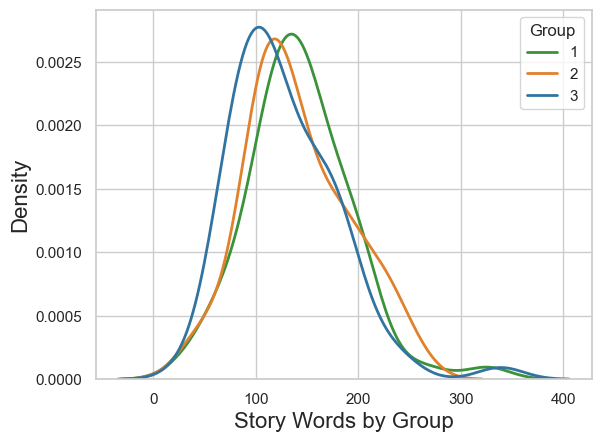

In [676]:
# Define a color palette where Group 1 is blue and Group 3 is green
palette = {1: '#3274A1', 2: '#E1812C', 3: '#3A923A'}

# Plotting the KDE plot with the new color palette
sns.kdeplot(data=df, x='Story_Words', hue='GROUP',linewidth=2, palette=palette, legend=False)
plt.legend(title='Group', loc='upper right', labels=['1', '2', '3'])
plt.xlabel('Story Words by Group', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.show()

# Evaluator Study Analysis

### Overview

In [403]:
print(df['evaluator_count'].mean())

4.821428571428571


In [404]:
rating_columns = ['NoveltyIndex', 'UsefulnessIndex', 'EmotionsIndex'] 

Z = 1.96
results = {}

# Loop through each rating type to calculate the margin of error separately
for rating_type in rating_columns:
    # Extract the ratings for the current type
    ratings = df[rating_type]
    
    # Step 1: Calculate the mean and standard deviation
    mean_ratings = np.mean(ratings)
    std_dev_ratings = np.std(ratings, ddof=1)  # Sample standard deviation
    
    # Step 2: Calculate the sample size (assuming 5 ratings per story)
    n = len(ratings)
    
    # Step 3: Compute the margin of error
    MOE = Z * (std_dev_ratings / np.sqrt(n))
    
    # Store the results
    results[rating_type] = {
        'Mean': mean_ratings,
        'Standard Deviation': std_dev_ratings,
        'Margin of Error': MOE
    }

# Convert results to a DataFrame for better visualization
results_df = pd.DataFrame(results).T  # Transpose for better readability

print(results_df)

                     Mean  Standard Deviation  Margin of Error
NoveltyIndex     3.523521            0.903146         0.126441
UsefulnessIndex  4.091121            0.941725         0.131842
EmotionsIndex    3.541942            0.691001         0.096740


## Factors On Ratings

In [405]:
df_eval['AGE'] = df_eval['AGE'].astype(int)
df_eval['EDUCATION'] = df_eval['EDUCATION'].astype(int)

In [406]:
df_eval['Age'] = scaler.fit_transform(df_eval[['AGE']])
df_eval['Education'] = scaler.fit_transform(df_eval[['EDUCATION']])

In [407]:
# List of indices to analyze
indices = ['Avg_NoveltyIndex', 'Avg_UsefulnessIndex', 'Avg_OwnershipIndex', 'Avg_EmotionsIndex']

# Factors you want to analyze (you can add more if needed)
factors = ['AGE', 'GENDER', 'EDUCATION', 'PreQGPT_AIEngaged', 'PreQGPT_AITrust', 'PreQGPT_EthicsIdea', 'PreQGPT_EthicsPublish', 'AI_Check', 'FirstSurvey']  # Replace or add any relevant factors

# Loop through each index and run the regression
for index in indices:
    formula = f'{index} ~ ' + ' + '.join(factors)
    
    # Fit the OLS regression model
    model = smf.ols(formula=formula, data=df_eval).fit(cov_type='HC3')
    
    # Print the summary for each model
    print(f"Results for {index}:")
    print(model.summary())
    print("\n")


Results for Avg_NoveltyIndex:
                            OLS Regression Results                            
Dep. Variable:       Avg_NoveltyIndex   R-squared:                       0.079
Model:                            OLS   Adj. R-squared:                  0.016
Method:                 Least Squares   F-statistic:                     1.424
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):              0.184
Time:                        21:41:09   Log-Likelihood:                -181.36
No. Observations:                 141   AIC:                             382.7
Df Residuals:                     131   BIC:                             412.2
Df Model:                           9                                         
Covariance Type:                  HC3                                         
                            coef    std err          z      P>|z|      [0.025      0.975]
-----------------------------------------------------------------------------------------


Can Evaluators find GenAI in Stories?

In [408]:
# Logistic regression model
model = smf.logit('AIUsage_None ~ OwnershipIndex', data=df).fit(cov_type='HC3')

# Print model summary
print(model.summary())

Optimization terminated successfully.
         Current function value: 0.634893
         Iterations 5
                           Logit Regression Results                           
Dep. Variable:           AIUsage_None   No. Observations:                  196
Model:                          Logit   Df Residuals:                      194
Method:                           MLE   Df Model:                            1
Date:                 Mo, 07 Okt 2024   Pseudo R-squ.:                 0.02129
Time:                        21:41:33   Log-Likelihood:                -124.44
converged:                       True   LL-Null:                       -127.15
Covariance Type:                  HC3   LLR p-value:                   0.01999
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         -1.3253      0.833     -1.592      0.111      -2.957       0.307
OwnershipIndex   

In [409]:
# Logistic regression model
model = smf.logit('AIUsage_None ~ AuthorsIdea', data=df).fit(cov_type='HC3')

# Print model summary
print(model.summary())

Optimization terminated successfully.
         Current function value: 0.648618
         Iterations 4
                           Logit Regression Results                           
Dep. Variable:           AIUsage_None   No. Observations:                  196
Model:                          Logit   Df Residuals:                      194
Method:                           MLE   Df Model:                            1
Date:                 Mo, 07 Okt 2024   Pseudo R-squ.:               0.0001282
Time:                        21:42:59   Log-Likelihood:                -127.13
converged:                       True   LL-Null:                       -127.15
Covariance Type:                  HC3   LLR p-value:                    0.8567
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.4615      0.783      0.590      0.555      -1.072       1.995
AuthorsIdea     0.0357    

In [410]:
model = smf.ols('NoveltyIndex ~ OwnershipIndex', data=df).fit(cov_type = 'HC3')
# Print model summary
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:           NoveltyIndex   R-squared:                       0.038
Model:                            OLS   Adj. R-squared:                  0.033
Method:                 Least Squares   F-statistic:                     6.843
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):            0.00960
Time:                        21:43:03   Log-Likelihood:                -253.84
No. Observations:                 196   AIC:                             511.7
Df Residuals:                     194   BIC:                             518.2
Df Model:                           1                                         
Covariance Type:                  HC3                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          2.5555      0.387      6.

In [411]:
model = smf.ols('UsefulnessIndex ~ OwnershipIndex', data=df).fit(cov_type = 'HC3')
# Print model summary
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:        UsefulnessIndex   R-squared:                       0.151
Model:                            OLS   Adj. R-squared:                  0.146
Method:                 Least Squares   F-statistic:                     32.11
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):           5.21e-08
Time:                        21:43:07   Log-Likelihood:                -249.84
No. Observations:                 196   AIC:                             503.7
Df Residuals:                     194   BIC:                             510.2
Df Model:                           1                                         
Covariance Type:                  HC3                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          2.0838      0.365      5.

In [412]:
model = smf.ols('EmotionsIndex ~ OwnershipIndex', data=df).fit(cov_type = 'HC3')
# Print model summary
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:          EmotionsIndex   R-squared:                       0.137
Model:                            OLS   Adj. R-squared:                  0.133
Method:                 Least Squares   F-statistic:                     29.03
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):           2.05e-07
Time:                        21:43:10   Log-Likelihood:                -190.68
No. Observations:                 196   AIC:                             385.4
Df Residuals:                     194   BIC:                             391.9
Df Model:                           1                                         
Covariance Type:                  HC3                                         
                     coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept          2.1350      0.270      7.

# NLP

## Cosine Similarity

In [424]:
## IF EMBEDDINGS NOT FETCHED ##
## OTHERWISE CONTINUE WITH DATA BELOW ##
import openai
openai.api_key = "API KEY"  # REPLACE WITH API KEY

def get_embedding(text, model="text-embedding-ada-002"):
    text = text.replace("\n", " ")
    response = openai.Embedding.create(input=[text], model=model)
    return response['data'][0]['embedding']

# df['EMBEDDING'] = df['STORY'].apply(lambda x: get_embedding(x))

In [662]:
# Load and merge embeddings from existing csv
df_embeddings = pd.read_csv('./data/embeddings.csv')
# Merging
df['CASE'] = df['CASE'].astype(int)
df = df.merge(df_embeddings[['CASE', 'EMBEDDING']], on='CASE', how='left')

In [663]:
print(df['EMBEDDING'].dtype)
print(df['EMBEDDING'].head())


object
0    [-0.008272713050246239, 0.05928460508584976, -...
1    [0.037017881870269775, -0.0028834808617830276,...
2    [-0.015648216009140015, 0.010680431500077248, ...
3    [0.010481078177690506, 0.05545045807957649, -0...
4    [0.009851634502410889, -0.004302880261093378, ...
Name: EMBEDDING, dtype: object


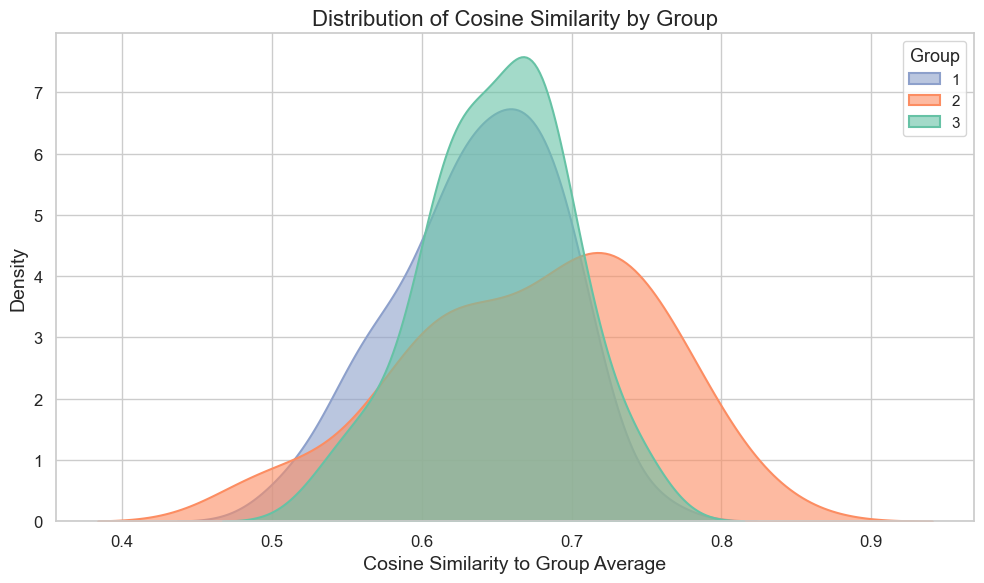

In [666]:
## Visualise ##

df['GROUP'] = df['GROUP'].astype('category')

# Calculate average embeddings for each condition
df['EMBEDDING'] = df['EMBEDDING'].apply(lambda x: np.array(json.loads(x)))
average_embeddings = df.groupby('GROUP')['EMBEDDING'].apply(lambda x: np.mean(np.stack(x), axis=0))

# Calculate cosine similarity to the average embedding within each condition
def similarity_to_condition(row):
    condition_embedding = average_embeddings[row['GROUP']]
    return 1 - cosine(row['EMBEDDING'], condition_embedding)

df['SIMILARITY'] = df.apply(similarity_to_condition, axis=1)

# Set the aesthetic style of the plots
sns.set(style="whitegrid", palette="muted", color_codes=True)

# Initialize the matplotlib figure
plt.figure(figsize=(10, 6))

# Define a color palette (optional: customize based on your preference)
palette = sns.color_palette("Set2", n_colors=df['GROUP'].nunique())

# Plot the KDE
sns.kdeplot(
    data=df, 
    x='SIMILARITY', 
    hue='GROUP', 
    palette=palette, 
    fill=True, 
    common_norm=False, 
    alpha=0.6, 
    linewidth=1.5
)

# Customize the legend
plt.legend(
    title='Group', 
    title_fontsize='13', 
    fontsize='11', 
    loc='upper right',
    labels=[str(g) for g in sorted(df['GROUP'].unique())]
)

# Set labels and title with increased font sizes
plt.xlabel('Cosine Similarity to Group Average', fontsize=14)
plt.ylabel('Density', fontsize=14)
plt.title('Distribution of Cosine Similarity by Group', fontsize=16)

# Enhance tick parameters
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Tight layout for better spacing
plt.tight_layout()

# Display the plot
plt.show()

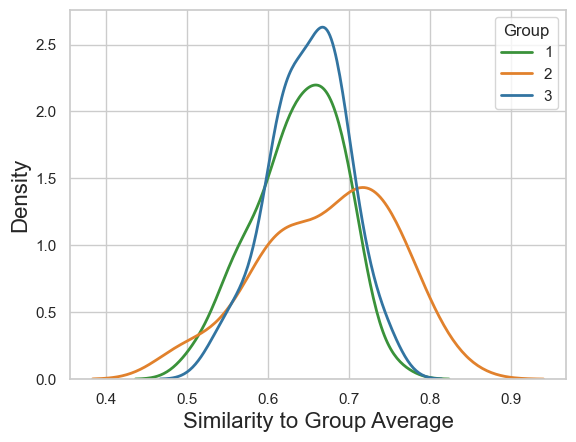

In [667]:
# Define a color palette where Group 1 is blue and Group 3 is green
palette = {1: '#3274A1', 2: '#E1812C', 3: '#3A923A'}

# Plotting the KDE plot with the new color palette
sns.kdeplot(data=df, x='SIMILARITY', hue='GROUP',linewidth=2, palette=palette, legend=False)
plt.legend(title='Group', loc='upper right', labels=['1', '2', '3'])
plt.xlabel('Similarity to Group Average', fontsize=16)
plt.ylabel('Density', fontsize=16)
plt.show()


In [668]:
# Function to calculate cosine similarity
def cosine_similarity(v1, v2):
    return np.dot(v1, v2) / (np.linalg.norm(v1) * np.linalg.norm(v2))

# Prepare embeddings for similarity computation
embeddings = list(df['EMBEDDING'])

# Calculate the similarity matrix
similarity_matrix = np.zeros((len(embeddings), len(embeddings)))

for i in range(len(embeddings)):
    for j in range(len(embeddings)):
        similarity_matrix[i][j] = cosine_similarity(embeddings[i], embeddings[j])

# Print the similarity matrix
print(similarity_matrix)

[[1.         0.41230773 0.51341885 ... 0.66609103 0.44498656 0.40273943]
 [0.41230773 1.         0.48282991 ... 0.33006296 0.52024314 0.29893923]
 [0.51341885 0.48282991 1.         ... 0.40774618 0.45504449 0.36177602]
 ...
 [0.66609103 0.33006296 0.40774618 ... 1.         0.38044209 0.33635256]
 [0.44498656 0.52024314 0.45504449 ... 0.38044209 1.         0.4153552 ]
 [0.40273943 0.29893923 0.36177602 ... 0.33635256 0.4153552  1.        ]]


In [670]:
## Effect Sizes ##

def cohen_d(group1, group2):
    # Calculate the means of the two groups
    mean1 = np.mean(group1)
    mean2 = np.mean(group2)
    
    # Calculate the pooled standard deviation
    pooled_std = np.sqrt(((len(group1) - 1) * np.std(group1, ddof=1) ** 2 + 
                          (len(group2) - 1) * np.std(group2, ddof=1) ** 2) / 
                         (len(group1) + len(group2) - 2))
    
    # Calculate Cohen's d
    d = (mean1 - mean2) / pooled_std
    return d

# Extract similarity scores for two groups
group1_sim = df[df['GROUP'] == 1]['SIMILARITY']
group2_sim = df[df['GROUP'] == 2]['SIMILARITY']
group3_sim = df[df['GROUP'] == 3]['SIMILARITY']

# Calculate Cohen's d
effect_size_d = cohen_d(group1_sim, group2_sim)
print(f"Cohen's d for Group 1 vs. Group 2: {effect_size_d}")
effect_size_d = cohen_d(group1_sim, group3_sim)
print(f"Cohen's d for Group 1 vs. Group 3: {effect_size_d}")

Cohen's d for Group 1 vs. Group 2: -0.35666784685453146
Cohen's d for Group 1 vs. Group 3: 0.2396713961129098


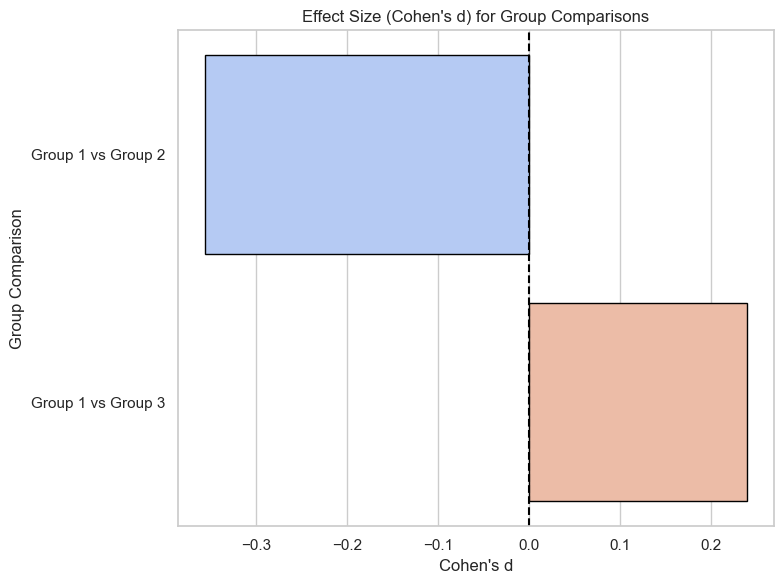

In [671]:
## Effect Size Plot ##

effect_sizes = {
    'Comparison': ['Group 1 vs Group 2', 'Group 1 vs Group 3'],
    'Cohen\'s d': [-0.35645145662784683, 0.2399282252403387]
}

# Create a DataFrame for the effect sizes
df_effect_size = pd.DataFrame(effect_sizes)

# Create the plot
plt.figure(figsize=(8, 6))
sns.barplot(x='Cohen\'s d', y='Comparison', data=df_effect_size, palette='coolwarm', edgecolor='black')

# Add a vertical line at 0 (no effect)
plt.axvline(0, color='black', linestyle='--')

# Add titles and labels
plt.title('Effect Size (Cohen\'s d) for Group Comparisons')
plt.xlabel('Cohen\'s d')
plt.ylabel('Group Comparison')

# Display the plot
plt.tight_layout()
plt.show()


## Sentiment Analysis

In [678]:
## Load and merge sentiment from existing csv ##
df_sentiment = pd.read_csv('data/sentiments.csv')
# Merging df1 with only the 'Data2' column from df2 based on 'CASE'
df = df.merge(df_sentiment[['CASE', 'Sentiment']], on='CASE', how='left')

In [674]:
## Get Sentiments ##
# Load MarianMTModel and MarianTokenizer for German to English translation
model_name = 'Helsinki-NLP/opus-mt-de-en'  # German to English model
tokenizer = MarianTokenizer.from_pretrained(model_name)
model = MarianMTModel.from_pretrained(model_name)

# Function to translate German text to English
def translate_de_to_en(text):
    # Tokenize input text
    translated = tokenizer([text], return_tensors="pt", padding=True)
    # Generate translation
    translated_ids = model.generate(**translated)
    # Decode translation
    translated_text = tokenizer.decode(translated_ids[0], skip_special_tokens=True)
    return translated_text

# Function to get sentiment of translated text
def get_sentiment_translated(text):
    try:
        # Translate from German to English
        translated_text = translate_de_to_en(text)
        # Get sentiment of the translated English text
        return TextBlob(translated_text).sentiment.polarity
    except Exception as e:
        print(f"Error: {e}")
        return None

# Apply the translation and sentiment analysis to your DataFrame
#df['Sentiment'] = df['STORY'].apply(get_sentiment_translated)

# Show the sentiment scores
#df[['STORY', 'Sentiment']].head()

In [679]:
model = smf.ols('NoveltyIndex ~ GROUP + Sentiment', data=df).fit(cov_type='HC3')
# Print model summary
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:           NoveltyIndex   R-squared:                       0.046
Model:                            OLS   Adj. R-squared:                  0.032
Method:                 Least Squares   F-statistic:                     2.777
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):             0.0425
Time:                        23:28:07   Log-Likelihood:                -252.98
No. Observations:                 196   AIC:                             514.0
Df Residuals:                     192   BIC:                             527.1
Df Model:                           3                                         
Covariance Type:                  HC3                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.6602      0.103     35.466      0.0

In [680]:
model = smf.ols('UsefulnessIndex ~ GROUP + Sentiment', data=df).fit(cov_type='HC3')
# Print model summary
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:        UsefulnessIndex   R-squared:                       0.021
Model:                            OLS   Adj. R-squared:                  0.005
Method:                 Least Squares   F-statistic:                     1.055
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):              0.369
Time:                        23:28:12   Log-Likelihood:                -263.80
No. Observations:                 196   AIC:                             535.6
Df Residuals:                     192   BIC:                             548.7
Df Model:                           3                                         
Covariance Type:                  HC3                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      4.1421      0.123     33.763      0.0

In [681]:
model = smf.ols('EmotionsIndex ~ GROUP * Sentiment', data=df).fit(cov_type='HC3')
# Print model summary
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:          EmotionsIndex   R-squared:                       0.033
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     1.229
Date:                 Mo, 07 Okt 2024   Prob (F-statistic):              0.297
Time:                        23:28:14   Log-Likelihood:                -201.91
No. Observations:                 196   AIC:                             415.8
Df Residuals:                     190   BIC:                             435.5
Df Model:                           5                                         
Covariance Type:                  HC3                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept                3.5742 

In [682]:
model = smf.ols('Post_Motivation_Index ~ GROUP + Pre_Motivation_Index_standardized + GROUP * Sentiment', data=df).fit(cov_type='HC3')
# Print model summary
print(model.summary())

                              OLS Regression Results                             
Dep. Variable:     Post_Motivation_Index   R-squared:                       0.679
Model:                               OLS   Adj. R-squared:                  0.669
Method:                    Least Squares   F-statistic:                     99.35
Date:                    Mo, 07 Okt 2024   Prob (F-statistic):           9.62e-56
Time:                           23:28:17   Log-Likelihood:                -246.45
No. Observations:                    196   AIC:                             506.9
Df Residuals:                        189   BIC:                             529.9
Df Model:                              6                                         
Covariance Type:                     HC3                                         
                                        coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------

In [683]:
model = smf.ols('Post_SelfEfficacy_Index ~ GROUP + Pre_SelfEfficacy_Index_standardized + GROUP * Sentiment', data=df).fit(cov_type='HC3')
# Print model summary
print(model.summary())

                               OLS Regression Results                              
Dep. Variable:     Post_SelfEfficacy_Index   R-squared:                       0.600
Model:                                 OLS   Adj. R-squared:                  0.587
Method:                      Least Squares   F-statistic:                     33.51
Date:                      Mo, 07 Okt 2024   Prob (F-statistic):           2.29e-27
Time:                             23:28:19   Log-Likelihood:                -204.97
No. Observations:                      196   AIC:                             423.9
Df Residuals:                          189   BIC:                             446.9
Df Model:                                6                                         
Covariance Type:                       HC3                                         
                                          coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------

Test if significantly different

In [684]:
# Perform ANOVA
anova_result = stats.f_oneway(df[df['GROUP'] == 1]['Sentiment'],
                              df[df['GROUP'] == 2]['Sentiment'],
                              df[df['GROUP'] == 3]['Sentiment'])

# Print ANOVA results
print('F-statistic:', anova_result.statistic)
print('p-value:', anova_result.pvalue)

F-statistic: 1.7249953273820546
p-value: 0.18090939203451592


In [686]:
# Separate sentiment scores based on Group
group_1 = df[df['GROUP'] == 1]['Sentiment']
group_2 = df[df['GROUP'] == 2]['Sentiment']
group_3 = df[df['GROUP'] == 3]['Sentiment']

# Perform independent t-test
t_stat, p_value = stats.ttest_ind(group_1, group_2)

# Print t-test results
print(group_1.mean())
print(group_2.mean())
print(group_3.mean())
print(group_2.mean()-group_1.mean())
print('t-statistic:', t_stat)
print('p-value:', p_value)

0.06879771956543033
0.11425292662715347
0.09433985120773677
0.04545520706172314
t-statistic: -1.8935784766141213
p-value: 0.060503309749872676


In [687]:
# Separate sentiment scores based on High_Skilled categories (0 and 1)
df['High_Skilled'] = df['High_Skilled'].astype(int)
group_0 = df[df['High_Skilled'] == 0]['Sentiment']
group_1 = df[df['High_Skilled'] == 1]['Sentiment']

# Perform independent t-test
t_stat, p_value = stats.ttest_ind(group_0, group_1)

# Print t-test results
print('t-statistic:', t_stat)
print('p-value:', p_value)

t-statistic: 1.0724942512705056
p-value: 0.2848304027535121


## Generic Phrases Analysis

### TF-IDF Analysis

In [688]:
# German stop words
german_stop_words = ['und', 'der', 'die', 'das', 'ist', 'in', 'zu', 'mit', 'auf', 'ein', 'eine', 'sich']

# Custom token pattern: at least one word in the phrase must be longer than 4 letters
token_pattern = r'\b\w{5,}\b'

# Function to perform TF-IDF analysis for a given DataFrame
def tfidf_analysis(df, group_label):
    # Create a TfidfVectorizer with custom token pattern and German stop words
    vectorizer = TfidfVectorizer(ngram_range=(2, 3), stop_words=german_stop_words, token_pattern=token_pattern)

    # Fit the vectorizer on the STORY column
    X = vectorizer.fit_transform(df['STORY'])

    tfidf_scores = pd.DataFrame(X.toarray(), columns=vectorizer.get_feature_names_out())

    # Get the most frequent bi-grams/tri-grams
    tfidf_top_phrases = tfidf_scores.sum().sort_values(ascending=False).head(10)
    
    # Print the top phrases for the group
    print(f"Top TF-IDF phrases for Group {group_label}:")
    print(tfidf_top_phrases)
    print("\n")

# Loop over each group and perform the analysis
for group in [1, 2, 3]:
    df_group = df[df['GROUP'] == group]
    tfidf_analysis(df_group, group)

Top TF-IDF phrases for Group 1:
schon immer               0.294225
unterwasser expedition    0.291605
wieder zurück             0.277179
einen großen              0.257511
wurde immer               0.255759
ihren körper              0.252444
minuten minuten           0.247580
alles immer               0.234942
immer weiter              0.232209
seine eltern              0.230940
dtype: float64


Top TF-IDF phrases for Group 2:
eines tages               0.478816
schließlich gipfel        0.396476
unterwasser expedition    0.381090
nächsten morgen           0.366659
hause zurück              0.340594
zurück oberfläche         0.320883
ihrer reise               0.305643
schutz einer              0.304286
erschöpft glücklich       0.291960
gelang ihnen              0.274699
dtype: float64


Top TF-IDF phrases for Group 3:
unter wasser         0.357792
reise mittelpunkt    0.281313
einen anderen        0.253671
meine augen          0.252113
plötzlich einen      0.218850
immer wieder        